# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [12, 48]
dtc_w1 = 1000
dtc_w2 = 100

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            )
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 400

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)), 
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.1,
    include_auxillary_loss = True,
    deeply_inject_disentengled_latents = False,
    encode_covariates=False
)

train_params = dict(
    max_epochs=1000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: wz0mq783
Name: lyric-dawn-627
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/wz0mq783
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_140459-wz0mq783/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 1/1000:   0%|          | 0/1000 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 208,359,452,183,390,302,549,143,465,377,426,372,238,289,44,213,438,295,277,533,238,279,145,54,336,148,112,288,100,83,176,187,47,327,235,161,260,149,89,188,377,452,347,968,147,365,172,189,286,321,230,142,389,248,261,390,304,608,303,296,228,598,226,141,262,332,284,737,355,337,261,362,368,367,133,227,226,152,57,130,205,500,315,279,349,223,149,225,391,162,137,105,273,394,158,163,432,76,151,294,170,369,105,244,174,218,331,136,153,298,282,109,118,368,332,366,263,42,47,222,218,269,73,202,314,256,188,242,272,200,946,262,186,518,287,151,499,345,517,462,210,455,464,283,365,231,350,243,292,307,275,245,260,403,395,256,248,180,153,597,241,236,137,162,169,155,551,255,369,218,281,411,564,396,302,251,226,224,174,177,216,197,199,257,621,345,333,351,368,7174,416,288,203,167,360,170,266,272,168,3

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 68,122,106,49,105,77,138,32,117,86,107,92,63,69,15,51,124,70,71,130,68,56,43,10,74,36,22,76,26,24,54,58,17,85,51,50,71,31,25,49,91,114,68,251,32,110,43,52,69,77,55,36,81,80,68,88,83,179,79,70,62,133,71,42,60,93,70,168,86,108,63,97,83,78,26,57,51,39,14,21,42,130,67,66,77,49,43,70,88,54,38,25,56,100,34,37,120,20,42,74,45,94,21,59,63,56,79,31,30,70,67,31,23,77,95,78,64,12,12,44,60,60,23,52,81,55,49,56,89,63,251,75,55,129,88,41,124,87,109,119,51,116,115,55,86,69,94,59,71,59,64,57,59,97,102,57,50,57,39,173,69,57,39,24,46,47,116,60,111,51,64,101,186,117,70,71,58,67,44,45,48,39,56,48,142,89,79,95,95,1733,114,61,42,44,86,47,65,60,32,66,28,76,57,79,78,132,59,70,103,20,14,42,65,74,29,61,68,95,48,49,52,71,59,73,56,47,67,50,59,59,61,115,62,70,13,49,43,114,117,132,101,72,78,61,176,131,28,

Epoch 1/1000:   0%|          | 1/1000 [00:17<4:44:41, 17.10s/it]

Epoch 1/1000:   0%|          | 1/1000 [00:17<4:44:41, 17.10s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=131]

Epoch 2/1000:   0%|          | 1/1000 [00:17<4:44:41, 17.10s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=131]

Epoch 2/1000:   0%|          | 2/1000 [00:23<3:03:21, 11.02s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=131]

Epoch 2/1000:   0%|          | 2/1000 [00:23<3:03:21, 11.02s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=62] 

Epoch 3/1000:   0%|          | 2/1000 [00:23<3:03:21, 11.02s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=62]

Epoch 3/1000:   0%|          | 3/1000 [00:30<2:29:36,  9.00s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=62]

Epoch 3/1000:   0%|          | 3/1000 [00:30<2:29:36,  9.00s/it, v_num=83_1, total_loss_train=1.3e+3, kl_local_train=5.63]

Epoch 4/1000:   0%|          | 3/1000 [00:30<2:29:36,  9.00s/it, v_num=83_1, total_loss_train=1.3e+3, kl_local_train=5.63]

Epoch 4/1000:   0%|          | 4/1000 [00:37<2:13:29,  8.04s/it, v_num=83_1, total_loss_train=1.3e+3, kl_local_train=5.63]

Epoch 4/1000:   0%|          | 4/1000 [00:37<2:13:29,  8.04s/it, v_num=83_1, total_loss_train=1.29e+3, kl_local_train=2.08]

Epoch 5/1000:   0%|          | 4/1000 [00:37<2:13:29,  8.04s/it, v_num=83_1, total_loss_train=1.29e+3, kl_local_train=2.08]

Epoch 5/1000:   0%|          | 5/1000 [00:43<2:04:47,  7.53s/it, v_num=83_1, total_loss_train=1.29e+3, kl_local_train=2.08]

Epoch 5/1000:   0%|          | 5/1000 [00:43<2:04:47,  7.53s/it, v_num=83_1, total_loss_train=1.27e+3, kl_local_train=26.7]

Epoch 6/1000:   0%|          | 5/1000 [00:43<2:04:47,  7.53s/it, v_num=83_1, total_loss_train=1.27e+3, kl_local_train=26.7]

Epoch 6/1000:   1%|          | 6/1000 [00:50<1:59:22,  7.21s/it, v_num=83_1, total_loss_train=1.27e+3, kl_local_train=26.7]

Epoch 6/1000:   1%|          | 6/1000 [00:50<1:59:22,  7.21s/it, v_num=83_1, total_loss_train=1.25e+3, kl_local_train=28.9]

Epoch 7/1000:   1%|          | 6/1000 [00:50<1:59:22,  7.21s/it, v_num=83_1, total_loss_train=1.25e+3, kl_local_train=28.9]

Epoch 7/1000:   1%|          | 7/1000 [00:56<1:55:43,  6.99s/it, v_num=83_1, total_loss_train=1.25e+3, kl_local_train=28.9]

Epoch 7/1000:   1%|          | 7/1000 [00:56<1:55:43,  6.99s/it, v_num=83_1, total_loss_train=1.24e+3, kl_local_train=32.4]

Epoch 8/1000:   1%|          | 7/1000 [00:56<1:55:43,  6.99s/it, v_num=83_1, total_loss_train=1.24e+3, kl_local_train=32.4]

Epoch 8/1000:   1%|          | 8/1000 [01:03<1:53:22,  6.86s/it, v_num=83_1, total_loss_train=1.24e+3, kl_local_train=32.4]

Epoch 8/1000:   1%|          | 8/1000 [01:03<1:53:22,  6.86s/it, v_num=83_1, total_loss_train=1.23e+3, kl_local_train=33.1]

Epoch 9/1000:   1%|          | 8/1000 [01:03<1:53:22,  6.86s/it, v_num=83_1, total_loss_train=1.23e+3, kl_local_train=33.1]

Epoch 9/1000:   1%|          | 9/1000 [01:10<1:52:15,  6.80s/it, v_num=83_1, total_loss_train=1.23e+3, kl_local_train=33.1]

Epoch 9/1000:   1%|          | 9/1000 [01:10<1:52:15,  6.80s/it, v_num=83_1, total_loss_train=1.21e+3, kl_local_train=36.8]

Epoch 10/1000:   1%|          | 9/1000 [01:10<1:52:15,  6.80s/it, v_num=83_1, total_loss_train=1.21e+3, kl_local_train=36.8]

Epoch 10/1000:   1%|          | 10/1000 [01:16<1:51:24,  6.75s/it, v_num=83_1, total_loss_train=1.21e+3, kl_local_train=36.8]

Epoch 10/1000:   1%|          | 10/1000 [01:16<1:51:24,  6.75s/it, v_num=83_1, total_loss_train=1.21e+3, kl_local_train=34.9]

Epoch 11/1000:   1%|          | 10/1000 [01:16<1:51:24,  6.75s/it, v_num=83_1, total_loss_train=1.21e+3, kl_local_train=34.9]

Epoch 11/1000:   1%|          | 11/1000 [01:23<1:50:19,  6.69s/it, v_num=83_1, total_loss_train=1.21e+3, kl_local_train=34.9]

Epoch 11/1000:   1%|          | 11/1000 [01:23<1:50:19,  6.69s/it, v_num=83_1, total_loss_train=1.2e+3, kl_local_train=34.6] 

Epoch 12/1000:   1%|          | 11/1000 [01:23<1:50:19,  6.69s/it, v_num=83_1, total_loss_train=1.2e+3, kl_local_train=34.6]

Epoch 12/1000:   1%|          | 12/1000 [01:29<1:49:24,  6.64s/it, v_num=83_1, total_loss_train=1.2e+3, kl_local_train=34.6]

Epoch 12/1000:   1%|          | 12/1000 [01:29<1:49:24,  6.64s/it, v_num=83_1, total_loss_train=1.19e+3, kl_local_train=36.1]

Epoch 13/1000:   1%|          | 12/1000 [01:29<1:49:24,  6.64s/it, v_num=83_1, total_loss_train=1.19e+3, kl_local_train=36.1]

Epoch 13/1000:   1%|▏         | 13/1000 [01:36<1:49:04,  6.63s/it, v_num=83_1, total_loss_train=1.19e+3, kl_local_train=36.1]

Epoch 13/1000:   1%|▏         | 13/1000 [01:36<1:49:04,  6.63s/it, v_num=83_1, total_loss_train=1.18e+3, kl_local_train=36.2]

Epoch 14/1000:   1%|▏         | 13/1000 [01:36<1:49:04,  6.63s/it, v_num=83_1, total_loss_train=1.18e+3, kl_local_train=36.2]

Epoch 14/1000:   1%|▏         | 14/1000 [01:42<1:48:36,  6.61s/it, v_num=83_1, total_loss_train=1.18e+3, kl_local_train=36.2]

Epoch 14/1000:   1%|▏         | 14/1000 [01:42<1:48:36,  6.61s/it, v_num=83_1, total_loss_train=1.19e+3, kl_local_train=43]  

Epoch 15/1000:   1%|▏         | 14/1000 [01:42<1:48:36,  6.61s/it, v_num=83_1, total_loss_train=1.19e+3, kl_local_train=43]

Epoch 15/1000:   2%|▏         | 15/1000 [01:49<1:48:21,  6.60s/it, v_num=83_1, total_loss_train=1.19e+3, kl_local_train=43]

Epoch 15/1000:   2%|▏         | 15/1000 [01:49<1:48:21,  6.60s/it, v_num=83_1, total_loss_train=1.2e+3, kl_local_train=54.1]

Epoch 16/1000:   2%|▏         | 15/1000 [01:49<1:48:21,  6.60s/it, v_num=83_1, total_loss_train=1.2e+3, kl_local_train=54.1]

Epoch 16/1000:   2%|▏         | 16/1000 [01:56<1:48:05,  6.59s/it, v_num=83_1, total_loss_train=1.2e+3, kl_local_train=54.1]

Epoch 16/1000:   2%|▏         | 16/1000 [01:56<1:48:05,  6.59s/it, v_num=83_1, total_loss_train=1.21e+3, kl_local_train=66.9]

Epoch 17/1000:   2%|▏         | 16/1000 [01:56<1:48:05,  6.59s/it, v_num=83_1, total_loss_train=1.21e+3, kl_local_train=66.9]

Epoch 17/1000:   2%|▏         | 17/1000 [02:02<1:47:47,  6.58s/it, v_num=83_1, total_loss_train=1.21e+3, kl_local_train=66.9]

Epoch 17/1000:   2%|▏         | 17/1000 [02:02<1:47:47,  6.58s/it, v_num=83_1, total_loss_train=1.21e+3, kl_local_train=82.6]

Epoch 18/1000:   2%|▏         | 17/1000 [02:02<1:47:47,  6.58s/it, v_num=83_1, total_loss_train=1.21e+3, kl_local_train=82.6]

Epoch 18/1000:   2%|▏         | 18/1000 [02:09<1:47:35,  6.57s/it, v_num=83_1, total_loss_train=1.21e+3, kl_local_train=82.6]

Epoch 18/1000:   2%|▏         | 18/1000 [02:09<1:47:35,  6.57s/it, v_num=83_1, total_loss_train=1.22e+3, kl_local_train=89.6]

Epoch 19/1000:   2%|▏         | 18/1000 [02:09<1:47:35,  6.57s/it, v_num=83_1, total_loss_train=1.22e+3, kl_local_train=89.6]

Epoch 19/1000:   2%|▏         | 19/1000 [02:15<1:47:14,  6.56s/it, v_num=83_1, total_loss_train=1.22e+3, kl_local_train=89.6]

Epoch 19/1000:   2%|▏         | 19/1000 [02:15<1:47:14,  6.56s/it, v_num=83_1, total_loss_train=1.23e+3, kl_local_train=106] 

Epoch 20/1000:   2%|▏         | 19/1000 [02:15<1:47:14,  6.56s/it, v_num=83_1, total_loss_train=1.23e+3, kl_local_train=106]

Epoch 20/1000:   2%|▏         | 20/1000 [02:22<1:47:39,  6.59s/it, v_num=83_1, total_loss_train=1.23e+3, kl_local_train=106]

Epoch 20/1000:   2%|▏         | 20/1000 [02:22<1:47:39,  6.59s/it, v_num=83_1, total_loss_train=1.24e+3, kl_local_train=109]

Epoch 21/1000:   2%|▏         | 20/1000 [02:22<1:47:39,  6.59s/it, v_num=83_1, total_loss_train=1.24e+3, kl_local_train=109]

Epoch 21/1000:   2%|▏         | 21/1000 [02:28<1:47:35,  6.59s/it, v_num=83_1, total_loss_train=1.24e+3, kl_local_train=109]

Epoch 21/1000:   2%|▏         | 21/1000 [02:28<1:47:35,  6.59s/it, v_num=83_1, total_loss_train=1.25e+3, kl_local_train=124]

Epoch 22/1000:   2%|▏         | 21/1000 [02:28<1:47:35,  6.59s/it, v_num=83_1, total_loss_train=1.25e+3, kl_local_train=124]

Epoch 22/1000:   2%|▏         | 22/1000 [02:35<1:47:24,  6.59s/it, v_num=83_1, total_loss_train=1.25e+3, kl_local_train=124]

Epoch 22/1000:   2%|▏         | 22/1000 [02:35<1:47:24,  6.59s/it, v_num=83_1, total_loss_train=1.26e+3, kl_local_train=128]

Epoch 23/1000:   2%|▏         | 22/1000 [02:35<1:47:24,  6.59s/it, v_num=83_1, total_loss_train=1.26e+3, kl_local_train=128]

Epoch 23/1000:   2%|▏         | 23/1000 [02:42<1:47:17,  6.59s/it, v_num=83_1, total_loss_train=1.26e+3, kl_local_train=128]

Epoch 23/1000:   2%|▏         | 23/1000 [02:42<1:47:17,  6.59s/it, v_num=83_1, total_loss_train=1.27e+3, kl_local_train=132]

Epoch 24/1000:   2%|▏         | 23/1000 [02:42<1:47:17,  6.59s/it, v_num=83_1, total_loss_train=1.27e+3, kl_local_train=132]

Epoch 24/1000:   2%|▏         | 24/1000 [02:48<1:47:00,  6.58s/it, v_num=83_1, total_loss_train=1.27e+3, kl_local_train=132]

Epoch 24/1000:   2%|▏         | 24/1000 [02:48<1:47:00,  6.58s/it, v_num=83_1, total_loss_train=1.28e+3, kl_local_train=136]

Epoch 25/1000:   2%|▏         | 24/1000 [02:48<1:47:00,  6.58s/it, v_num=83_1, total_loss_train=1.28e+3, kl_local_train=136]

Epoch 25/1000:   2%|▎         | 25/1000 [02:55<1:46:47,  6.57s/it, v_num=83_1, total_loss_train=1.28e+3, kl_local_train=136]

Epoch 25/1000:   2%|▎         | 25/1000 [02:55<1:46:47,  6.57s/it, v_num=83_1, total_loss_train=1.29e+3, kl_local_train=151]

Epoch 26/1000:   2%|▎         | 25/1000 [02:55<1:46:47,  6.57s/it, v_num=83_1, total_loss_train=1.29e+3, kl_local_train=151]

Epoch 26/1000:   3%|▎         | 26/1000 [03:01<1:46:40,  6.57s/it, v_num=83_1, total_loss_train=1.29e+3, kl_local_train=151]

Epoch 26/1000:   3%|▎         | 26/1000 [03:01<1:46:40,  6.57s/it, v_num=83_1, total_loss_train=1.3e+3, kl_local_train=158] 

Epoch 27/1000:   3%|▎         | 26/1000 [03:01<1:46:40,  6.57s/it, v_num=83_1, total_loss_train=1.3e+3, kl_local_train=158]

Epoch 27/1000:   3%|▎         | 27/1000 [03:08<1:46:32,  6.57s/it, v_num=83_1, total_loss_train=1.3e+3, kl_local_train=158]

Epoch 27/1000:   3%|▎         | 27/1000 [03:08<1:46:32,  6.57s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=155]

Epoch 28/1000:   3%|▎         | 27/1000 [03:08<1:46:32,  6.57s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=155]

Epoch 28/1000:   3%|▎         | 28/1000 [03:15<1:46:40,  6.58s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=155]

Epoch 28/1000:   3%|▎         | 28/1000 [03:15<1:46:40,  6.58s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=155]

Epoch 29/1000:   3%|▎         | 28/1000 [03:15<1:46:40,  6.58s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=155]

Epoch 29/1000:   3%|▎         | 29/1000 [03:21<1:46:40,  6.59s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=155]

Epoch 29/1000:   3%|▎         | 29/1000 [03:21<1:46:40,  6.59s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=158]

Epoch 30/1000:   3%|▎         | 29/1000 [03:21<1:46:40,  6.59s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=158]

Epoch 30/1000:   3%|▎         | 30/1000 [03:28<1:46:34,  6.59s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=158]

Epoch 30/1000:   3%|▎         | 30/1000 [03:28<1:46:34,  6.59s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=164]

Epoch 31/1000:   3%|▎         | 30/1000 [03:28<1:46:34,  6.59s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=164]

Epoch 31/1000:   3%|▎         | 31/1000 [03:34<1:46:04,  6.57s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=164]

Epoch 31/1000:   3%|▎         | 31/1000 [03:34<1:46:04,  6.57s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=172]

Epoch 32/1000:   3%|▎         | 31/1000 [03:34<1:46:04,  6.57s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=172]

Epoch 32/1000:   3%|▎         | 32/1000 [03:41<1:45:59,  6.57s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=172]

Epoch 32/1000:   3%|▎         | 32/1000 [03:41<1:45:59,  6.57s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=166]

Epoch 33/1000:   3%|▎         | 32/1000 [03:41<1:45:59,  6.57s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=166]

Epoch 33/1000:   3%|▎         | 33/1000 [03:47<1:45:52,  6.57s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=166]

Epoch 33/1000:   3%|▎         | 33/1000 [03:47<1:45:52,  6.57s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=181]

Epoch 34/1000:   3%|▎         | 33/1000 [03:47<1:45:52,  6.57s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=181]

Epoch 34/1000:   3%|▎         | 34/1000 [03:54<1:45:44,  6.57s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=181]

Epoch 34/1000:   3%|▎         | 34/1000 [03:54<1:45:44,  6.57s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=174]

Epoch 35/1000:   3%|▎         | 34/1000 [03:54<1:45:44,  6.57s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=174]

Epoch 35/1000:   4%|▎         | 35/1000 [04:00<1:45:38,  6.57s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=174]

Epoch 35/1000:   4%|▎         | 35/1000 [04:01<1:45:38,  6.57s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=163]

Epoch 36/1000:   4%|▎         | 35/1000 [04:01<1:45:38,  6.57s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=163]

Epoch 36/1000:   4%|▎         | 36/1000 [04:07<1:45:23,  6.56s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=163]

Epoch 36/1000:   4%|▎         | 36/1000 [04:07<1:45:23,  6.56s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=157] 

Epoch 37/1000:   4%|▎         | 36/1000 [04:07<1:45:23,  6.56s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=157]

Epoch 37/1000:   4%|▎         | 37/1000 [04:14<1:45:17,  6.56s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=157]

Epoch 37/1000:   4%|▎         | 37/1000 [04:14<1:45:17,  6.56s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=178]

Epoch 38/1000:   4%|▎         | 37/1000 [04:14<1:45:17,  6.56s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=178]

Epoch 38/1000:   4%|▍         | 38/1000 [04:20<1:45:21,  6.57s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=178]

Epoch 38/1000:   4%|▍         | 38/1000 [04:20<1:45:21,  6.57s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=176]

Epoch 39/1000:   4%|▍         | 38/1000 [04:20<1:45:21,  6.57s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=176]

Epoch 39/1000:   4%|▍         | 39/1000 [04:27<1:45:08,  6.56s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=176]

Epoch 39/1000:   4%|▍         | 39/1000 [04:27<1:45:08,  6.56s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=165]

Epoch 40/1000:   4%|▍         | 39/1000 [04:27<1:45:08,  6.56s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=165]

Epoch 40/1000:   4%|▍         | 40/1000 [04:33<1:44:58,  6.56s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=165]

Epoch 40/1000:   4%|▍         | 40/1000 [04:33<1:44:58,  6.56s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=187]

Epoch 41/1000:   4%|▍         | 40/1000 [04:33<1:44:58,  6.56s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=187]

Epoch 41/1000:   4%|▍         | 41/1000 [04:40<1:45:00,  6.57s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=187]

Epoch 41/1000:   4%|▍         | 41/1000 [04:40<1:45:00,  6.57s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=193]

Epoch 42/1000:   4%|▍         | 41/1000 [04:40<1:45:00,  6.57s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=193]

Epoch 42/1000:   4%|▍         | 42/1000 [04:46<1:44:53,  6.57s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=193]

Epoch 42/1000:   4%|▍         | 42/1000 [04:46<1:44:53,  6.57s/it, v_num=83_1, total_loss_train=1.46e+3, kl_local_train=180]

Epoch 43/1000:   4%|▍         | 42/1000 [04:46<1:44:53,  6.57s/it, v_num=83_1, total_loss_train=1.46e+3, kl_local_train=180]

Epoch 43/1000:   4%|▍         | 43/1000 [04:53<1:44:55,  6.58s/it, v_num=83_1, total_loss_train=1.46e+3, kl_local_train=180]

Epoch 43/1000:   4%|▍         | 43/1000 [04:53<1:44:55,  6.58s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=174]

Epoch 44/1000:   4%|▍         | 43/1000 [04:53<1:44:55,  6.58s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=174]

Epoch 44/1000:   4%|▍         | 44/1000 [05:00<1:47:45,  6.76s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=174]

Epoch 44/1000:   4%|▍         | 44/1000 [05:00<1:47:45,  6.76s/it, v_num=83_1, total_loss_train=1.48e+3, kl_local_train=183]

Epoch 45/1000:   4%|▍         | 44/1000 [05:00<1:47:45,  6.76s/it, v_num=83_1, total_loss_train=1.48e+3, kl_local_train=183]

Epoch 45/1000:   4%|▍         | 45/1000 [05:07<1:46:51,  6.71s/it, v_num=83_1, total_loss_train=1.48e+3, kl_local_train=183]

Epoch 45/1000:   4%|▍         | 45/1000 [05:07<1:46:51,  6.71s/it, v_num=83_1, total_loss_train=1.49e+3, kl_local_train=162]

Epoch 46/1000:   4%|▍         | 45/1000 [05:07<1:46:51,  6.71s/it, v_num=83_1, total_loss_train=1.49e+3, kl_local_train=162]

Epoch 46/1000:   5%|▍         | 46/1000 [05:14<1:47:17,  6.75s/it, v_num=83_1, total_loss_train=1.49e+3, kl_local_train=162]

Epoch 46/1000:   5%|▍         | 46/1000 [05:14<1:47:17,  6.75s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=166] 

Epoch 47/1000:   5%|▍         | 46/1000 [05:14<1:47:17,  6.75s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=166]

Epoch 47/1000:   5%|▍         | 47/1000 [05:20<1:46:27,  6.70s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=166]

Epoch 47/1000:   5%|▍         | 47/1000 [05:20<1:46:27,  6.70s/it, v_num=83_1, total_loss_train=1.51e+3, kl_local_train=179]

Epoch 48/1000:   5%|▍         | 47/1000 [05:20<1:46:27,  6.70s/it, v_num=83_1, total_loss_train=1.51e+3, kl_local_train=179]

Epoch 48/1000:   5%|▍         | 48/1000 [05:27<1:45:41,  6.66s/it, v_num=83_1, total_loss_train=1.51e+3, kl_local_train=179]

Epoch 48/1000:   5%|▍         | 48/1000 [05:27<1:45:41,  6.66s/it, v_num=83_1, total_loss_train=1.52e+3, kl_local_train=212]

Epoch 49/1000:   5%|▍         | 48/1000 [05:27<1:45:41,  6.66s/it, v_num=83_1, total_loss_train=1.52e+3, kl_local_train=212]

Epoch 49/1000:   5%|▍         | 49/1000 [05:33<1:45:11,  6.64s/it, v_num=83_1, total_loss_train=1.52e+3, kl_local_train=212]

Epoch 49/1000:   5%|▍         | 49/1000 [05:33<1:45:11,  6.64s/it, v_num=83_1, total_loss_train=1.53e+3, kl_local_train=192]

Epoch 50/1000:   5%|▍         | 49/1000 [05:33<1:45:11,  6.64s/it, v_num=83_1, total_loss_train=1.53e+3, kl_local_train=192]

Epoch 50/1000:   5%|▌         | 50/1000 [05:40<1:44:42,  6.61s/it, v_num=83_1, total_loss_train=1.53e+3, kl_local_train=192]

Epoch 50/1000:   5%|▌         | 50/1000 [05:40<1:44:42,  6.61s/it, v_num=83_1, total_loss_train=1.54e+3, kl_local_train=190]

Epoch 51/1000:   5%|▌         | 50/1000 [05:40<1:44:42,  6.61s/it, v_num=83_1, total_loss_train=1.54e+3, kl_local_train=190]

Epoch 51/1000:   5%|▌         | 51/1000 [05:47<1:44:20,  6.60s/it, v_num=83_1, total_loss_train=1.54e+3, kl_local_train=190]

Epoch 51/1000:   5%|▌         | 51/1000 [05:47<1:44:20,  6.60s/it, v_num=83_1, total_loss_train=1.54e+3, kl_local_train=182]

Epoch 52/1000:   5%|▌         | 51/1000 [05:47<1:44:20,  6.60s/it, v_num=83_1, total_loss_train=1.54e+3, kl_local_train=182]

Epoch 52/1000:   5%|▌         | 52/1000 [05:53<1:44:08,  6.59s/it, v_num=83_1, total_loss_train=1.54e+3, kl_local_train=182]

Epoch 52/1000:   5%|▌         | 52/1000 [05:53<1:44:08,  6.59s/it, v_num=83_1, total_loss_train=1.54e+3, kl_local_train=178]

Epoch 53/1000:   5%|▌         | 52/1000 [05:53<1:44:08,  6.59s/it, v_num=83_1, total_loss_train=1.54e+3, kl_local_train=178]

Epoch 53/1000:   5%|▌         | 53/1000 [06:00<1:44:00,  6.59s/it, v_num=83_1, total_loss_train=1.54e+3, kl_local_train=178]

Epoch 53/1000:   5%|▌         | 53/1000 [06:00<1:44:00,  6.59s/it, v_num=83_1, total_loss_train=1.53e+3, kl_local_train=165]

Epoch 54/1000:   5%|▌         | 53/1000 [06:00<1:44:00,  6.59s/it, v_num=83_1, total_loss_train=1.53e+3, kl_local_train=165]

Epoch 54/1000:   5%|▌         | 54/1000 [06:06<1:43:39,  6.57s/it, v_num=83_1, total_loss_train=1.53e+3, kl_local_train=165]

Epoch 54/1000:   5%|▌         | 54/1000 [06:06<1:43:39,  6.57s/it, v_num=83_1, total_loss_train=1.53e+3, kl_local_train=158]

Epoch 55/1000:   5%|▌         | 54/1000 [06:06<1:43:39,  6.57s/it, v_num=83_1, total_loss_train=1.53e+3, kl_local_train=158]

Epoch 55/1000:   6%|▌         | 55/1000 [06:13<1:43:31,  6.57s/it, v_num=83_1, total_loss_train=1.53e+3, kl_local_train=158]

Epoch 55/1000:   6%|▌         | 55/1000 [06:13<1:43:31,  6.57s/it, v_num=83_1, total_loss_train=1.53e+3, kl_local_train=159]

Epoch 56/1000:   6%|▌         | 55/1000 [06:13<1:43:31,  6.57s/it, v_num=83_1, total_loss_train=1.53e+3, kl_local_train=159]

Epoch 56/1000:   6%|▌         | 56/1000 [06:19<1:43:33,  6.58s/it, v_num=83_1, total_loss_train=1.53e+3, kl_local_train=159]

Epoch 56/1000:   6%|▌         | 56/1000 [06:19<1:43:33,  6.58s/it, v_num=83_1, total_loss_train=1.53e+3, kl_local_train=152]

Epoch 57/1000:   6%|▌         | 56/1000 [06:19<1:43:33,  6.58s/it, v_num=83_1, total_loss_train=1.53e+3, kl_local_train=152]

Epoch 57/1000:   6%|▌         | 57/1000 [06:26<1:43:14,  6.57s/it, v_num=83_1, total_loss_train=1.53e+3, kl_local_train=152]

Epoch 57/1000:   6%|▌         | 57/1000 [06:26<1:43:14,  6.57s/it, v_num=83_1, total_loss_train=1.52e+3, kl_local_train=165]

Epoch 58/1000:   6%|▌         | 57/1000 [06:26<1:43:14,  6.57s/it, v_num=83_1, total_loss_train=1.52e+3, kl_local_train=165]

Epoch 58/1000:   6%|▌         | 58/1000 [06:33<1:43:16,  6.58s/it, v_num=83_1, total_loss_train=1.52e+3, kl_local_train=165]

Epoch 58/1000:   6%|▌         | 58/1000 [06:33<1:43:16,  6.58s/it, v_num=83_1, total_loss_train=1.52e+3, kl_local_train=155]

Epoch 59/1000:   6%|▌         | 58/1000 [06:33<1:43:16,  6.58s/it, v_num=83_1, total_loss_train=1.52e+3, kl_local_train=155]

Epoch 59/1000:   6%|▌         | 59/1000 [06:39<1:42:54,  6.56s/it, v_num=83_1, total_loss_train=1.52e+3, kl_local_train=155]

Epoch 59/1000:   6%|▌         | 59/1000 [06:39<1:42:54,  6.56s/it, v_num=83_1, total_loss_train=1.52e+3, kl_local_train=153]

Epoch 60/1000:   6%|▌         | 59/1000 [06:39<1:42:54,  6.56s/it, v_num=83_1, total_loss_train=1.52e+3, kl_local_train=153]

Epoch 60/1000:   6%|▌         | 60/1000 [06:46<1:42:56,  6.57s/it, v_num=83_1, total_loss_train=1.52e+3, kl_local_train=153]

Epoch 60/1000:   6%|▌         | 60/1000 [06:46<1:42:56,  6.57s/it, v_num=83_1, total_loss_train=1.52e+3, kl_local_train=158]

Epoch 61/1000:   6%|▌         | 60/1000 [06:46<1:42:56,  6.57s/it, v_num=83_1, total_loss_train=1.52e+3, kl_local_train=158]

Epoch 61/1000:   6%|▌         | 61/1000 [06:52<1:42:52,  6.57s/it, v_num=83_1, total_loss_train=1.52e+3, kl_local_train=158]

Epoch 61/1000:   6%|▌         | 61/1000 [06:52<1:42:52,  6.57s/it, v_num=83_1, total_loss_train=1.51e+3, kl_local_train=142]

Epoch 62/1000:   6%|▌         | 61/1000 [06:52<1:42:52,  6.57s/it, v_num=83_1, total_loss_train=1.51e+3, kl_local_train=142]

Epoch 62/1000:   6%|▌         | 62/1000 [06:59<1:42:36,  6.56s/it, v_num=83_1, total_loss_train=1.51e+3, kl_local_train=142]

Epoch 62/1000:   6%|▌         | 62/1000 [06:59<1:42:36,  6.56s/it, v_num=83_1, total_loss_train=1.51e+3, kl_local_train=139]

Epoch 63/1000:   6%|▌         | 62/1000 [06:59<1:42:36,  6.56s/it, v_num=83_1, total_loss_train=1.51e+3, kl_local_train=139]

Epoch 63/1000:   6%|▋         | 63/1000 [07:05<1:42:29,  6.56s/it, v_num=83_1, total_loss_train=1.51e+3, kl_local_train=139]

Epoch 63/1000:   6%|▋         | 63/1000 [07:05<1:42:29,  6.56s/it, v_num=83_1, total_loss_train=1.51e+3, kl_local_train=131]

Epoch 64/1000:   6%|▋         | 63/1000 [07:05<1:42:29,  6.56s/it, v_num=83_1, total_loss_train=1.51e+3, kl_local_train=131]

Epoch 64/1000:   6%|▋         | 64/1000 [07:12<1:42:20,  6.56s/it, v_num=83_1, total_loss_train=1.51e+3, kl_local_train=131]

Epoch 64/1000:   6%|▋         | 64/1000 [07:12<1:42:20,  6.56s/it, v_num=83_1, total_loss_train=1.51e+3, kl_local_train=143]

Epoch 65/1000:   6%|▋         | 64/1000 [07:12<1:42:20,  6.56s/it, v_num=83_1, total_loss_train=1.51e+3, kl_local_train=143]

Epoch 65/1000:   6%|▋         | 65/1000 [07:18<1:42:20,  6.57s/it, v_num=83_1, total_loss_train=1.51e+3, kl_local_train=143]

Epoch 65/1000:   6%|▋         | 65/1000 [07:18<1:42:20,  6.57s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=130] 

Epoch 66/1000:   6%|▋         | 65/1000 [07:18<1:42:20,  6.57s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=130]

Epoch 66/1000:   7%|▋         | 66/1000 [07:25<1:42:37,  6.59s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=130]

Epoch 66/1000:   7%|▋         | 66/1000 [07:25<1:42:37,  6.59s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=142]

Epoch 67/1000:   7%|▋         | 66/1000 [07:25<1:42:37,  6.59s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=142]

Epoch 67/1000:   7%|▋         | 67/1000 [07:32<1:42:31,  6.59s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=142]

Epoch 67/1000:   7%|▋         | 67/1000 [07:32<1:42:31,  6.59s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=129]

Epoch 68/1000:   7%|▋         | 67/1000 [07:32<1:42:31,  6.59s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=129]

Epoch 68/1000:   7%|▋         | 68/1000 [07:38<1:42:08,  6.58s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=129]

Epoch 68/1000:   7%|▋         | 68/1000 [07:38<1:42:08,  6.58s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=129]

Epoch 69/1000:   7%|▋         | 68/1000 [07:38<1:42:08,  6.58s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=129]

Epoch 69/1000:   7%|▋         | 69/1000 [07:45<1:41:55,  6.57s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=129]

Epoch 69/1000:   7%|▋         | 69/1000 [07:45<1:41:55,  6.57s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=121]

Epoch 70/1000:   7%|▋         | 69/1000 [07:45<1:41:55,  6.57s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=121]

Epoch 70/1000:   7%|▋         | 70/1000 [07:51<1:41:48,  6.57s/it, v_num=83_1, total_loss_train=1.5e+3, kl_local_train=121]

Epoch 70/1000:   7%|▋         | 70/1000 [07:51<1:41:48,  6.57s/it, v_num=83_1, total_loss_train=1.49e+3, kl_local_train=108]

Epoch 71/1000:   7%|▋         | 70/1000 [07:51<1:41:48,  6.57s/it, v_num=83_1, total_loss_train=1.49e+3, kl_local_train=108]

Epoch 71/1000:   7%|▋         | 71/1000 [07:58<1:41:53,  6.58s/it, v_num=83_1, total_loss_train=1.49e+3, kl_local_train=108]

Epoch 71/1000:   7%|▋         | 71/1000 [07:58<1:41:53,  6.58s/it, v_num=83_1, total_loss_train=1.49e+3, kl_local_train=122]

Epoch 72/1000:   7%|▋         | 71/1000 [07:58<1:41:53,  6.58s/it, v_num=83_1, total_loss_train=1.49e+3, kl_local_train=122]

Epoch 72/1000:   7%|▋         | 72/1000 [08:05<1:41:35,  6.57s/it, v_num=83_1, total_loss_train=1.49e+3, kl_local_train=122]

Epoch 72/1000:   7%|▋         | 72/1000 [08:05<1:41:35,  6.57s/it, v_num=83_1, total_loss_train=1.49e+3, kl_local_train=117]

Epoch 73/1000:   7%|▋         | 72/1000 [08:05<1:41:35,  6.57s/it, v_num=83_1, total_loss_train=1.49e+3, kl_local_train=117]

Epoch 73/1000:   7%|▋         | 73/1000 [08:11<1:41:29,  6.57s/it, v_num=83_1, total_loss_train=1.49e+3, kl_local_train=117]

Epoch 73/1000:   7%|▋         | 73/1000 [08:11<1:41:29,  6.57s/it, v_num=83_1, total_loss_train=1.48e+3, kl_local_train=115]

Epoch 74/1000:   7%|▋         | 73/1000 [08:11<1:41:29,  6.57s/it, v_num=83_1, total_loss_train=1.48e+3, kl_local_train=115]

Epoch 74/1000:   7%|▋         | 74/1000 [08:18<1:41:20,  6.57s/it, v_num=83_1, total_loss_train=1.48e+3, kl_local_train=115]

Epoch 74/1000:   7%|▋         | 74/1000 [08:18<1:41:20,  6.57s/it, v_num=83_1, total_loss_train=1.49e+3, kl_local_train=119]

Epoch 75/1000:   7%|▋         | 74/1000 [08:18<1:41:20,  6.57s/it, v_num=83_1, total_loss_train=1.49e+3, kl_local_train=119]

Epoch 75/1000:   8%|▊         | 75/1000 [08:24<1:41:03,  6.55s/it, v_num=83_1, total_loss_train=1.49e+3, kl_local_train=119]

Epoch 75/1000:   8%|▊         | 75/1000 [08:24<1:41:03,  6.55s/it, v_num=83_1, total_loss_train=1.48e+3, kl_local_train=126]

Epoch 76/1000:   8%|▊         | 75/1000 [08:24<1:41:03,  6.55s/it, v_num=83_1, total_loss_train=1.48e+3, kl_local_train=126]

Epoch 76/1000:   8%|▊         | 76/1000 [08:31<1:41:02,  6.56s/it, v_num=83_1, total_loss_train=1.48e+3, kl_local_train=126]

Epoch 76/1000:   8%|▊         | 76/1000 [08:31<1:41:02,  6.56s/it, v_num=83_1, total_loss_train=1.48e+3, kl_local_train=115]

Epoch 77/1000:   8%|▊         | 76/1000 [08:31<1:41:02,  6.56s/it, v_num=83_1, total_loss_train=1.48e+3, kl_local_train=115]

Epoch 77/1000:   8%|▊         | 77/1000 [08:37<1:40:50,  6.56s/it, v_num=83_1, total_loss_train=1.48e+3, kl_local_train=115]

Epoch 77/1000:   8%|▊         | 77/1000 [08:37<1:40:50,  6.56s/it, v_num=83_1, total_loss_train=1.48e+3, kl_local_train=111]

Epoch 78/1000:   8%|▊         | 77/1000 [08:37<1:40:50,  6.56s/it, v_num=83_1, total_loss_train=1.48e+3, kl_local_train=111]

Epoch 78/1000:   8%|▊         | 78/1000 [08:44<1:40:50,  6.56s/it, v_num=83_1, total_loss_train=1.48e+3, kl_local_train=111]

Epoch 78/1000:   8%|▊         | 78/1000 [08:44<1:40:50,  6.56s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=104]

Epoch 79/1000:   8%|▊         | 78/1000 [08:44<1:40:50,  6.56s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=104]

Epoch 79/1000:   8%|▊         | 79/1000 [08:50<1:40:39,  6.56s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=104]

Epoch 79/1000:   8%|▊         | 79/1000 [08:50<1:40:39,  6.56s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=103]

Epoch 80/1000:   8%|▊         | 79/1000 [08:50<1:40:39,  6.56s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=103]

Epoch 80/1000:   8%|▊         | 80/1000 [08:57<1:40:31,  6.56s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=103]

Epoch 80/1000:   8%|▊         | 80/1000 [08:57<1:40:31,  6.56s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=108]

Epoch 81/1000:   8%|▊         | 80/1000 [08:57<1:40:31,  6.56s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=108]

Epoch 81/1000:   8%|▊         | 81/1000 [09:04<1:40:25,  6.56s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=108]

Epoch 81/1000:   8%|▊         | 81/1000 [09:04<1:40:25,  6.56s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=102]

Epoch 82/1000:   8%|▊         | 81/1000 [09:04<1:40:25,  6.56s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=102]

Epoch 82/1000:   8%|▊         | 82/1000 [09:10<1:40:14,  6.55s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=102]

Epoch 82/1000:   8%|▊         | 82/1000 [09:10<1:40:14,  6.55s/it, v_num=83_1, total_loss_train=1.46e+3, kl_local_train=103]

Epoch 83/1000:   8%|▊         | 82/1000 [09:10<1:40:14,  6.55s/it, v_num=83_1, total_loss_train=1.46e+3, kl_local_train=103]

Epoch 83/1000:   8%|▊         | 83/1000 [09:17<1:40:01,  6.54s/it, v_num=83_1, total_loss_train=1.46e+3, kl_local_train=103]

Epoch 83/1000:   8%|▊         | 83/1000 [09:17<1:40:01,  6.54s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=109]

Epoch 84/1000:   8%|▊         | 83/1000 [09:17<1:40:01,  6.54s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=109]

Epoch 84/1000:   8%|▊         | 84/1000 [09:23<1:40:03,  6.55s/it, v_num=83_1, total_loss_train=1.47e+3, kl_local_train=109]

Epoch 84/1000:   8%|▊         | 84/1000 [09:23<1:40:03,  6.55s/it, v_num=83_1, total_loss_train=1.46e+3, kl_local_train=105]

Epoch 85/1000:   8%|▊         | 84/1000 [09:23<1:40:03,  6.55s/it, v_num=83_1, total_loss_train=1.46e+3, kl_local_train=105]

Epoch 85/1000:   8%|▊         | 85/1000 [09:30<1:39:55,  6.55s/it, v_num=83_1, total_loss_train=1.46e+3, kl_local_train=105]

Epoch 85/1000:   8%|▊         | 85/1000 [09:30<1:39:55,  6.55s/it, v_num=83_1, total_loss_train=1.46e+3, kl_local_train=96.9]

Epoch 86/1000:   8%|▊         | 85/1000 [09:30<1:39:55,  6.55s/it, v_num=83_1, total_loss_train=1.46e+3, kl_local_train=96.9]

Epoch 86/1000:   9%|▊         | 86/1000 [09:36<1:39:45,  6.55s/it, v_num=83_1, total_loss_train=1.46e+3, kl_local_train=96.9]

Epoch 86/1000:   9%|▊         | 86/1000 [09:36<1:39:45,  6.55s/it, v_num=83_1, total_loss_train=1.46e+3, kl_local_train=90]  

Epoch 87/1000:   9%|▊         | 86/1000 [09:36<1:39:45,  6.55s/it, v_num=83_1, total_loss_train=1.46e+3, kl_local_train=90]

Epoch 87/1000:   9%|▊         | 87/1000 [09:43<1:39:30,  6.54s/it, v_num=83_1, total_loss_train=1.46e+3, kl_local_train=90]

Epoch 87/1000:   9%|▊         | 87/1000 [09:43<1:39:30,  6.54s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=94.3]

Epoch 88/1000:   9%|▊         | 87/1000 [09:43<1:39:30,  6.54s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=94.3]

Epoch 88/1000:   9%|▉         | 88/1000 [09:49<1:39:15,  6.53s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=94.3]

Epoch 88/1000:   9%|▉         | 88/1000 [09:49<1:39:15,  6.53s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=93.9]

Epoch 89/1000:   9%|▉         | 88/1000 [09:49<1:39:15,  6.53s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=93.9]

Epoch 89/1000:   9%|▉         | 89/1000 [09:56<1:39:11,  6.53s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=93.9]

Epoch 89/1000:   9%|▉         | 89/1000 [09:56<1:39:11,  6.53s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=97.3]

Epoch 90/1000:   9%|▉         | 89/1000 [09:56<1:39:11,  6.53s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=97.3]

Epoch 90/1000:   9%|▉         | 90/1000 [10:02<1:38:54,  6.52s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=97.3]

Epoch 90/1000:   9%|▉         | 90/1000 [10:02<1:38:54,  6.52s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=94.3]

Epoch 91/1000:   9%|▉         | 90/1000 [10:02<1:38:54,  6.52s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=94.3]

Epoch 91/1000:   9%|▉         | 91/1000 [10:09<1:39:04,  6.54s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=94.3]

Epoch 91/1000:   9%|▉         | 91/1000 [10:09<1:39:04,  6.54s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=90.4]

Epoch 92/1000:   9%|▉         | 91/1000 [10:09<1:39:04,  6.54s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=90.4]

Epoch 92/1000:   9%|▉         | 92/1000 [10:16<1:39:27,  6.57s/it, v_num=83_1, total_loss_train=1.45e+3, kl_local_train=90.4]

Epoch 92/1000:   9%|▉         | 92/1000 [10:16<1:39:27,  6.57s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=87.7]

Epoch 93/1000:   9%|▉         | 92/1000 [10:16<1:39:27,  6.57s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=87.7]

Epoch 93/1000:   9%|▉         | 93/1000 [10:22<1:39:12,  6.56s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=87.7]

Epoch 93/1000:   9%|▉         | 93/1000 [10:22<1:39:12,  6.56s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=96.6]

Epoch 94/1000:   9%|▉         | 93/1000 [10:22<1:39:12,  6.56s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=96.6]

Epoch 94/1000:   9%|▉         | 94/1000 [10:29<1:38:55,  6.55s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=96.6]

Epoch 94/1000:   9%|▉         | 94/1000 [10:29<1:38:55,  6.55s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=96.4]

Epoch 95/1000:   9%|▉         | 94/1000 [10:29<1:38:55,  6.55s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=96.4]

Epoch 95/1000:  10%|▉         | 95/1000 [10:35<1:38:40,  6.54s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=96.4]

Epoch 95/1000:  10%|▉         | 95/1000 [10:35<1:38:40,  6.54s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=84.9]

Epoch 96/1000:  10%|▉         | 95/1000 [10:35<1:38:40,  6.54s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=84.9]

Epoch 96/1000:  10%|▉         | 96/1000 [10:42<1:38:28,  6.54s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=84.9]

Epoch 96/1000:  10%|▉         | 96/1000 [10:42<1:38:28,  6.54s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=91.3]

Epoch 97/1000:  10%|▉         | 96/1000 [10:42<1:38:28,  6.54s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=91.3]

Epoch 97/1000:  10%|▉         | 97/1000 [10:48<1:38:26,  6.54s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=91.3]

Epoch 97/1000:  10%|▉         | 97/1000 [10:48<1:38:26,  6.54s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=86.7]

Epoch 98/1000:  10%|▉         | 97/1000 [10:48<1:38:26,  6.54s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=86.7]

Epoch 98/1000:  10%|▉         | 98/1000 [10:55<1:38:15,  6.54s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=86.7]

Epoch 98/1000:  10%|▉         | 98/1000 [10:55<1:38:15,  6.54s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=86.3]

Epoch 99/1000:  10%|▉         | 98/1000 [10:55<1:38:15,  6.54s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=86.3]

Epoch 99/1000:  10%|▉         | 99/1000 [11:01<1:38:10,  6.54s/it, v_num=83_1, total_loss_train=1.44e+3, kl_local_train=86.3]

Epoch 99/1000:  10%|▉         | 99/1000 [11:01<1:38:10,  6.54s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=90.8]

Epoch 100/1000:  10%|▉         | 99/1000 [11:01<1:38:10,  6.54s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=90.8]

Epoch 100/1000:  10%|█         | 100/1000 [11:08<1:38:03,  6.54s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=90.8]

Epoch 100/1000:  10%|█         | 100/1000 [11:08<1:38:03,  6.54s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=90.6]

Epoch 101/1000:  10%|█         | 100/1000 [11:08<1:38:03,  6.54s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=90.6]

Epoch 101/1000:  10%|█         | 101/1000 [11:14<1:38:04,  6.55s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=90.6]

Epoch 101/1000:  10%|█         | 101/1000 [11:14<1:38:04,  6.55s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=93]  

Epoch 102/1000:  10%|█         | 101/1000 [11:14<1:38:04,  6.55s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=93]

Epoch 102/1000:  10%|█         | 102/1000 [11:21<1:38:05,  6.55s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=93]

Epoch 102/1000:  10%|█         | 102/1000 [11:21<1:38:05,  6.55s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=87.9]

Epoch 103/1000:  10%|█         | 102/1000 [11:21<1:38:05,  6.55s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=87.9]

Epoch 103/1000:  10%|█         | 103/1000 [11:27<1:37:52,  6.55s/it, v_num=83_1, total_loss_train=1.43e+3, kl_local_train=87.9]

Epoch 103/1000:  10%|█         | 103/1000 [11:27<1:37:52,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=84]  

Epoch 104/1000:  10%|█         | 103/1000 [11:28<1:37:52,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=84]

Epoch 104/1000:  10%|█         | 104/1000 [11:34<1:37:52,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=84]

Epoch 104/1000:  10%|█         | 104/1000 [11:34<1:37:52,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=84]

Epoch 105/1000:  10%|█         | 104/1000 [11:34<1:37:52,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=84]

Epoch 105/1000:  10%|█         | 105/1000 [11:41<1:37:38,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=84]

Epoch 105/1000:  10%|█         | 105/1000 [11:41<1:37:38,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=84.1]

Epoch 106/1000:  10%|█         | 105/1000 [11:41<1:37:38,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=84.1]

Epoch 106/1000:  11%|█         | 106/1000 [11:47<1:37:36,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=84.1]

Epoch 106/1000:  11%|█         | 106/1000 [11:47<1:37:36,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=83.2]

Epoch 107/1000:  11%|█         | 106/1000 [11:47<1:37:36,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=83.2]

Epoch 107/1000:  11%|█         | 107/1000 [11:54<1:37:31,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=83.2]

Epoch 107/1000:  11%|█         | 107/1000 [11:54<1:37:31,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=79.6]

Epoch 108/1000:  11%|█         | 107/1000 [11:54<1:37:31,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=79.6]

Epoch 108/1000:  11%|█         | 108/1000 [12:00<1:37:28,  6.56s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=79.6]

Epoch 108/1000:  11%|█         | 108/1000 [12:00<1:37:28,  6.56s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=82.6]

Epoch 109/1000:  11%|█         | 108/1000 [12:00<1:37:28,  6.56s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=82.6]

Epoch 109/1000:  11%|█         | 109/1000 [12:07<1:37:24,  6.56s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=82.6]

Epoch 109/1000:  11%|█         | 109/1000 [12:07<1:37:24,  6.56s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=83.2]

Epoch 110/1000:  11%|█         | 109/1000 [12:07<1:37:24,  6.56s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=83.2]

Epoch 110/1000:  11%|█         | 110/1000 [12:13<1:37:07,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=83.2]

Epoch 110/1000:  11%|█         | 110/1000 [12:13<1:37:07,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=82.6]

Epoch 111/1000:  11%|█         | 110/1000 [12:13<1:37:07,  6.55s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=82.6]

Epoch 111/1000:  11%|█         | 111/1000 [12:20<1:36:55,  6.54s/it, v_num=83_1, total_loss_train=1.42e+3, kl_local_train=82.6]

Epoch 111/1000:  11%|█         | 111/1000 [12:20<1:36:55,  6.54s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=81]  

Epoch 112/1000:  11%|█         | 111/1000 [12:20<1:36:55,  6.54s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=81]

Epoch 112/1000:  11%|█         | 112/1000 [12:27<1:37:07,  6.56s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=81]

Epoch 112/1000:  11%|█         | 112/1000 [12:27<1:37:07,  6.56s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=77.3]

Epoch 113/1000:  11%|█         | 112/1000 [12:27<1:37:07,  6.56s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=77.3]

Epoch 113/1000:  11%|█▏        | 113/1000 [12:33<1:37:07,  6.57s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=77.3]

Epoch 113/1000:  11%|█▏        | 113/1000 [12:33<1:37:07,  6.57s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=77.1]

Epoch 114/1000:  11%|█▏        | 113/1000 [12:33<1:37:07,  6.57s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=77.1]

Epoch 114/1000:  11%|█▏        | 114/1000 [12:40<1:37:06,  6.58s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=77.1]

Epoch 114/1000:  11%|█▏        | 114/1000 [12:40<1:37:06,  6.58s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=76.7]

Epoch 115/1000:  11%|█▏        | 114/1000 [12:40<1:37:06,  6.58s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=76.7]

Epoch 115/1000:  12%|█▏        | 115/1000 [12:46<1:36:52,  6.57s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=76.7]

Epoch 115/1000:  12%|█▏        | 115/1000 [12:46<1:36:52,  6.57s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=80.4]

Epoch 116/1000:  12%|█▏        | 115/1000 [12:46<1:36:52,  6.57s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=80.4]

Epoch 116/1000:  12%|█▏        | 116/1000 [12:53<1:36:23,  6.54s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=80.4]

Epoch 116/1000:  12%|█▏        | 116/1000 [12:53<1:36:23,  6.54s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=75.7]

Epoch 117/1000:  12%|█▏        | 116/1000 [12:53<1:36:23,  6.54s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=75.7]

Epoch 117/1000:  12%|█▏        | 117/1000 [12:59<1:36:12,  6.54s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=75.7]

Epoch 117/1000:  12%|█▏        | 117/1000 [12:59<1:36:12,  6.54s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=77.2] 

Epoch 118/1000:  12%|█▏        | 117/1000 [12:59<1:36:12,  6.54s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=77.2]

Epoch 118/1000:  12%|█▏        | 118/1000 [13:06<1:36:01,  6.53s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=77.2]

Epoch 118/1000:  12%|█▏        | 118/1000 [13:06<1:36:01,  6.53s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=80.3]

Epoch 119/1000:  12%|█▏        | 118/1000 [13:06<1:36:01,  6.53s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=80.3]

Epoch 119/1000:  12%|█▏        | 119/1000 [13:12<1:35:52,  6.53s/it, v_num=83_1, total_loss_train=1.41e+3, kl_local_train=80.3]

Epoch 119/1000:  12%|█▏        | 119/1000 [13:12<1:35:52,  6.53s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=75.1] 

Epoch 120/1000:  12%|█▏        | 119/1000 [13:12<1:35:52,  6.53s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=75.1]

Epoch 120/1000:  12%|█▏        | 120/1000 [13:19<1:35:40,  6.52s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=75.1]

Epoch 120/1000:  12%|█▏        | 120/1000 [13:19<1:35:40,  6.52s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=73.5]

Epoch 121/1000:  12%|█▏        | 120/1000 [13:19<1:35:40,  6.52s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=73.5]

Epoch 121/1000:  12%|█▏        | 121/1000 [13:25<1:35:46,  6.54s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=73.5]

Epoch 121/1000:  12%|█▏        | 121/1000 [13:25<1:35:46,  6.54s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=70.6]

Epoch 122/1000:  12%|█▏        | 121/1000 [13:25<1:35:46,  6.54s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=70.6]

Epoch 122/1000:  12%|█▏        | 122/1000 [13:32<1:35:28,  6.52s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=70.6]

Epoch 122/1000:  12%|█▏        | 122/1000 [13:32<1:35:28,  6.52s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=75.1]

Epoch 123/1000:  12%|█▏        | 122/1000 [13:32<1:35:28,  6.52s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=75.1]

Epoch 123/1000:  12%|█▏        | 123/1000 [13:38<1:35:21,  6.52s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=75.1]

Epoch 123/1000:  12%|█▏        | 123/1000 [13:38<1:35:21,  6.52s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=74.2]

Epoch 124/1000:  12%|█▏        | 123/1000 [13:38<1:35:21,  6.52s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=74.2]

Epoch 124/1000:  12%|█▏        | 124/1000 [13:45<1:35:21,  6.53s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=74.2]

Epoch 124/1000:  12%|█▏        | 124/1000 [13:45<1:35:21,  6.53s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=76.5]

Epoch 125/1000:  12%|█▏        | 124/1000 [13:45<1:35:21,  6.53s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=76.5]

Epoch 125/1000:  12%|█▎        | 125/1000 [13:51<1:35:15,  6.53s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=76.5]

Epoch 125/1000:  12%|█▎        | 125/1000 [13:51<1:35:15,  6.53s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=77.2]

Epoch 126/1000:  12%|█▎        | 125/1000 [13:51<1:35:15,  6.53s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=77.2]

Epoch 126/1000:  13%|█▎        | 126/1000 [13:58<1:35:18,  6.54s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=77.2]

Epoch 126/1000:  13%|█▎        | 126/1000 [13:58<1:35:18,  6.54s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=76.1]

Epoch 127/1000:  13%|█▎        | 126/1000 [13:58<1:35:18,  6.54s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=76.1]

Epoch 127/1000:  13%|█▎        | 127/1000 [14:05<1:35:07,  6.54s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=76.1]

Epoch 127/1000:  13%|█▎        | 127/1000 [14:05<1:35:07,  6.54s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=76.7]

Epoch 128/1000:  13%|█▎        | 127/1000 [14:05<1:35:07,  6.54s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=76.7]

Epoch 128/1000:  13%|█▎        | 128/1000 [14:11<1:35:01,  6.54s/it, v_num=83_1, total_loss_train=1.4e+3, kl_local_train=76.7]

Epoch 128/1000:  13%|█▎        | 128/1000 [14:11<1:35:01,  6.54s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=78.5]

Epoch 129/1000:  13%|█▎        | 128/1000 [14:11<1:35:01,  6.54s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=78.5]

Epoch 129/1000:  13%|█▎        | 129/1000 [14:18<1:35:03,  6.55s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=78.5]

Epoch 129/1000:  13%|█▎        | 129/1000 [14:18<1:35:03,  6.55s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=72.4]

Epoch 130/1000:  13%|█▎        | 129/1000 [14:18<1:35:03,  6.55s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=72.4]

Epoch 130/1000:  13%|█▎        | 130/1000 [14:24<1:35:04,  6.56s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=72.4]

Epoch 130/1000:  13%|█▎        | 130/1000 [14:24<1:35:04,  6.56s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=70.8]

Epoch 131/1000:  13%|█▎        | 130/1000 [14:24<1:35:04,  6.56s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=70.8]

Epoch 131/1000:  13%|█▎        | 131/1000 [14:31<1:34:45,  6.54s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=70.8]

Epoch 131/1000:  13%|█▎        | 131/1000 [14:31<1:34:45,  6.54s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=74.6]

Epoch 132/1000:  13%|█▎        | 131/1000 [14:31<1:34:45,  6.54s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=74.6]

Epoch 132/1000:  13%|█▎        | 132/1000 [14:37<1:34:40,  6.54s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=74.6]

Epoch 132/1000:  13%|█▎        | 132/1000 [14:37<1:34:40,  6.54s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=77.3]

Epoch 133/1000:  13%|█▎        | 132/1000 [14:37<1:34:40,  6.54s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=77.3]

Epoch 133/1000:  13%|█▎        | 133/1000 [14:44<1:34:36,  6.55s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=77.3]

Epoch 133/1000:  13%|█▎        | 133/1000 [14:44<1:34:36,  6.55s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=71]  

Epoch 134/1000:  13%|█▎        | 133/1000 [14:44<1:34:36,  6.55s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=71]

Epoch 134/1000:  13%|█▎        | 134/1000 [14:50<1:34:36,  6.56s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=71]

Epoch 134/1000:  13%|█▎        | 134/1000 [14:50<1:34:36,  6.56s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=75.1]

Epoch 135/1000:  13%|█▎        | 134/1000 [14:50<1:34:36,  6.56s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=75.1]

Epoch 135/1000:  14%|█▎        | 135/1000 [14:57<1:34:29,  6.55s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=75.1]

Epoch 135/1000:  14%|█▎        | 135/1000 [14:57<1:34:29,  6.55s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=76]  

Epoch 136/1000:  14%|█▎        | 135/1000 [14:57<1:34:29,  6.55s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=76]

Epoch 136/1000:  14%|█▎        | 136/1000 [15:04<1:34:28,  6.56s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=76]

Epoch 136/1000:  14%|█▎        | 136/1000 [15:04<1:34:28,  6.56s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=73.2]

Epoch 137/1000:  14%|█▎        | 136/1000 [15:04<1:34:28,  6.56s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=73.2]

Epoch 137/1000:  14%|█▎        | 137/1000 [15:10<1:34:26,  6.57s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=73.2]

Epoch 137/1000:  14%|█▎        | 137/1000 [15:10<1:34:26,  6.57s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=76.6]

Epoch 138/1000:  14%|█▎        | 137/1000 [15:10<1:34:26,  6.57s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=76.6]

Epoch 138/1000:  14%|█▍        | 138/1000 [15:17<1:34:06,  6.55s/it, v_num=83_1, total_loss_train=1.39e+3, kl_local_train=76.6]

Epoch 138/1000:  14%|█▍        | 138/1000 [15:17<1:34:06,  6.55s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=70.8]

Epoch 139/1000:  14%|█▍        | 138/1000 [15:17<1:34:06,  6.55s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=70.8]

Epoch 139/1000:  14%|█▍        | 139/1000 [15:23<1:33:59,  6.55s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=70.8]

Epoch 139/1000:  14%|█▍        | 139/1000 [15:23<1:33:59,  6.55s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=71.9]

Epoch 140/1000:  14%|█▍        | 139/1000 [15:23<1:33:59,  6.55s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=71.9]

Epoch 140/1000:  14%|█▍        | 140/1000 [15:30<1:33:17,  6.51s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=71.9]

Epoch 140/1000:  14%|█▍        | 140/1000 [15:30<1:33:17,  6.51s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=69.7]

Epoch 141/1000:  14%|█▍        | 140/1000 [15:30<1:33:17,  6.51s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=69.7]

Epoch 141/1000:  14%|█▍        | 141/1000 [15:36<1:32:40,  6.47s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=69.7]

Epoch 141/1000:  14%|█▍        | 141/1000 [15:36<1:32:40,  6.47s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=71.9]

Epoch 142/1000:  14%|█▍        | 141/1000 [15:36<1:32:40,  6.47s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=71.9]

Epoch 142/1000:  14%|█▍        | 142/1000 [15:42<1:32:06,  6.44s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=71.9]

Epoch 142/1000:  14%|█▍        | 142/1000 [15:42<1:32:06,  6.44s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=75.4]

Epoch 143/1000:  14%|█▍        | 142/1000 [15:42<1:32:06,  6.44s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=75.4]

Epoch 143/1000:  14%|█▍        | 143/1000 [15:49<1:31:50,  6.43s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=75.4]

Epoch 143/1000:  14%|█▍        | 143/1000 [15:49<1:31:50,  6.43s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=75.8]

Epoch 144/1000:  14%|█▍        | 143/1000 [15:49<1:31:50,  6.43s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=75.8]

Epoch 144/1000:  14%|█▍        | 144/1000 [15:55<1:31:32,  6.42s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=75.8]

Epoch 144/1000:  14%|█▍        | 144/1000 [15:55<1:31:32,  6.42s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=70.5]

Epoch 145/1000:  14%|█▍        | 144/1000 [15:55<1:31:32,  6.42s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=70.5]

Epoch 145/1000:  14%|█▍        | 145/1000 [16:02<1:31:27,  6.42s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=70.5]

Epoch 145/1000:  14%|█▍        | 145/1000 [16:02<1:31:27,  6.42s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=71.2]

Epoch 146/1000:  14%|█▍        | 145/1000 [16:02<1:31:27,  6.42s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=71.2]

Epoch 146/1000:  15%|█▍        | 146/1000 [16:08<1:31:17,  6.41s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=71.2]

Epoch 146/1000:  15%|█▍        | 146/1000 [16:08<1:31:17,  6.41s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=68.8]

Epoch 147/1000:  15%|█▍        | 146/1000 [16:08<1:31:17,  6.41s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=68.8]

Epoch 147/1000:  15%|█▍        | 147/1000 [16:14<1:31:15,  6.42s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=68.8]

Epoch 147/1000:  15%|█▍        | 147/1000 [16:14<1:31:15,  6.42s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=69]  

Epoch 148/1000:  15%|█▍        | 147/1000 [16:14<1:31:15,  6.42s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=69]

Epoch 148/1000:  15%|█▍        | 148/1000 [16:21<1:31:13,  6.42s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=69]

Epoch 148/1000:  15%|█▍        | 148/1000 [16:21<1:31:13,  6.42s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=73.7]

Epoch 149/1000:  15%|█▍        | 148/1000 [16:21<1:31:13,  6.42s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=73.7]

Epoch 149/1000:  15%|█▍        | 149/1000 [16:27<1:31:13,  6.43s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=73.7]

Epoch 149/1000:  15%|█▍        | 149/1000 [16:27<1:31:13,  6.43s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69]  

Epoch 150/1000:  15%|█▍        | 149/1000 [16:27<1:31:13,  6.43s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69]

Epoch 150/1000:  15%|█▌        | 150/1000 [16:34<1:30:58,  6.42s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69]

Epoch 150/1000:  15%|█▌        | 150/1000 [16:34<1:30:58,  6.42s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=72.4]

Epoch 151/1000:  15%|█▌        | 150/1000 [16:34<1:30:58,  6.42s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=72.4]

Epoch 151/1000:  15%|█▌        | 151/1000 [16:40<1:30:55,  6.43s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=72.4]

Epoch 151/1000:  15%|█▌        | 151/1000 [16:40<1:30:55,  6.43s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=73.5]

Epoch 152/1000:  15%|█▌        | 151/1000 [16:40<1:30:55,  6.43s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=73.5]

Epoch 152/1000:  15%|█▌        | 152/1000 [16:47<1:30:45,  6.42s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=73.5]

Epoch 152/1000:  15%|█▌        | 152/1000 [16:47<1:30:45,  6.42s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69.1]

Epoch 153/1000:  15%|█▌        | 152/1000 [16:47<1:30:45,  6.42s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69.1]

Epoch 153/1000:  15%|█▌        | 153/1000 [16:53<1:30:45,  6.43s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69.1]

Epoch 153/1000:  15%|█▌        | 153/1000 [16:53<1:30:45,  6.43s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=68.4]

Epoch 154/1000:  15%|█▌        | 153/1000 [16:53<1:30:45,  6.43s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=68.4]

Epoch 154/1000:  15%|█▌        | 154/1000 [16:59<1:30:38,  6.43s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=68.4]

Epoch 154/1000:  15%|█▌        | 154/1000 [16:59<1:30:38,  6.43s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=67.2]

Epoch 155/1000:  15%|█▌        | 154/1000 [16:59<1:30:38,  6.43s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=67.2]

Epoch 155/1000:  16%|█▌        | 155/1000 [17:06<1:30:22,  6.42s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=67.2]

Epoch 155/1000:  16%|█▌        | 155/1000 [17:06<1:30:22,  6.42s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=72.2]

Epoch 156/1000:  16%|█▌        | 155/1000 [17:06<1:30:22,  6.42s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=72.2]

Epoch 156/1000:  16%|█▌        | 156/1000 [17:12<1:30:13,  6.41s/it, v_num=83_1, total_loss_train=1.38e+3, kl_local_train=72.2]

Epoch 156/1000:  16%|█▌        | 156/1000 [17:12<1:30:13,  6.41s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=67.4]

Epoch 157/1000:  16%|█▌        | 156/1000 [17:12<1:30:13,  6.41s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=67.4]

Epoch 157/1000:  16%|█▌        | 157/1000 [17:19<1:30:10,  6.42s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=67.4]

Epoch 157/1000:  16%|█▌        | 157/1000 [17:19<1:30:10,  6.42s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=73]  

Epoch 158/1000:  16%|█▌        | 157/1000 [17:19<1:30:10,  6.42s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=73]

Epoch 158/1000:  16%|█▌        | 158/1000 [17:25<1:30:03,  6.42s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=73]

Epoch 158/1000:  16%|█▌        | 158/1000 [17:25<1:30:03,  6.42s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=71.1]

Epoch 159/1000:  16%|█▌        | 158/1000 [17:25<1:30:03,  6.42s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=71.1]

Epoch 159/1000:  16%|█▌        | 159/1000 [17:32<1:30:33,  6.46s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=71.1]

Epoch 159/1000:  16%|█▌        | 159/1000 [17:32<1:30:33,  6.46s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=66.7]

Epoch 160/1000:  16%|█▌        | 159/1000 [17:32<1:30:33,  6.46s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=66.7]

Epoch 160/1000:  16%|█▌        | 160/1000 [17:38<1:30:11,  6.44s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=66.7]

Epoch 160/1000:  16%|█▌        | 160/1000 [17:38<1:30:11,  6.44s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69.6]

Epoch 161/1000:  16%|█▌        | 160/1000 [17:38<1:30:11,  6.44s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69.6]

Epoch 161/1000:  16%|█▌        | 161/1000 [17:44<1:29:49,  6.42s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69.6]

Epoch 161/1000:  16%|█▌        | 161/1000 [17:44<1:29:49,  6.42s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=67.5]

Epoch 162/1000:  16%|█▌        | 161/1000 [17:44<1:29:49,  6.42s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=67.5]

Epoch 162/1000:  16%|█▌        | 162/1000 [17:51<1:29:30,  6.41s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=67.5]

Epoch 162/1000:  16%|█▌        | 162/1000 [17:51<1:29:30,  6.41s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=67.7]

Epoch 163/1000:  16%|█▌        | 162/1000 [17:51<1:29:30,  6.41s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=67.7]

Epoch 163/1000:  16%|█▋        | 163/1000 [17:57<1:29:11,  6.39s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=67.7]

Epoch 163/1000:  16%|█▋        | 163/1000 [17:57<1:29:11,  6.39s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=68.5]

Epoch 164/1000:  16%|█▋        | 163/1000 [17:57<1:29:11,  6.39s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=68.5]

Epoch 164/1000:  16%|█▋        | 164/1000 [18:04<1:29:01,  6.39s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=68.5]

Epoch 164/1000:  16%|█▋        | 164/1000 [18:04<1:29:01,  6.39s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69]  

Epoch 165/1000:  16%|█▋        | 164/1000 [18:04<1:29:01,  6.39s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69]

Epoch 165/1000:  16%|█▋        | 165/1000 [18:10<1:28:57,  6.39s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69]

Epoch 165/1000:  16%|█▋        | 165/1000 [18:10<1:28:57,  6.39s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69.7]

Epoch 166/1000:  16%|█▋        | 165/1000 [18:10<1:28:57,  6.39s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69.7]

Epoch 166/1000:  17%|█▋        | 166/1000 [18:16<1:28:46,  6.39s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69.7]

Epoch 166/1000:  17%|█▋        | 166/1000 [18:16<1:28:46,  6.39s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69.4]

Epoch 167/1000:  17%|█▋        | 166/1000 [18:16<1:28:46,  6.39s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69.4]

Epoch 167/1000:  17%|█▋        | 167/1000 [18:23<1:28:48,  6.40s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=69.4]

Epoch 167/1000:  17%|█▋        | 167/1000 [18:23<1:28:48,  6.40s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=68.6]

Epoch 168/1000:  17%|█▋        | 167/1000 [18:23<1:28:48,  6.40s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=68.6]

Epoch 168/1000:  17%|█▋        | 168/1000 [18:29<1:28:43,  6.40s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=68.6]

Epoch 168/1000:  17%|█▋        | 168/1000 [18:29<1:28:43,  6.40s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=68]  

Epoch 169/1000:  17%|█▋        | 168/1000 [18:29<1:28:43,  6.40s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=68]

Epoch 169/1000:  17%|█▋        | 169/1000 [18:35<1:28:29,  6.39s/it, v_num=83_1, total_loss_train=1.37e+3, kl_local_train=68]

Epoch 169/1000:  17%|█▋        | 169/1000 [18:35<1:28:29,  6.39s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.8]

Epoch 170/1000:  17%|█▋        | 169/1000 [18:35<1:28:29,  6.39s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.8]

Epoch 170/1000:  17%|█▋        | 170/1000 [18:42<1:28:17,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.8]

Epoch 170/1000:  17%|█▋        | 170/1000 [18:42<1:28:17,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.9]

Epoch 171/1000:  17%|█▋        | 170/1000 [18:42<1:28:17,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.9]

Epoch 171/1000:  17%|█▋        | 171/1000 [18:48<1:28:12,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.9]

Epoch 171/1000:  17%|█▋        | 171/1000 [18:48<1:28:12,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.6]

Epoch 172/1000:  17%|█▋        | 171/1000 [18:48<1:28:12,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.6]

Epoch 172/1000:  17%|█▋        | 172/1000 [18:55<1:28:07,  6.39s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.6]

Epoch 172/1000:  17%|█▋        | 172/1000 [18:55<1:28:07,  6.39s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.7]

Epoch 173/1000:  17%|█▋        | 172/1000 [18:55<1:28:07,  6.39s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.7]

Epoch 173/1000:  17%|█▋        | 173/1000 [19:01<1:28:03,  6.39s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.7]

Epoch 173/1000:  17%|█▋        | 173/1000 [19:01<1:28:03,  6.39s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.7]

Epoch 174/1000:  17%|█▋        | 173/1000 [19:01<1:28:03,  6.39s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.7]

Epoch 174/1000:  17%|█▋        | 174/1000 [19:07<1:27:54,  6.39s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.7]

Epoch 174/1000:  17%|█▋        | 174/1000 [19:07<1:27:54,  6.39s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.3]

Epoch 175/1000:  17%|█▋        | 174/1000 [19:07<1:27:54,  6.39s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.3]

Epoch 175/1000:  18%|█▊        | 175/1000 [19:14<1:27:43,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.3]

Epoch 175/1000:  18%|█▊        | 175/1000 [19:14<1:27:43,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=68.3]

Epoch 176/1000:  18%|█▊        | 175/1000 [19:14<1:27:43,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=68.3]

Epoch 176/1000:  18%|█▊        | 176/1000 [19:20<1:27:42,  6.39s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=68.3]

Epoch 176/1000:  18%|█▊        | 176/1000 [19:20<1:27:42,  6.39s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.4]

Epoch 177/1000:  18%|█▊        | 176/1000 [19:20<1:27:42,  6.39s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.4]

Epoch 177/1000:  18%|█▊        | 177/1000 [19:27<1:27:34,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.4]

Epoch 177/1000:  18%|█▊        | 177/1000 [19:27<1:27:34,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.8]

Epoch 178/1000:  18%|█▊        | 177/1000 [19:27<1:27:34,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.8]

Epoch 178/1000:  18%|█▊        | 178/1000 [19:33<1:27:24,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.8]

Epoch 178/1000:  18%|█▊        | 178/1000 [19:33<1:27:24,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=68.4]

Epoch 179/1000:  18%|█▊        | 178/1000 [19:33<1:27:24,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=68.4]

Epoch 179/1000:  18%|█▊        | 179/1000 [19:39<1:27:15,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=68.4]

Epoch 179/1000:  18%|█▊        | 179/1000 [19:39<1:27:15,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.2]

Epoch 180/1000:  18%|█▊        | 179/1000 [19:39<1:27:15,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.2]

Epoch 180/1000:  18%|█▊        | 180/1000 [19:46<1:27:12,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.2]

Epoch 180/1000:  18%|█▊        | 180/1000 [19:46<1:27:12,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.9]

Epoch 181/1000:  18%|█▊        | 180/1000 [19:46<1:27:12,  6.38s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.9]

Epoch 181/1000:  18%|█▊        | 181/1000 [19:52<1:27:22,  6.40s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.9]

Epoch 181/1000:  18%|█▊        | 181/1000 [19:52<1:27:22,  6.40s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.3]

Epoch 182/1000:  18%|█▊        | 181/1000 [19:52<1:27:22,  6.40s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.3]

Epoch 182/1000:  18%|█▊        | 182/1000 [19:59<1:27:26,  6.41s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=67.3]

Epoch 182/1000:  18%|█▊        | 182/1000 [19:59<1:27:26,  6.41s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.1]

Epoch 183/1000:  18%|█▊        | 182/1000 [19:59<1:27:26,  6.41s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.1]

Epoch 183/1000:  18%|█▊        | 183/1000 [20:05<1:27:25,  6.42s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.1]

Epoch 183/1000:  18%|█▊        | 183/1000 [20:05<1:27:25,  6.42s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.3]

Epoch 184/1000:  18%|█▊        | 183/1000 [20:05<1:27:25,  6.42s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.3]

Epoch 184/1000:  18%|█▊        | 184/1000 [20:11<1:27:19,  6.42s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.3]

Epoch 184/1000:  18%|█▊        | 184/1000 [20:11<1:27:19,  6.42s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.3]

Epoch 185/1000:  18%|█▊        | 184/1000 [20:11<1:27:19,  6.42s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.3]

Epoch 185/1000:  18%|█▊        | 185/1000 [20:18<1:27:38,  6.45s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.3]

Epoch 185/1000:  18%|█▊        | 185/1000 [20:18<1:27:38,  6.45s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.1]

Epoch 186/1000:  18%|█▊        | 185/1000 [20:18<1:27:38,  6.45s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.1]

Epoch 186/1000:  19%|█▊        | 186/1000 [20:24<1:27:17,  6.43s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=66.1]

Epoch 186/1000:  19%|█▊        | 186/1000 [20:24<1:27:17,  6.43s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.5]

Epoch 187/1000:  19%|█▊        | 186/1000 [20:24<1:27:17,  6.43s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.5]

Epoch 187/1000:  19%|█▊        | 187/1000 [20:31<1:27:52,  6.49s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.5]

Epoch 187/1000:  19%|█▊        | 187/1000 [20:31<1:27:52,  6.49s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.2]

Epoch 188/1000:  19%|█▊        | 187/1000 [20:31<1:27:52,  6.49s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.2]

Epoch 188/1000:  19%|█▉        | 188/1000 [20:37<1:27:34,  6.47s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.2]

Epoch 188/1000:  19%|█▉        | 188/1000 [20:37<1:27:34,  6.47s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.9]

Epoch 189/1000:  19%|█▉        | 188/1000 [20:37<1:27:34,  6.47s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.9]

Epoch 189/1000:  19%|█▉        | 189/1000 [20:44<1:27:21,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.9]

Epoch 189/1000:  19%|█▉        | 189/1000 [20:44<1:27:21,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=64.3]

Epoch 190/1000:  19%|█▉        | 189/1000 [20:44<1:27:21,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=64.3]

Epoch 190/1000:  19%|█▉        | 190/1000 [20:50<1:27:14,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=64.3]

Epoch 190/1000:  19%|█▉        | 190/1000 [20:50<1:27:14,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=64.4]

Epoch 191/1000:  19%|█▉        | 190/1000 [20:50<1:27:14,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=64.4]

Epoch 191/1000:  19%|█▉        | 191/1000 [20:57<1:27:05,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=64.4]

Epoch 191/1000:  19%|█▉        | 191/1000 [20:57<1:27:05,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=64.6]

Epoch 192/1000:  19%|█▉        | 191/1000 [20:57<1:27:05,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=64.6]

Epoch 192/1000:  19%|█▉        | 192/1000 [21:03<1:27:00,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=64.6]

Epoch 192/1000:  19%|█▉        | 192/1000 [21:03<1:27:00,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.1]

Epoch 193/1000:  19%|█▉        | 192/1000 [21:03<1:27:00,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.1]

Epoch 193/1000:  19%|█▉        | 193/1000 [21:10<1:26:55,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.1]

Epoch 193/1000:  19%|█▉        | 193/1000 [21:10<1:26:55,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=64.7]

Epoch 194/1000:  19%|█▉        | 193/1000 [21:10<1:26:55,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=64.7]

Epoch 194/1000:  19%|█▉        | 194/1000 [21:16<1:26:56,  6.47s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=64.7]

Epoch 194/1000:  19%|█▉        | 194/1000 [21:16<1:26:56,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=64.9]

Epoch 195/1000:  19%|█▉        | 194/1000 [21:16<1:26:56,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=64.9]

Epoch 195/1000:  20%|█▉        | 195/1000 [21:23<1:26:45,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=64.9]

Epoch 195/1000:  20%|█▉        | 195/1000 [21:23<1:26:45,  6.47s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.6]

Epoch 196/1000:  20%|█▉        | 195/1000 [21:23<1:26:45,  6.47s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.6]

Epoch 196/1000:  20%|█▉        | 196/1000 [21:29<1:26:43,  6.47s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=65.6]

Epoch 196/1000:  20%|█▉        | 196/1000 [21:29<1:26:43,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.8]

Epoch 197/1000:  20%|█▉        | 196/1000 [21:29<1:26:43,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.8]

Epoch 197/1000:  20%|█▉        | 197/1000 [21:36<1:26:36,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.8]

Epoch 197/1000:  20%|█▉        | 197/1000 [21:36<1:26:36,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=65.1]

Epoch 198/1000:  20%|█▉        | 197/1000 [21:36<1:26:36,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=65.1]

Epoch 198/1000:  20%|█▉        | 198/1000 [21:42<1:26:24,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=65.1]

Epoch 198/1000:  20%|█▉        | 198/1000 [21:42<1:26:24,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=64.5]

Epoch 199/1000:  20%|█▉        | 198/1000 [21:42<1:26:24,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=64.5]

Epoch 199/1000:  20%|█▉        | 199/1000 [21:48<1:26:15,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=64.5]

Epoch 199/1000:  20%|█▉        | 199/1000 [21:48<1:26:15,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=64.1]

Epoch 200/1000:  20%|█▉        | 199/1000 [21:48<1:26:15,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=64.1]

Epoch 200/1000:  20%|██        | 200/1000 [21:55<1:26:17,  6.47s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=64.1]

Epoch 200/1000:  20%|██        | 200/1000 [21:55<1:26:17,  6.47s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=63.9]

Epoch 201/1000:  20%|██        | 200/1000 [21:55<1:26:17,  6.47s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=63.9]

Epoch 201/1000:  20%|██        | 201/1000 [22:01<1:26:03,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=63.9]

Epoch 201/1000:  20%|██        | 201/1000 [22:01<1:26:03,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=63.7]

Epoch 202/1000:  20%|██        | 201/1000 [22:01<1:26:03,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=63.7]

Epoch 202/1000:  20%|██        | 202/1000 [22:08<1:25:56,  6.46s/it, v_num=83_1, total_loss_train=1.36e+3, kl_local_train=63.7]

Epoch 202/1000:  20%|██        | 202/1000 [22:08<1:25:56,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=64.5]

Epoch 203/1000:  20%|██        | 202/1000 [22:08<1:25:56,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=64.5]

Epoch 203/1000:  20%|██        | 203/1000 [22:14<1:25:51,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=64.5]

Epoch 203/1000:  20%|██        | 203/1000 [22:14<1:25:51,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.5]

Epoch 204/1000:  20%|██        | 203/1000 [22:14<1:25:51,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.5]

Epoch 204/1000:  20%|██        | 204/1000 [22:21<1:25:41,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.5]

Epoch 204/1000:  20%|██        | 204/1000 [22:21<1:25:41,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=64.4]

Epoch 205/1000:  20%|██        | 204/1000 [22:21<1:25:41,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=64.4]

Epoch 205/1000:  20%|██        | 205/1000 [22:27<1:25:37,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=64.4]

Epoch 205/1000:  20%|██        | 205/1000 [22:27<1:25:37,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=65]  

Epoch 206/1000:  20%|██        | 205/1000 [22:27<1:25:37,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=65]

Epoch 206/1000:  21%|██        | 206/1000 [22:34<1:25:27,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=65]

Epoch 206/1000:  21%|██        | 206/1000 [22:34<1:25:27,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.9]

Epoch 207/1000:  21%|██        | 206/1000 [22:34<1:25:27,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.9]

Epoch 207/1000:  21%|██        | 207/1000 [22:40<1:26:09,  6.52s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.9]

Epoch 207/1000:  21%|██        | 207/1000 [22:40<1:26:09,  6.52s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.8]

Epoch 208/1000:  21%|██        | 207/1000 [22:40<1:26:09,  6.52s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.8]

Epoch 208/1000:  21%|██        | 208/1000 [22:47<1:25:44,  6.50s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.8]

Epoch 208/1000:  21%|██        | 208/1000 [22:47<1:25:44,  6.50s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.8]

Epoch 209/1000:  21%|██        | 208/1000 [22:47<1:25:44,  6.50s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.8]

Epoch 209/1000:  21%|██        | 209/1000 [22:53<1:25:32,  6.49s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.8]

Epoch 209/1000:  21%|██        | 209/1000 [22:53<1:25:32,  6.49s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=64.8]

Epoch 210/1000:  21%|██        | 209/1000 [22:53<1:25:32,  6.49s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=64.8]

Epoch 210/1000:  21%|██        | 210/1000 [23:00<1:25:22,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=64.8]

Epoch 210/1000:  21%|██        | 210/1000 [23:00<1:25:22,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.1]

Epoch 211/1000:  21%|██        | 210/1000 [23:00<1:25:22,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.1]

Epoch 211/1000:  21%|██        | 211/1000 [23:06<1:25:07,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.1]

Epoch 211/1000:  21%|██        | 211/1000 [23:06<1:25:07,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.6]

Epoch 212/1000:  21%|██        | 211/1000 [23:06<1:25:07,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.6]

Epoch 212/1000:  21%|██        | 212/1000 [23:13<1:25:01,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.6]

Epoch 212/1000:  21%|██        | 212/1000 [23:13<1:25:01,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.6]

Epoch 213/1000:  21%|██        | 212/1000 [23:13<1:25:01,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.6]

Epoch 213/1000:  21%|██▏       | 213/1000 [23:19<1:24:56,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.6]

Epoch 213/1000:  21%|██▏       | 213/1000 [23:19<1:24:56,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.3]

Epoch 214/1000:  21%|██▏       | 213/1000 [23:19<1:24:56,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.3]

Epoch 214/1000:  21%|██▏       | 214/1000 [23:26<1:24:57,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.3]

Epoch 214/1000:  21%|██▏       | 214/1000 [23:26<1:24:57,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.7]

Epoch 215/1000:  21%|██▏       | 214/1000 [23:26<1:24:57,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.7]

Epoch 215/1000:  22%|██▏       | 215/1000 [23:32<1:24:44,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.7]

Epoch 215/1000:  22%|██▏       | 215/1000 [23:32<1:24:44,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.4]

Epoch 216/1000:  22%|██▏       | 215/1000 [23:32<1:24:44,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.4]

Epoch 216/1000:  22%|██▏       | 216/1000 [23:39<1:24:42,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.4]

Epoch 216/1000:  22%|██▏       | 216/1000 [23:39<1:24:42,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.6]

Epoch 217/1000:  22%|██▏       | 216/1000 [23:39<1:24:42,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.6]

Epoch 217/1000:  22%|██▏       | 217/1000 [23:45<1:24:35,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.6]

Epoch 217/1000:  22%|██▏       | 217/1000 [23:45<1:24:35,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.7]

Epoch 218/1000:  22%|██▏       | 217/1000 [23:45<1:24:35,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.7]

Epoch 218/1000:  22%|██▏       | 218/1000 [23:52<1:24:22,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.7]

Epoch 218/1000:  22%|██▏       | 218/1000 [23:52<1:24:22,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.1]

Epoch 219/1000:  22%|██▏       | 218/1000 [23:52<1:24:22,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.1]

Epoch 219/1000:  22%|██▏       | 219/1000 [23:58<1:24:16,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.1]

Epoch 219/1000:  22%|██▏       | 219/1000 [23:58<1:24:16,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.1]

Epoch 220/1000:  22%|██▏       | 219/1000 [23:58<1:24:16,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.1]

Epoch 220/1000:  22%|██▏       | 220/1000 [24:04<1:24:02,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.1]

Epoch 220/1000:  22%|██▏       | 220/1000 [24:04<1:24:02,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.2]

Epoch 221/1000:  22%|██▏       | 220/1000 [24:04<1:24:02,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.2]

Epoch 221/1000:  22%|██▏       | 221/1000 [24:11<1:23:51,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.2]

Epoch 221/1000:  22%|██▏       | 221/1000 [24:11<1:23:51,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.1]

Epoch 222/1000:  22%|██▏       | 221/1000 [24:11<1:23:51,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.1]

Epoch 222/1000:  22%|██▏       | 222/1000 [24:17<1:23:44,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.1]

Epoch 222/1000:  22%|██▏       | 222/1000 [24:17<1:23:44,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.1]

Epoch 223/1000:  22%|██▏       | 222/1000 [24:17<1:23:44,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.1]

Epoch 223/1000:  22%|██▏       | 223/1000 [24:24<1:23:52,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.1]

Epoch 223/1000:  22%|██▏       | 223/1000 [24:24<1:23:52,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.9]

Epoch 224/1000:  22%|██▏       | 223/1000 [24:24<1:23:52,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.9]

Epoch 224/1000:  22%|██▏       | 224/1000 [24:30<1:23:45,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.9]

Epoch 224/1000:  22%|██▏       | 224/1000 [24:30<1:23:45,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.7]

Epoch 225/1000:  22%|██▏       | 224/1000 [24:30<1:23:45,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.7]

Epoch 225/1000:  22%|██▎       | 225/1000 [24:37<1:23:29,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.7]

Epoch 225/1000:  22%|██▎       | 225/1000 [24:37<1:23:29,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.5]

Epoch 226/1000:  22%|██▎       | 225/1000 [24:37<1:23:29,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.5]

Epoch 226/1000:  23%|██▎       | 226/1000 [24:43<1:23:27,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.5]

Epoch 226/1000:  23%|██▎       | 226/1000 [24:43<1:23:27,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.2]

Epoch 227/1000:  23%|██▎       | 226/1000 [24:43<1:23:27,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.2]

Epoch 227/1000:  23%|██▎       | 227/1000 [24:50<1:23:19,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.2]

Epoch 227/1000:  23%|██▎       | 227/1000 [24:50<1:23:19,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63]  

Epoch 228/1000:  23%|██▎       | 227/1000 [24:50<1:23:19,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63]

Epoch 228/1000:  23%|██▎       | 228/1000 [24:56<1:23:38,  6.50s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63]

Epoch 228/1000:  23%|██▎       | 228/1000 [24:56<1:23:38,  6.50s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60]

Epoch 229/1000:  23%|██▎       | 228/1000 [24:56<1:23:38,  6.50s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60]

Epoch 229/1000:  23%|██▎       | 229/1000 [25:03<1:23:35,  6.51s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60]

Epoch 229/1000:  23%|██▎       | 229/1000 [25:03<1:23:35,  6.51s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.7]

Epoch 230/1000:  23%|██▎       | 229/1000 [25:03<1:23:35,  6.51s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.7]

Epoch 230/1000:  23%|██▎       | 230/1000 [25:09<1:23:38,  6.52s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=63.7]

Epoch 230/1000:  23%|██▎       | 230/1000 [25:09<1:23:38,  6.52s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.4]

Epoch 231/1000:  23%|██▎       | 230/1000 [25:09<1:23:38,  6.52s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.4]

Epoch 231/1000:  23%|██▎       | 231/1000 [25:16<1:23:49,  6.54s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62.4]

Epoch 231/1000:  23%|██▎       | 231/1000 [25:16<1:23:49,  6.54s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62]  

Epoch 232/1000:  23%|██▎       | 231/1000 [25:16<1:23:49,  6.54s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62]

Epoch 232/1000:  23%|██▎       | 232/1000 [25:23<1:23:58,  6.56s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62]

Epoch 232/1000:  23%|██▎       | 232/1000 [25:23<1:23:58,  6.56s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62]

Epoch 233/1000:  23%|██▎       | 232/1000 [25:23<1:23:58,  6.56s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62]

Epoch 233/1000:  23%|██▎       | 233/1000 [25:29<1:23:30,  6.53s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=62]

Epoch 233/1000:  23%|██▎       | 233/1000 [25:29<1:23:30,  6.53s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.8]

Epoch 234/1000:  23%|██▎       | 233/1000 [25:29<1:23:30,  6.53s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.8]

Epoch 234/1000:  23%|██▎       | 234/1000 [25:36<1:23:35,  6.55s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.8]

Epoch 234/1000:  23%|██▎       | 234/1000 [25:36<1:23:35,  6.55s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.2]

Epoch 235/1000:  23%|██▎       | 234/1000 [25:36<1:23:35,  6.55s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.2]

Epoch 235/1000:  24%|██▎       | 235/1000 [25:42<1:23:13,  6.53s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.2]

Epoch 235/1000:  24%|██▎       | 235/1000 [25:42<1:23:13,  6.53s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.5]

Epoch 236/1000:  24%|██▎       | 235/1000 [25:42<1:23:13,  6.53s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.5]

Epoch 236/1000:  24%|██▎       | 236/1000 [25:49<1:22:50,  6.51s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.5]

Epoch 236/1000:  24%|██▎       | 236/1000 [25:49<1:22:50,  6.51s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=59.9]

Epoch 237/1000:  24%|██▎       | 236/1000 [25:49<1:22:50,  6.51s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=59.9]

Epoch 237/1000:  24%|██▎       | 237/1000 [25:55<1:22:33,  6.49s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=59.9]

Epoch 237/1000:  24%|██▎       | 237/1000 [25:55<1:22:33,  6.49s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.1]

Epoch 238/1000:  24%|██▎       | 237/1000 [25:55<1:22:33,  6.49s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.1]

Epoch 238/1000:  24%|██▍       | 238/1000 [26:01<1:22:15,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.1]

Epoch 238/1000:  24%|██▍       | 238/1000 [26:01<1:22:15,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.9]

Epoch 239/1000:  24%|██▍       | 238/1000 [26:01<1:22:15,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.9]

Epoch 239/1000:  24%|██▍       | 239/1000 [26:08<1:22:04,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.9]

Epoch 239/1000:  24%|██▍       | 239/1000 [26:08<1:22:04,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 240/1000:  24%|██▍       | 239/1000 [26:08<1:22:04,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 240/1000:  24%|██▍       | 240/1000 [26:14<1:22:00,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 240/1000:  24%|██▍       | 240/1000 [26:14<1:22:00,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.7]

Epoch 241/1000:  24%|██▍       | 240/1000 [26:14<1:22:00,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.7]

Epoch 241/1000:  24%|██▍       | 241/1000 [26:21<1:21:49,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.7]

Epoch 241/1000:  24%|██▍       | 241/1000 [26:21<1:21:49,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.3]

Epoch 242/1000:  24%|██▍       | 241/1000 [26:21<1:21:49,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.3]

Epoch 242/1000:  24%|██▍       | 242/1000 [26:27<1:21:41,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.3]

Epoch 242/1000:  24%|██▍       | 242/1000 [26:27<1:21:41,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=60.7]

Epoch 243/1000:  24%|██▍       | 242/1000 [26:27<1:21:41,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=60.7]

Epoch 243/1000:  24%|██▍       | 243/1000 [26:34<1:21:36,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=60.7]

Epoch 243/1000:  24%|██▍       | 243/1000 [26:34<1:21:36,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.1]

Epoch 244/1000:  24%|██▍       | 243/1000 [26:34<1:21:36,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.1]

Epoch 244/1000:  24%|██▍       | 244/1000 [26:40<1:21:28,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61.1]

Epoch 244/1000:  24%|██▍       | 244/1000 [26:40<1:21:28,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.8]

Epoch 245/1000:  24%|██▍       | 244/1000 [26:40<1:21:28,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.8]

Epoch 245/1000:  24%|██▍       | 245/1000 [26:47<1:21:15,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.8]

Epoch 245/1000:  24%|██▍       | 245/1000 [26:47<1:21:15,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.8]

Epoch 246/1000:  24%|██▍       | 245/1000 [26:47<1:21:15,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.8]

Epoch 246/1000:  25%|██▍       | 246/1000 [26:53<1:21:01,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.8]

Epoch 246/1000:  25%|██▍       | 246/1000 [26:53<1:21:01,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.6]

Epoch 247/1000:  25%|██▍       | 246/1000 [26:53<1:21:01,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.6]

Epoch 247/1000:  25%|██▍       | 247/1000 [27:00<1:20:59,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.6]

Epoch 247/1000:  25%|██▍       | 247/1000 [27:00<1:20:59,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=60.9]

Epoch 248/1000:  25%|██▍       | 247/1000 [27:00<1:20:59,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=60.9]

Epoch 248/1000:  25%|██▍       | 248/1000 [27:06<1:20:55,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=60.9]

Epoch 248/1000:  25%|██▍       | 248/1000 [27:06<1:20:55,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 249/1000:  25%|██▍       | 248/1000 [27:06<1:20:55,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 249/1000:  25%|██▍       | 249/1000 [27:13<1:20:52,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 249/1000:  25%|██▍       | 249/1000 [27:13<1:20:52,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=61.8]

Epoch 250/1000:  25%|██▍       | 249/1000 [27:13<1:20:52,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=61.8]

Epoch 250/1000:  25%|██▌       | 250/1000 [27:19<1:20:46,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=61.8]

Epoch 250/1000:  25%|██▌       | 250/1000 [27:19<1:20:46,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 251/1000:  25%|██▌       | 250/1000 [27:19<1:20:46,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 251/1000:  25%|██▌       | 251/1000 [27:25<1:20:38,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 251/1000:  25%|██▌       | 251/1000 [27:25<1:20:38,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61]  

Epoch 252/1000:  25%|██▌       | 251/1000 [27:25<1:20:38,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61]

Epoch 252/1000:  25%|██▌       | 252/1000 [27:32<1:20:29,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=61]

Epoch 252/1000:  25%|██▌       | 252/1000 [27:32<1:20:29,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 253/1000:  25%|██▌       | 252/1000 [27:32<1:20:29,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 253/1000:  25%|██▌       | 253/1000 [27:38<1:20:19,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.3]

Epoch 253/1000:  25%|██▌       | 253/1000 [27:38<1:20:19,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.1]

Epoch 254/1000:  25%|██▌       | 253/1000 [27:38<1:20:19,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.1]

Epoch 254/1000:  25%|██▌       | 254/1000 [27:45<1:20:19,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60.1]

Epoch 254/1000:  25%|██▌       | 254/1000 [27:45<1:20:19,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.9]

Epoch 255/1000:  25%|██▌       | 254/1000 [27:45<1:20:19,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.9]

Epoch 255/1000:  26%|██▌       | 255/1000 [27:51<1:20:12,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.9]

Epoch 255/1000:  26%|██▌       | 255/1000 [27:51<1:20:12,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60]  

Epoch 256/1000:  26%|██▌       | 255/1000 [27:51<1:20:12,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60]

Epoch 256/1000:  26%|██▌       | 256/1000 [27:58<1:20:07,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=60]

Epoch 256/1000:  26%|██▌       | 256/1000 [27:58<1:20:07,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=60.3]

Epoch 257/1000:  26%|██▌       | 256/1000 [27:58<1:20:07,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=60.3]

Epoch 257/1000:  26%|██▌       | 257/1000 [28:04<1:19:59,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=60.3]

Epoch 257/1000:  26%|██▌       | 257/1000 [28:04<1:19:59,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=60]  

Epoch 258/1000:  26%|██▌       | 257/1000 [28:04<1:19:59,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=60]

Epoch 258/1000:  26%|██▌       | 258/1000 [28:11<1:19:53,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=60]

Epoch 258/1000:  26%|██▌       | 258/1000 [28:11<1:19:53,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.1]

Epoch 259/1000:  26%|██▌       | 258/1000 [28:11<1:19:53,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.1]

Epoch 259/1000:  26%|██▌       | 259/1000 [28:17<1:19:44,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.1]

Epoch 259/1000:  26%|██▌       | 259/1000 [28:17<1:19:44,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.4]

Epoch 260/1000:  26%|██▌       | 259/1000 [28:17<1:19:44,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.4]

Epoch 260/1000:  26%|██▌       | 260/1000 [28:24<1:19:33,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.4]

Epoch 260/1000:  26%|██▌       | 260/1000 [28:24<1:19:33,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59]  

Epoch 261/1000:  26%|██▌       | 260/1000 [28:24<1:19:33,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59]

Epoch 261/1000:  26%|██▌       | 261/1000 [28:30<1:19:26,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59]

Epoch 261/1000:  26%|██▌       | 261/1000 [28:30<1:19:26,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.8]

Epoch 262/1000:  26%|██▌       | 261/1000 [28:30<1:19:26,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.8]

Epoch 262/1000:  26%|██▌       | 262/1000 [28:36<1:19:18,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.8]

Epoch 262/1000:  26%|██▌       | 262/1000 [28:36<1:19:18,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.2]

Epoch 263/1000:  26%|██▌       | 262/1000 [28:36<1:19:18,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.2]

Epoch 263/1000:  26%|██▋       | 263/1000 [28:43<1:19:14,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.2]

Epoch 263/1000:  26%|██▋       | 263/1000 [28:43<1:19:14,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.4]

Epoch 264/1000:  26%|██▋       | 263/1000 [28:43<1:19:14,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.4]

Epoch 264/1000:  26%|██▋       | 264/1000 [28:49<1:19:03,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.4]

Epoch 264/1000:  26%|██▋       | 264/1000 [28:49<1:19:03,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.3]

Epoch 265/1000:  26%|██▋       | 264/1000 [28:49<1:19:03,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.3]

Epoch 265/1000:  26%|██▋       | 265/1000 [28:56<1:18:53,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.3]

Epoch 265/1000:  26%|██▋       | 265/1000 [28:56<1:18:53,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.1]

Epoch 266/1000:  26%|██▋       | 265/1000 [28:56<1:18:53,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.1]

Epoch 266/1000:  27%|██▋       | 266/1000 [29:02<1:18:47,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=59.1]

Epoch 266/1000:  27%|██▋       | 266/1000 [29:02<1:18:47,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.3]

Epoch 267/1000:  27%|██▋       | 266/1000 [29:02<1:18:47,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.3]

Epoch 267/1000:  27%|██▋       | 267/1000 [29:09<1:18:41,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.3]

Epoch 267/1000:  27%|██▋       | 267/1000 [29:09<1:18:41,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=58.4]

Epoch 268/1000:  27%|██▋       | 267/1000 [29:09<1:18:41,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=58.4]

Epoch 268/1000:  27%|██▋       | 268/1000 [29:15<1:18:34,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=58.4]

Epoch 268/1000:  27%|██▋       | 268/1000 [29:15<1:18:34,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.2]

Epoch 269/1000:  27%|██▋       | 268/1000 [29:15<1:18:34,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.2]

Epoch 269/1000:  27%|██▋       | 269/1000 [29:21<1:18:15,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.2]

Epoch 269/1000:  27%|██▋       | 269/1000 [29:21<1:18:15,  6.42s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=59]  

Epoch 270/1000:  27%|██▋       | 269/1000 [29:21<1:18:15,  6.42s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=59]

Epoch 270/1000:  27%|██▋       | 270/1000 [29:28<1:18:19,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=59]

Epoch 270/1000:  27%|██▋       | 270/1000 [29:28<1:18:19,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=58.3]

Epoch 271/1000:  27%|██▋       | 270/1000 [29:28<1:18:19,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=58.3]

Epoch 271/1000:  27%|██▋       | 271/1000 [29:34<1:18:18,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=58.3]

Epoch 271/1000:  27%|██▋       | 271/1000 [29:34<1:18:18,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58]  

Epoch 272/1000:  27%|██▋       | 271/1000 [29:34<1:18:18,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58]

Epoch 272/1000:  27%|██▋       | 272/1000 [29:41<1:18:13,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58]

Epoch 272/1000:  27%|██▋       | 272/1000 [29:41<1:18:13,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.2]

Epoch 273/1000:  27%|██▋       | 272/1000 [29:41<1:18:13,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.2]

Epoch 273/1000:  27%|██▋       | 273/1000 [29:47<1:18:04,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.2]

Epoch 273/1000:  27%|██▋       | 273/1000 [29:47<1:18:04,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.1]

Epoch 274/1000:  27%|██▋       | 273/1000 [29:47<1:18:04,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.1]

Epoch 274/1000:  27%|██▋       | 274/1000 [29:54<1:18:02,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.1]

Epoch 274/1000:  27%|██▋       | 274/1000 [29:54<1:18:02,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58]  

Epoch 275/1000:  27%|██▋       | 274/1000 [29:54<1:18:02,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58]

Epoch 275/1000:  28%|██▊       | 275/1000 [30:00<1:17:41,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58]

Epoch 275/1000:  28%|██▊       | 275/1000 [30:00<1:17:41,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.3]

Epoch 276/1000:  28%|██▊       | 275/1000 [30:00<1:17:41,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.3]

Epoch 276/1000:  28%|██▊       | 276/1000 [30:06<1:17:15,  6.40s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.3]

Epoch 276/1000:  28%|██▊       | 276/1000 [30:06<1:17:15,  6.40s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.1]

Epoch 277/1000:  28%|██▊       | 276/1000 [30:06<1:17:15,  6.40s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.1]

Epoch 277/1000:  28%|██▊       | 277/1000 [30:13<1:16:49,  6.38s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58.1]

Epoch 277/1000:  28%|██▊       | 277/1000 [30:13<1:16:49,  6.38s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57]  

Epoch 278/1000:  28%|██▊       | 277/1000 [30:13<1:16:49,  6.38s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57]

Epoch 278/1000:  28%|██▊       | 278/1000 [30:19<1:16:37,  6.37s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57]

Epoch 278/1000:  28%|██▊       | 278/1000 [30:19<1:16:37,  6.37s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.8]

Epoch 279/1000:  28%|██▊       | 278/1000 [30:19<1:16:37,  6.37s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.8]

Epoch 279/1000:  28%|██▊       | 279/1000 [30:25<1:16:19,  6.35s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.8]

Epoch 279/1000:  28%|██▊       | 279/1000 [30:25<1:16:19,  6.35s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58]  

Epoch 280/1000:  28%|██▊       | 279/1000 [30:25<1:16:19,  6.35s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58]

Epoch 280/1000:  28%|██▊       | 280/1000 [30:32<1:16:26,  6.37s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=58]

Epoch 280/1000:  28%|██▊       | 280/1000 [30:32<1:16:26,  6.37s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.8]

Epoch 281/1000:  28%|██▊       | 280/1000 [30:32<1:16:26,  6.37s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.8]

Epoch 281/1000:  28%|██▊       | 281/1000 [30:39<1:17:24,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.8]

Epoch 281/1000:  28%|██▊       | 281/1000 [30:39<1:17:24,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.6]

Epoch 282/1000:  28%|██▊       | 281/1000 [30:39<1:17:24,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.6]

Epoch 282/1000:  28%|██▊       | 282/1000 [30:45<1:17:06,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.6]

Epoch 282/1000:  28%|██▊       | 282/1000 [30:45<1:17:06,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.2]

Epoch 283/1000:  28%|██▊       | 282/1000 [30:45<1:17:06,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.2]

Epoch 283/1000:  28%|██▊       | 283/1000 [30:51<1:16:54,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.2]

Epoch 283/1000:  28%|██▊       | 283/1000 [30:51<1:16:54,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.8]

Epoch 284/1000:  28%|██▊       | 283/1000 [30:51<1:16:54,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.8]

Epoch 284/1000:  28%|██▊       | 284/1000 [30:58<1:16:45,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.8]

Epoch 284/1000:  28%|██▊       | 284/1000 [30:58<1:16:45,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.9]

Epoch 285/1000:  28%|██▊       | 284/1000 [30:58<1:16:45,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.9]

Epoch 285/1000:  28%|██▊       | 285/1000 [31:04<1:16:38,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.9]

Epoch 285/1000:  28%|██▊       | 285/1000 [31:04<1:16:38,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=58.1]

Epoch 286/1000:  28%|██▊       | 285/1000 [31:04<1:16:38,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=58.1]

Epoch 286/1000:  29%|██▊       | 286/1000 [31:11<1:16:25,  6.42s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=58.1]

Epoch 286/1000:  29%|██▊       | 286/1000 [31:11<1:16:25,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.9]

Epoch 287/1000:  29%|██▊       | 286/1000 [31:11<1:16:25,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.9]

Epoch 287/1000:  29%|██▊       | 287/1000 [31:17<1:16:10,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.9]

Epoch 287/1000:  29%|██▊       | 287/1000 [31:17<1:16:10,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.2]

Epoch 288/1000:  29%|██▊       | 287/1000 [31:17<1:16:10,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.2]

Epoch 288/1000:  29%|██▉       | 288/1000 [31:23<1:16:12,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.2]

Epoch 288/1000:  29%|██▉       | 288/1000 [31:23<1:16:12,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57]  

Epoch 289/1000:  29%|██▉       | 288/1000 [31:23<1:16:12,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57]

Epoch 289/1000:  29%|██▉       | 289/1000 [31:30<1:16:00,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57]

Epoch 289/1000:  29%|██▉       | 289/1000 [31:30<1:16:00,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.8]

Epoch 290/1000:  29%|██▉       | 289/1000 [31:30<1:16:00,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.8]

Epoch 290/1000:  29%|██▉       | 290/1000 [31:36<1:15:57,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.8]

Epoch 290/1000:  29%|██▉       | 290/1000 [31:36<1:15:57,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.1]

Epoch 291/1000:  29%|██▉       | 290/1000 [31:36<1:15:57,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.1]

Epoch 291/1000:  29%|██▉       | 291/1000 [31:43<1:15:50,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.1]

Epoch 291/1000:  29%|██▉       | 291/1000 [31:43<1:15:50,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.4]

Epoch 292/1000:  29%|██▉       | 291/1000 [31:43<1:15:50,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.4]

Epoch 292/1000:  29%|██▉       | 292/1000 [31:49<1:15:43,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.4]

Epoch 292/1000:  29%|██▉       | 292/1000 [31:49<1:15:43,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.7]

Epoch 293/1000:  29%|██▉       | 292/1000 [31:49<1:15:43,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.7]

Epoch 293/1000:  29%|██▉       | 293/1000 [31:56<1:15:45,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.7]

Epoch 293/1000:  29%|██▉       | 293/1000 [31:56<1:15:45,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.9]

Epoch 294/1000:  29%|██▉       | 293/1000 [31:56<1:15:45,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.9]

Epoch 294/1000:  29%|██▉       | 294/1000 [32:02<1:15:32,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.9]

Epoch 294/1000:  29%|██▉       | 294/1000 [32:02<1:15:32,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.4]

Epoch 295/1000:  29%|██▉       | 294/1000 [32:02<1:15:32,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.4]

Epoch 295/1000:  30%|██▉       | 295/1000 [32:08<1:15:26,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=57.4]

Epoch 295/1000:  30%|██▉       | 295/1000 [32:08<1:15:26,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.6]

Epoch 296/1000:  30%|██▉       | 295/1000 [32:08<1:15:26,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.6]

Epoch 296/1000:  30%|██▉       | 296/1000 [32:15<1:15:25,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.6]

Epoch 296/1000:  30%|██▉       | 296/1000 [32:15<1:15:25,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.4]

Epoch 297/1000:  30%|██▉       | 296/1000 [32:15<1:15:25,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.4]

Epoch 297/1000:  30%|██▉       | 297/1000 [32:21<1:15:21,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.4]

Epoch 297/1000:  30%|██▉       | 297/1000 [32:21<1:15:21,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=55.9]

Epoch 298/1000:  30%|██▉       | 297/1000 [32:21<1:15:21,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=55.9]

Epoch 298/1000:  30%|██▉       | 298/1000 [32:28<1:15:16,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=55.9]

Epoch 298/1000:  30%|██▉       | 298/1000 [32:28<1:15:16,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.7]

Epoch 299/1000:  30%|██▉       | 298/1000 [32:28<1:15:16,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.7]

Epoch 299/1000:  30%|██▉       | 299/1000 [32:34<1:15:16,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.7]

Epoch 299/1000:  30%|██▉       | 299/1000 [32:34<1:15:16,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.3]

Epoch 300/1000:  30%|██▉       | 299/1000 [32:34<1:15:16,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.3]

Epoch 300/1000:  30%|███       | 300/1000 [32:41<1:15:09,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.3]

Epoch 300/1000:  30%|███       | 300/1000 [32:41<1:15:09,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.8]

Epoch 301/1000:  30%|███       | 300/1000 [32:41<1:15:09,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.8]

Epoch 301/1000:  30%|███       | 301/1000 [32:47<1:15:15,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.8]

Epoch 301/1000:  30%|███       | 301/1000 [32:47<1:15:15,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.9]

Epoch 302/1000:  30%|███       | 301/1000 [32:47<1:15:15,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.9]

Epoch 302/1000:  30%|███       | 302/1000 [32:54<1:15:03,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.9]

Epoch 302/1000:  30%|███       | 302/1000 [32:54<1:15:03,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.2]

Epoch 303/1000:  30%|███       | 302/1000 [32:54<1:15:03,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.2]

Epoch 303/1000:  30%|███       | 303/1000 [33:00<1:14:56,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.2]

Epoch 303/1000:  30%|███       | 303/1000 [33:00<1:14:56,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.2]

Epoch 304/1000:  30%|███       | 303/1000 [33:00<1:14:56,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.2]

Epoch 304/1000:  30%|███       | 304/1000 [33:06<1:14:42,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.2]

Epoch 304/1000:  30%|███       | 304/1000 [33:06<1:14:42,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.2]

Epoch 305/1000:  30%|███       | 304/1000 [33:06<1:14:42,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.2]

Epoch 305/1000:  30%|███       | 305/1000 [33:13<1:14:34,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.2]

Epoch 305/1000:  30%|███       | 305/1000 [33:13<1:14:34,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.6]

Epoch 306/1000:  30%|███       | 305/1000 [33:13<1:14:34,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.6]

Epoch 306/1000:  31%|███       | 306/1000 [33:19<1:14:19,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.6]

Epoch 306/1000:  31%|███       | 306/1000 [33:19<1:14:19,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.9]

Epoch 307/1000:  31%|███       | 306/1000 [33:19<1:14:19,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.9]

Epoch 307/1000:  31%|███       | 307/1000 [33:26<1:14:14,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.9]

Epoch 307/1000:  31%|███       | 307/1000 [33:26<1:14:14,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.8]

Epoch 308/1000:  31%|███       | 307/1000 [33:26<1:14:14,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.8]

Epoch 308/1000:  31%|███       | 308/1000 [33:32<1:14:08,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.8]

Epoch 308/1000:  31%|███       | 308/1000 [33:32<1:14:08,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.2]

Epoch 309/1000:  31%|███       | 308/1000 [33:32<1:14:08,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.2]

Epoch 309/1000:  31%|███       | 309/1000 [33:39<1:14:02,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=56.2]

Epoch 309/1000:  31%|███       | 309/1000 [33:39<1:14:02,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.1]

Epoch 310/1000:  31%|███       | 309/1000 [33:39<1:14:02,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.1]

Epoch 310/1000:  31%|███       | 310/1000 [33:45<1:13:57,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.1]

Epoch 310/1000:  31%|███       | 310/1000 [33:45<1:13:57,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.5]

Epoch 311/1000:  31%|███       | 310/1000 [33:45<1:13:57,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.5]

Epoch 311/1000:  31%|███       | 311/1000 [33:51<1:13:57,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.5]

Epoch 311/1000:  31%|███       | 311/1000 [33:51<1:13:57,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.7]

Epoch 312/1000:  31%|███       | 311/1000 [33:51<1:13:57,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.7]

Epoch 312/1000:  31%|███       | 312/1000 [33:58<1:13:35,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.7]

Epoch 312/1000:  31%|███       | 312/1000 [33:58<1:13:35,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.4]

Epoch 313/1000:  31%|███       | 312/1000 [33:58<1:13:35,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.4]

Epoch 313/1000:  31%|███▏      | 313/1000 [34:04<1:13:28,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.4]

Epoch 313/1000:  31%|███▏      | 313/1000 [34:04<1:13:28,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.9]

Epoch 314/1000:  31%|███▏      | 313/1000 [34:04<1:13:28,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.9]

Epoch 314/1000:  31%|███▏      | 314/1000 [34:11<1:13:21,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.9]

Epoch 314/1000:  31%|███▏      | 314/1000 [34:11<1:13:21,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.1]

Epoch 315/1000:  31%|███▏      | 314/1000 [34:11<1:13:21,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.1]

Epoch 315/1000:  32%|███▏      | 315/1000 [34:17<1:13:19,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.1]

Epoch 315/1000:  32%|███▏      | 315/1000 [34:17<1:13:19,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.2]

Epoch 316/1000:  32%|███▏      | 315/1000 [34:17<1:13:19,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.2]

Epoch 316/1000:  32%|███▏      | 316/1000 [34:23<1:13:03,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=55.2]

Epoch 316/1000:  32%|███▏      | 316/1000 [34:23<1:13:03,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.6]

Epoch 317/1000:  32%|███▏      | 316/1000 [34:23<1:13:03,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.6]

Epoch 317/1000:  32%|███▏      | 317/1000 [34:30<1:13:03,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.6]

Epoch 317/1000:  32%|███▏      | 317/1000 [34:30<1:13:03,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.5]

Epoch 318/1000:  32%|███▏      | 317/1000 [34:30<1:13:03,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.5]

Epoch 318/1000:  32%|███▏      | 318/1000 [34:36<1:12:54,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.5]

Epoch 318/1000:  32%|███▏      | 318/1000 [34:36<1:12:54,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.2]

Epoch 319/1000:  32%|███▏      | 318/1000 [34:36<1:12:54,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.2]

Epoch 319/1000:  32%|███▏      | 319/1000 [34:43<1:12:47,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.2]

Epoch 319/1000:  32%|███▏      | 319/1000 [34:43<1:12:47,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.4]

Epoch 320/1000:  32%|███▏      | 319/1000 [34:43<1:12:47,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.4]

Epoch 320/1000:  32%|███▏      | 320/1000 [34:49<1:12:32,  6.40s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.4]

Epoch 320/1000:  32%|███▏      | 320/1000 [34:49<1:12:32,  6.40s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.2]

Epoch 321/1000:  32%|███▏      | 320/1000 [34:49<1:12:32,  6.40s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.2]

Epoch 321/1000:  32%|███▏      | 321/1000 [34:56<1:12:38,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.2]

Epoch 321/1000:  32%|███▏      | 321/1000 [34:56<1:12:38,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.4]

Epoch 322/1000:  32%|███▏      | 321/1000 [34:56<1:12:38,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.4]

Epoch 322/1000:  32%|███▏      | 322/1000 [35:02<1:12:25,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.4]

Epoch 322/1000:  32%|███▏      | 322/1000 [35:02<1:12:25,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.6]

Epoch 323/1000:  32%|███▏      | 322/1000 [35:02<1:12:25,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.6]

Epoch 323/1000:  32%|███▏      | 323/1000 [35:08<1:12:22,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.6]

Epoch 323/1000:  32%|███▏      | 323/1000 [35:08<1:12:22,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.2]

Epoch 324/1000:  32%|███▏      | 323/1000 [35:08<1:12:22,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.2]

Epoch 324/1000:  32%|███▏      | 324/1000 [35:15<1:12:13,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.2]

Epoch 324/1000:  32%|███▏      | 324/1000 [35:15<1:12:13,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.5]

Epoch 325/1000:  32%|███▏      | 324/1000 [35:15<1:12:13,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.5]

Epoch 325/1000:  32%|███▎      | 325/1000 [35:21<1:12:22,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.5]

Epoch 325/1000:  32%|███▎      | 325/1000 [35:21<1:12:22,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.1]

Epoch 326/1000:  32%|███▎      | 325/1000 [35:21<1:12:22,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.1]

Epoch 326/1000:  33%|███▎      | 326/1000 [35:28<1:12:22,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.1]

Epoch 326/1000:  33%|███▎      | 326/1000 [35:28<1:12:22,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.7]

Epoch 327/1000:  33%|███▎      | 326/1000 [35:28<1:12:22,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.7]

Epoch 327/1000:  33%|███▎      | 327/1000 [35:34<1:12:13,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.7]

Epoch 327/1000:  33%|███▎      | 327/1000 [35:34<1:12:13,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.8]

Epoch 328/1000:  33%|███▎      | 327/1000 [35:34<1:12:13,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.8]

Epoch 328/1000:  33%|███▎      | 328/1000 [35:41<1:12:42,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.8]

Epoch 328/1000:  33%|███▎      | 328/1000 [35:41<1:12:42,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.5]

Epoch 329/1000:  33%|███▎      | 328/1000 [35:41<1:12:42,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.5]

Epoch 329/1000:  33%|███▎      | 329/1000 [35:47<1:12:42,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.5]

Epoch 329/1000:  33%|███▎      | 329/1000 [35:47<1:12:42,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.1]

Epoch 330/1000:  33%|███▎      | 329/1000 [35:47<1:12:42,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.1]

Epoch 330/1000:  33%|███▎      | 330/1000 [35:54<1:12:28,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=54.1]

Epoch 330/1000:  33%|███▎      | 330/1000 [35:54<1:12:28,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.6]

Epoch 331/1000:  33%|███▎      | 330/1000 [35:54<1:12:28,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.6]

Epoch 331/1000:  33%|███▎      | 331/1000 [36:00<1:12:25,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.6]

Epoch 331/1000:  33%|███▎      | 331/1000 [36:00<1:12:25,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.8]

Epoch 332/1000:  33%|███▎      | 331/1000 [36:00<1:12:25,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.8]

Epoch 332/1000:  33%|███▎      | 332/1000 [36:07<1:12:16,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.8]

Epoch 332/1000:  33%|███▎      | 332/1000 [36:07<1:12:16,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.8]

Epoch 333/1000:  33%|███▎      | 332/1000 [36:07<1:12:16,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.8]

Epoch 333/1000:  33%|███▎      | 333/1000 [36:13<1:12:07,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.8]

Epoch 333/1000:  33%|███▎      | 333/1000 [36:13<1:12:07,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.8]

Epoch 334/1000:  33%|███▎      | 333/1000 [36:13<1:12:07,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.8]

Epoch 334/1000:  33%|███▎      | 334/1000 [36:20<1:11:55,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.8]

Epoch 334/1000:  33%|███▎      | 334/1000 [36:20<1:11:55,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=53.8]

Epoch 335/1000:  33%|███▎      | 334/1000 [36:20<1:11:55,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=53.8]

Epoch 335/1000:  34%|███▎      | 335/1000 [36:26<1:11:51,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=53.8]

Epoch 335/1000:  34%|███▎      | 335/1000 [36:26<1:11:51,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.2]

Epoch 336/1000:  34%|███▎      | 335/1000 [36:26<1:11:51,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.2]

Epoch 336/1000:  34%|███▎      | 336/1000 [36:33<1:11:26,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.2]

Epoch 336/1000:  34%|███▎      | 336/1000 [36:33<1:11:26,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.8]

Epoch 337/1000:  34%|███▎      | 336/1000 [36:33<1:11:26,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.8]

Epoch 337/1000:  34%|███▎      | 337/1000 [36:39<1:11:21,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.8]

Epoch 337/1000:  34%|███▎      | 337/1000 [36:39<1:11:21,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.5]

Epoch 338/1000:  34%|███▎      | 337/1000 [36:39<1:11:21,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.5]

Epoch 338/1000:  34%|███▍      | 338/1000 [36:46<1:11:24,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.5]

Epoch 338/1000:  34%|███▍      | 338/1000 [36:46<1:11:24,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.1]

Epoch 339/1000:  34%|███▍      | 338/1000 [36:46<1:11:24,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.1]

Epoch 339/1000:  34%|███▍      | 339/1000 [36:52<1:11:17,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.1]

Epoch 339/1000:  34%|███▍      | 339/1000 [36:52<1:11:17,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.6]

Epoch 340/1000:  34%|███▍      | 339/1000 [36:52<1:11:17,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.6]

Epoch 340/1000:  34%|███▍      | 340/1000 [36:58<1:11:16,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.6]

Epoch 340/1000:  34%|███▍      | 340/1000 [36:58<1:11:16,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.9]

Epoch 341/1000:  34%|███▍      | 340/1000 [36:58<1:11:16,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.9]

Epoch 341/1000:  34%|███▍      | 341/1000 [37:05<1:11:10,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.9]

Epoch 341/1000:  34%|███▍      | 341/1000 [37:05<1:11:10,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.9]

Epoch 342/1000:  34%|███▍      | 341/1000 [37:05<1:11:10,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.9]

Epoch 342/1000:  34%|███▍      | 342/1000 [37:11<1:11:02,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.9]

Epoch 342/1000:  34%|███▍      | 342/1000 [37:11<1:11:02,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.3]

Epoch 343/1000:  34%|███▍      | 342/1000 [37:11<1:11:02,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.3]

Epoch 343/1000:  34%|███▍      | 343/1000 [37:18<1:10:59,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.3]

Epoch 343/1000:  34%|███▍      | 343/1000 [37:18<1:10:59,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53]  

Epoch 344/1000:  34%|███▍      | 343/1000 [37:18<1:10:59,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53]

Epoch 344/1000:  34%|███▍      | 344/1000 [37:24<1:10:54,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53]

Epoch 344/1000:  34%|███▍      | 344/1000 [37:24<1:10:54,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.3]

Epoch 345/1000:  34%|███▍      | 344/1000 [37:24<1:10:54,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.3]

Epoch 345/1000:  34%|███▍      | 345/1000 [37:31<1:10:54,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.3]

Epoch 345/1000:  34%|███▍      | 345/1000 [37:31<1:10:54,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53]  

Epoch 346/1000:  34%|███▍      | 345/1000 [37:31<1:10:54,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53]

Epoch 346/1000:  35%|███▍      | 346/1000 [37:37<1:10:24,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53]

Epoch 346/1000:  35%|███▍      | 346/1000 [37:37<1:10:24,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.7]

Epoch 347/1000:  35%|███▍      | 346/1000 [37:37<1:10:24,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.7]

Epoch 347/1000:  35%|███▍      | 347/1000 [37:44<1:10:14,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.7]

Epoch 347/1000:  35%|███▍      | 347/1000 [37:44<1:10:14,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.1]

Epoch 348/1000:  35%|███▍      | 347/1000 [37:44<1:10:14,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.1]

Epoch 348/1000:  35%|███▍      | 348/1000 [37:50<1:10:21,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.1]

Epoch 348/1000:  35%|███▍      | 348/1000 [37:50<1:10:21,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.2]

Epoch 349/1000:  35%|███▍      | 348/1000 [37:50<1:10:21,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.2]

Epoch 349/1000:  35%|███▍      | 349/1000 [37:57<1:10:24,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=53.2]

Epoch 349/1000:  35%|███▍      | 349/1000 [37:57<1:10:24,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.7]

Epoch 350/1000:  35%|███▍      | 349/1000 [37:57<1:10:24,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.7]

Epoch 350/1000:  35%|███▌      | 350/1000 [38:03<1:10:04,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.7]

Epoch 350/1000:  35%|███▌      | 350/1000 [38:03<1:10:04,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.4]

Epoch 351/1000:  35%|███▌      | 350/1000 [38:03<1:10:04,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.4]

Epoch 351/1000:  35%|███▌      | 351/1000 [38:10<1:09:51,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.4]

Epoch 351/1000:  35%|███▌      | 351/1000 [38:10<1:09:51,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=52.2]

Epoch 352/1000:  35%|███▌      | 351/1000 [38:10<1:09:51,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=52.2]

Epoch 352/1000:  35%|███▌      | 352/1000 [38:16<1:09:46,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=52.2]

Epoch 352/1000:  35%|███▌      | 352/1000 [38:16<1:09:46,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.9]

Epoch 353/1000:  35%|███▌      | 352/1000 [38:16<1:09:46,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.9]

Epoch 353/1000:  35%|███▌      | 353/1000 [38:23<1:09:48,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.9]

Epoch 353/1000:  35%|███▌      | 353/1000 [38:23<1:09:48,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.9]

Epoch 354/1000:  35%|███▌      | 353/1000 [38:23<1:09:48,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.9]

Epoch 354/1000:  35%|███▌      | 354/1000 [38:29<1:09:40,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.9]

Epoch 354/1000:  35%|███▌      | 354/1000 [38:29<1:09:40,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.9]

Epoch 355/1000:  35%|███▌      | 354/1000 [38:29<1:09:40,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.9]

Epoch 355/1000:  36%|███▌      | 355/1000 [38:36<1:09:34,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.9]

Epoch 355/1000:  36%|███▌      | 355/1000 [38:36<1:09:34,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.3]

Epoch 356/1000:  36%|███▌      | 355/1000 [38:36<1:09:34,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.3]

Epoch 356/1000:  36%|███▌      | 356/1000 [38:42<1:09:27,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.3]

Epoch 356/1000:  36%|███▌      | 356/1000 [38:42<1:09:27,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.1]

Epoch 357/1000:  36%|███▌      | 356/1000 [38:42<1:09:27,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.1]

Epoch 357/1000:  36%|███▌      | 357/1000 [38:49<1:09:25,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.1]

Epoch 357/1000:  36%|███▌      | 357/1000 [38:49<1:09:25,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.6]

Epoch 358/1000:  36%|███▌      | 357/1000 [38:49<1:09:25,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.6]

Epoch 358/1000:  36%|███▌      | 358/1000 [38:55<1:09:26,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.6]

Epoch 358/1000:  36%|███▌      | 358/1000 [38:55<1:09:26,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.5]

Epoch 359/1000:  36%|███▌      | 358/1000 [38:55<1:09:26,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.5]

Epoch 359/1000:  36%|███▌      | 359/1000 [39:01<1:09:13,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.5]

Epoch 359/1000:  36%|███▌      | 359/1000 [39:01<1:09:13,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.6]

Epoch 360/1000:  36%|███▌      | 359/1000 [39:02<1:09:13,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.6]

Epoch 360/1000:  36%|███▌      | 360/1000 [39:08<1:09:01,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.6]

Epoch 360/1000:  36%|███▌      | 360/1000 [39:08<1:09:01,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.7]

Epoch 361/1000:  36%|███▌      | 360/1000 [39:08<1:09:01,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.7]

Epoch 361/1000:  36%|███▌      | 361/1000 [39:14<1:08:52,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.7]

Epoch 361/1000:  36%|███▌      | 361/1000 [39:14<1:08:52,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.2]

Epoch 362/1000:  36%|███▌      | 361/1000 [39:14<1:08:52,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.2]

Epoch 362/1000:  36%|███▌      | 362/1000 [39:21<1:08:44,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=52.2]

Epoch 362/1000:  36%|███▌      | 362/1000 [39:21<1:08:44,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=51.4]

Epoch 363/1000:  36%|███▌      | 362/1000 [39:21<1:08:44,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=51.4]

Epoch 363/1000:  36%|███▋      | 363/1000 [39:27<1:08:35,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=51.4]

Epoch 363/1000:  36%|███▋      | 363/1000 [39:27<1:08:35,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.8]

Epoch 364/1000:  36%|███▋      | 363/1000 [39:27<1:08:35,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.8]

Epoch 364/1000:  36%|███▋      | 364/1000 [39:34<1:08:34,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.8]

Epoch 364/1000:  36%|███▋      | 364/1000 [39:34<1:08:34,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.5]

Epoch 365/1000:  36%|███▋      | 364/1000 [39:34<1:08:34,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.5]

Epoch 365/1000:  36%|███▋      | 365/1000 [39:40<1:08:26,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.5]

Epoch 365/1000:  36%|███▋      | 365/1000 [39:40<1:08:26,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.9]

Epoch 366/1000:  36%|███▋      | 365/1000 [39:40<1:08:26,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.9]

Epoch 366/1000:  37%|███▋      | 366/1000 [39:47<1:08:35,  6.49s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.9]

Epoch 366/1000:  37%|███▋      | 366/1000 [39:47<1:08:35,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 367/1000:  37%|███▋      | 366/1000 [39:47<1:08:35,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 367/1000:  37%|███▋      | 367/1000 [39:53<1:08:24,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 367/1000:  37%|███▋      | 367/1000 [39:53<1:08:24,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.2]

Epoch 368/1000:  37%|███▋      | 367/1000 [39:53<1:08:24,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.2]

Epoch 368/1000:  37%|███▋      | 368/1000 [40:00<1:08:23,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.2]

Epoch 368/1000:  37%|███▋      | 368/1000 [40:00<1:08:23,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.9]

Epoch 369/1000:  37%|███▋      | 368/1000 [40:00<1:08:23,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.9]

Epoch 369/1000:  37%|███▋      | 369/1000 [40:06<1:08:11,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.9]

Epoch 369/1000:  37%|███▋      | 369/1000 [40:06<1:08:11,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.1]

Epoch 370/1000:  37%|███▋      | 369/1000 [40:06<1:08:11,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.1]

Epoch 370/1000:  37%|███▋      | 370/1000 [40:13<1:07:56,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.1]

Epoch 370/1000:  37%|███▋      | 370/1000 [40:13<1:07:56,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.2]

Epoch 371/1000:  37%|███▋      | 370/1000 [40:13<1:07:56,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.2]

Epoch 371/1000:  37%|███▋      | 371/1000 [40:19<1:07:54,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.2]

Epoch 371/1000:  37%|███▋      | 371/1000 [40:19<1:07:54,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.9]

Epoch 372/1000:  37%|███▋      | 371/1000 [40:19<1:07:54,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.9]

Epoch 372/1000:  37%|███▋      | 372/1000 [40:26<1:07:47,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.9]

Epoch 372/1000:  37%|███▋      | 372/1000 [40:26<1:07:47,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.6]

Epoch 373/1000:  37%|███▋      | 372/1000 [40:26<1:07:47,  6.48s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.6]

Epoch 373/1000:  37%|███▋      | 373/1000 [40:32<1:07:49,  6.49s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.6]

Epoch 373/1000:  37%|███▋      | 373/1000 [40:32<1:07:49,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.1]

Epoch 374/1000:  37%|███▋      | 373/1000 [40:32<1:07:49,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.1]

Epoch 374/1000:  37%|███▋      | 374/1000 [40:39<1:07:38,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.1]

Epoch 374/1000:  37%|███▋      | 374/1000 [40:39<1:07:38,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 375/1000:  37%|███▋      | 374/1000 [40:39<1:07:38,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 375/1000:  38%|███▊      | 375/1000 [40:45<1:07:58,  6.53s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.6]

Epoch 375/1000:  38%|███▊      | 375/1000 [40:45<1:07:58,  6.53s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.8]

Epoch 376/1000:  38%|███▊      | 375/1000 [40:45<1:07:58,  6.53s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.8]

Epoch 376/1000:  38%|███▊      | 376/1000 [40:52<1:07:54,  6.53s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.8]

Epoch 376/1000:  38%|███▊      | 376/1000 [40:52<1:07:54,  6.53s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 377/1000:  38%|███▊      | 376/1000 [40:52<1:07:54,  6.53s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 377/1000:  38%|███▊      | 377/1000 [40:58<1:07:32,  6.50s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 377/1000:  38%|███▊      | 377/1000 [40:58<1:07:32,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.4]

Epoch 378/1000:  38%|███▊      | 377/1000 [40:58<1:07:32,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.4]

Epoch 378/1000:  38%|███▊      | 378/1000 [41:05<1:07:09,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=51.4]

Epoch 378/1000:  38%|███▊      | 378/1000 [41:05<1:07:09,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 379/1000:  38%|███▊      | 378/1000 [41:05<1:07:09,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 379/1000:  38%|███▊      | 379/1000 [41:11<1:06:54,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.4]

Epoch 379/1000:  38%|███▊      | 379/1000 [41:11<1:06:54,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 380/1000:  38%|███▊      | 379/1000 [41:11<1:06:54,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 380/1000:  38%|███▊      | 380/1000 [41:18<1:06:42,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.3]

Epoch 380/1000:  38%|███▊      | 380/1000 [41:18<1:06:42,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.5]

Epoch 381/1000:  38%|███▊      | 380/1000 [41:18<1:06:42,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.5]

Epoch 381/1000:  38%|███▊      | 381/1000 [41:24<1:06:31,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.5]

Epoch 381/1000:  38%|███▊      | 381/1000 [41:24<1:06:31,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 382/1000:  38%|███▊      | 381/1000 [41:24<1:06:31,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 382/1000:  38%|███▊      | 382/1000 [41:30<1:06:22,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.7]

Epoch 382/1000:  38%|███▊      | 382/1000 [41:30<1:06:22,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 383/1000:  38%|███▊      | 382/1000 [41:30<1:06:22,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 383/1000:  38%|███▊      | 383/1000 [41:37<1:06:10,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 383/1000:  38%|███▊      | 383/1000 [41:37<1:06:10,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.7]

Epoch 384/1000:  38%|███▊      | 383/1000 [41:37<1:06:10,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.7]

Epoch 384/1000:  38%|███▊      | 384/1000 [41:43<1:06:01,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.7]

Epoch 384/1000:  38%|███▊      | 384/1000 [41:43<1:06:01,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 385/1000:  38%|███▊      | 384/1000 [41:43<1:06:01,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 385/1000:  38%|███▊      | 385/1000 [41:50<1:05:55,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50.4]

Epoch 385/1000:  38%|███▊      | 385/1000 [41:50<1:05:55,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50]  

Epoch 386/1000:  38%|███▊      | 385/1000 [41:50<1:05:55,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 386/1000:  39%|███▊      | 386/1000 [41:56<1:05:52,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50]

Epoch 386/1000:  39%|███▊      | 386/1000 [41:56<1:05:52,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 387/1000:  39%|███▊      | 386/1000 [41:56<1:05:52,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 387/1000:  39%|███▊      | 387/1000 [42:03<1:05:42,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.9]

Epoch 387/1000:  39%|███▊      | 387/1000 [42:03<1:05:42,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50]  

Epoch 388/1000:  39%|███▊      | 387/1000 [42:03<1:05:42,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50]

Epoch 388/1000:  39%|███▉      | 388/1000 [42:09<1:05:37,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=50]

Epoch 388/1000:  39%|███▉      | 388/1000 [42:09<1:05:37,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 389/1000:  39%|███▉      | 388/1000 [42:09<1:05:37,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 389/1000:  39%|███▉      | 389/1000 [42:15<1:05:36,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 389/1000:  39%|███▉      | 389/1000 [42:15<1:05:36,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 390/1000:  39%|███▉      | 389/1000 [42:15<1:05:36,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 390/1000:  39%|███▉      | 390/1000 [42:22<1:05:32,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 390/1000:  39%|███▉      | 390/1000 [42:22<1:05:32,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 391/1000:  39%|███▉      | 390/1000 [42:22<1:05:32,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 391/1000:  39%|███▉      | 391/1000 [42:28<1:05:27,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 391/1000:  39%|███▉      | 391/1000 [42:28<1:05:27,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 392/1000:  39%|███▉      | 391/1000 [42:28<1:05:27,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 392/1000:  39%|███▉      | 392/1000 [42:35<1:05:14,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.8]

Epoch 392/1000:  39%|███▉      | 392/1000 [42:35<1:05:14,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 393/1000:  39%|███▉      | 392/1000 [42:35<1:05:14,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 393/1000:  39%|███▉      | 393/1000 [42:41<1:05:06,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.2]

Epoch 393/1000:  39%|███▉      | 393/1000 [42:41<1:05:06,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 394/1000:  39%|███▉      | 393/1000 [42:41<1:05:06,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 394/1000:  39%|███▉      | 394/1000 [42:48<1:04:55,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 394/1000:  39%|███▉      | 394/1000 [42:48<1:04:55,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 395/1000:  39%|███▉      | 394/1000 [42:48<1:04:55,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 395/1000:  40%|███▉      | 395/1000 [42:54<1:04:56,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.7]

Epoch 395/1000:  40%|███▉      | 395/1000 [42:54<1:04:56,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 396/1000:  40%|███▉      | 395/1000 [42:54<1:04:56,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 396/1000:  40%|███▉      | 396/1000 [43:01<1:04:58,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 396/1000:  40%|███▉      | 396/1000 [43:01<1:04:58,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 397/1000:  40%|███▉      | 396/1000 [43:01<1:04:58,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 397/1000:  40%|███▉      | 397/1000 [43:07<1:04:54,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.2]

Epoch 397/1000:  40%|███▉      | 397/1000 [43:07<1:04:54,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 398/1000:  40%|███▉      | 397/1000 [43:07<1:04:54,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 398/1000:  40%|███▉      | 398/1000 [43:13<1:04:42,  6.45s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 398/1000:  40%|███▉      | 398/1000 [43:13<1:04:42,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 399/1000:  40%|███▉      | 398/1000 [43:13<1:04:42,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 399/1000:  40%|███▉      | 399/1000 [43:20<1:04:31,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 399/1000:  40%|███▉      | 399/1000 [43:20<1:04:31,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 400/1000:  40%|███▉      | 399/1000 [43:20<1:04:31,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 400/1000:  40%|████      | 400/1000 [43:26<1:04:26,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.3]

Epoch 400/1000:  40%|████      | 400/1000 [43:26<1:04:26,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 401/1000:  40%|████      | 400/1000 [43:26<1:04:26,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 401/1000:  40%|████      | 401/1000 [43:33<1:04:18,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 401/1000:  40%|████      | 401/1000 [43:33<1:04:18,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 402/1000:  40%|████      | 401/1000 [43:33<1:04:18,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 402/1000:  40%|████      | 402/1000 [43:39<1:04:12,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 402/1000:  40%|████      | 402/1000 [43:39<1:04:12,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 403/1000:  40%|████      | 402/1000 [43:39<1:04:12,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 403/1000:  40%|████      | 403/1000 [43:46<1:04:03,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 403/1000:  40%|████      | 403/1000 [43:46<1:04:03,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 404/1000:  40%|████      | 403/1000 [43:46<1:04:03,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 404/1000:  40%|████      | 404/1000 [43:52<1:03:54,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 404/1000:  40%|████      | 404/1000 [43:52<1:03:54,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 405/1000:  40%|████      | 404/1000 [43:52<1:03:54,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 405/1000:  40%|████      | 405/1000 [43:58<1:03:44,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 405/1000:  40%|████      | 405/1000 [43:58<1:03:44,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 406/1000:  40%|████      | 405/1000 [43:58<1:03:44,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 406/1000:  41%|████      | 406/1000 [44:05<1:03:39,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 406/1000:  41%|████      | 406/1000 [44:05<1:03:39,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 407/1000:  41%|████      | 406/1000 [44:05<1:03:39,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 407/1000:  41%|████      | 407/1000 [44:11<1:03:29,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 407/1000:  41%|████      | 407/1000 [44:11<1:03:29,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 408/1000:  41%|████      | 407/1000 [44:11<1:03:29,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 408/1000:  41%|████      | 408/1000 [44:18<1:03:25,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 408/1000:  41%|████      | 408/1000 [44:18<1:03:25,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 409/1000:  41%|████      | 408/1000 [44:18<1:03:25,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 409/1000:  41%|████      | 409/1000 [44:24<1:03:17,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 409/1000:  41%|████      | 409/1000 [44:24<1:03:17,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 410/1000:  41%|████      | 409/1000 [44:24<1:03:17,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 410/1000:  41%|████      | 410/1000 [44:31<1:03:15,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.5]

Epoch 410/1000:  41%|████      | 410/1000 [44:31<1:03:15,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 411/1000:  41%|████      | 410/1000 [44:31<1:03:15,  6.43s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 411/1000:  41%|████      | 411/1000 [44:37<1:03:11,  6.44s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.4]

Epoch 411/1000:  41%|████      | 411/1000 [44:37<1:03:11,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]  

Epoch 412/1000:  41%|████      | 411/1000 [44:37<1:03:11,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 412/1000:  41%|████      | 412/1000 [44:44<1:03:04,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 412/1000:  41%|████      | 412/1000 [44:44<1:03:04,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 413/1000:  41%|████      | 412/1000 [44:44<1:03:04,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 413/1000:  41%|████▏     | 413/1000 [44:50<1:02:55,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 413/1000:  41%|████▏     | 413/1000 [44:50<1:02:55,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 414/1000:  41%|████▏     | 413/1000 [44:50<1:02:55,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 414/1000:  41%|████▏     | 414/1000 [44:57<1:03:15,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 414/1000:  41%|████▏     | 414/1000 [44:57<1:03:15,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 415/1000:  41%|████▏     | 414/1000 [44:57<1:03:15,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 415/1000:  42%|████▏     | 415/1000 [45:03<1:03:03,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 415/1000:  42%|████▏     | 415/1000 [45:03<1:03:03,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 416/1000:  42%|████▏     | 415/1000 [45:03<1:03:03,  6.47s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 416/1000:  42%|████▏     | 416/1000 [45:09<1:02:51,  6.46s/it, v_num=83_1, total_loss_train=1.35e+3, kl_local_train=49.6]

Epoch 416/1000:  42%|████▏     | 416/1000 [45:09<1:02:51,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 417/1000:  42%|████▏     | 416/1000 [45:09<1:02:51,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 417/1000:  42%|████▏     | 417/1000 [45:16<1:02:36,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 417/1000:  42%|████▏     | 417/1000 [45:16<1:02:36,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 418/1000:  42%|████▏     | 417/1000 [45:16<1:02:36,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 418/1000:  42%|████▏     | 418/1000 [45:22<1:02:28,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 418/1000:  42%|████▏     | 418/1000 [45:22<1:02:28,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 419/1000:  42%|████▏     | 418/1000 [45:22<1:02:28,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 419/1000:  42%|████▏     | 419/1000 [45:29<1:02:17,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 419/1000:  42%|████▏     | 419/1000 [45:29<1:02:17,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 420/1000:  42%|████▏     | 419/1000 [45:29<1:02:17,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 420/1000:  42%|████▏     | 420/1000 [45:35<1:02:00,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 420/1000:  42%|████▏     | 420/1000 [45:35<1:02:00,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]  

Epoch 421/1000:  42%|████▏     | 420/1000 [45:35<1:02:00,  6.41s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 421/1000:  42%|████▏     | 421/1000 [45:41<1:01:45,  6.40s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 421/1000:  42%|████▏     | 421/1000 [45:41<1:01:45,  6.40s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 422/1000:  42%|████▏     | 421/1000 [45:41<1:01:45,  6.40s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 422/1000:  42%|████▏     | 422/1000 [45:48<1:01:57,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 422/1000:  42%|████▏     | 422/1000 [45:48<1:01:57,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 423/1000:  42%|████▏     | 422/1000 [45:48<1:01:57,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 423/1000:  42%|████▏     | 423/1000 [45:54<1:02:11,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 423/1000:  42%|████▏     | 423/1000 [45:54<1:02:11,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 424/1000:  42%|████▏     | 423/1000 [45:54<1:02:11,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 424/1000:  42%|████▏     | 424/1000 [46:01<1:02:02,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 424/1000:  42%|████▏     | 424/1000 [46:01<1:02:02,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 425/1000:  42%|████▏     | 424/1000 [46:01<1:02:02,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 425/1000:  42%|████▎     | 425/1000 [46:07<1:01:46,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 425/1000:  42%|████▎     | 425/1000 [46:07<1:01:46,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 426/1000:  42%|████▎     | 425/1000 [46:07<1:01:46,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 426/1000:  43%|████▎     | 426/1000 [46:14<1:01:42,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 426/1000:  43%|████▎     | 426/1000 [46:14<1:01:42,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 427/1000:  43%|████▎     | 426/1000 [46:14<1:01:42,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 427/1000:  43%|████▎     | 427/1000 [46:20<1:01:40,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 427/1000:  43%|████▎     | 427/1000 [46:20<1:01:40,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 428/1000:  43%|████▎     | 427/1000 [46:20<1:01:40,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 428/1000:  43%|████▎     | 428/1000 [46:27<1:01:37,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=50.1]

Epoch 428/1000:  43%|████▎     | 428/1000 [46:27<1:01:37,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 429/1000:  43%|████▎     | 428/1000 [46:27<1:01:37,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 429/1000:  43%|████▎     | 429/1000 [46:33<1:01:34,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 429/1000:  43%|████▎     | 429/1000 [46:33<1:01:34,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 430/1000:  43%|████▎     | 429/1000 [46:33<1:01:34,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 430/1000:  43%|████▎     | 430/1000 [46:40<1:01:31,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 430/1000:  43%|████▎     | 430/1000 [46:40<1:01:31,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 431/1000:  43%|████▎     | 430/1000 [46:40<1:01:31,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 431/1000:  43%|████▎     | 431/1000 [46:46<1:01:21,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 431/1000:  43%|████▎     | 431/1000 [46:46<1:01:21,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 432/1000:  43%|████▎     | 431/1000 [46:46<1:01:21,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 432/1000:  43%|████▎     | 432/1000 [46:53<1:01:13,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 432/1000:  43%|████▎     | 432/1000 [46:53<1:01:13,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 433/1000:  43%|████▎     | 432/1000 [46:53<1:01:13,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 433/1000:  43%|████▎     | 433/1000 [46:59<1:01:05,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 433/1000:  43%|████▎     | 433/1000 [46:59<1:01:05,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 434/1000:  43%|████▎     | 433/1000 [46:59<1:01:05,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 434/1000:  43%|████▎     | 434/1000 [47:06<1:01:03,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 434/1000:  43%|████▎     | 434/1000 [47:06<1:01:03,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.8]

Epoch 435/1000:  43%|████▎     | 434/1000 [47:06<1:01:03,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.8]

Epoch 435/1000:  44%|████▎     | 435/1000 [47:12<1:00:44,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.8]

Epoch 435/1000:  44%|████▎     | 435/1000 [47:12<1:00:44,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 436/1000:  44%|████▎     | 435/1000 [47:12<1:00:44,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 436/1000:  44%|████▎     | 436/1000 [47:18<1:00:36,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 436/1000:  44%|████▎     | 436/1000 [47:18<1:00:36,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 437/1000:  44%|████▎     | 436/1000 [47:18<1:00:36,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 437/1000:  44%|████▎     | 437/1000 [47:25<1:00:28,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 437/1000:  44%|████▎     | 437/1000 [47:25<1:00:28,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 438/1000:  44%|████▎     | 437/1000 [47:25<1:00:28,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 438/1000:  44%|████▍     | 438/1000 [47:31<1:00:25,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 438/1000:  44%|████▍     | 438/1000 [47:31<1:00:25,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]  

Epoch 439/1000:  44%|████▍     | 438/1000 [47:31<1:00:25,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 439/1000:  44%|████▍     | 439/1000 [47:38<1:00:17,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 439/1000:  44%|████▍     | 439/1000 [47:38<1:00:17,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 440/1000:  44%|████▍     | 439/1000 [47:38<1:00:17,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 440/1000:  44%|████▍     | 440/1000 [47:44<1:00:12,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 440/1000:  44%|████▍     | 440/1000 [47:44<1:00:12,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 441/1000:  44%|████▍     | 440/1000 [47:44<1:00:12,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 441/1000:  44%|████▍     | 441/1000 [47:51<1:00:08,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 441/1000:  44%|████▍     | 441/1000 [47:51<1:00:08,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 442/1000:  44%|████▍     | 441/1000 [47:51<1:00:08,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 442/1000:  44%|████▍     | 442/1000 [47:57<1:00:06,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 442/1000:  44%|████▍     | 442/1000 [47:57<1:00:06,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 443/1000:  44%|████▍     | 442/1000 [47:57<1:00:06,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 443/1000:  44%|████▍     | 443/1000 [48:04<1:00:12,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 443/1000:  44%|████▍     | 443/1000 [48:04<1:00:12,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 444/1000:  44%|████▍     | 443/1000 [48:04<1:00:12,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 444/1000:  44%|████▍     | 444/1000 [48:10<1:00:07,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 444/1000:  44%|████▍     | 444/1000 [48:10<1:00:07,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 445/1000:  44%|████▍     | 444/1000 [48:10<1:00:07,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 445/1000:  44%|████▍     | 445/1000 [48:17<59:45,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]  

Epoch 445/1000:  44%|████▍     | 445/1000 [48:17<59:45,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 446/1000:  44%|████▍     | 445/1000 [48:17<59:45,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 446/1000:  45%|████▍     | 446/1000 [48:23<59:39,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 446/1000:  45%|████▍     | 446/1000 [48:23<59:39,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 447/1000:  45%|████▍     | 446/1000 [48:23<59:39,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 447/1000:  45%|████▍     | 447/1000 [48:30<59:31,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 447/1000:  45%|████▍     | 447/1000 [48:30<59:31,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 448/1000:  45%|████▍     | 447/1000 [48:30<59:31,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 448/1000:  45%|████▍     | 448/1000 [48:36<59:20,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 448/1000:  45%|████▍     | 448/1000 [48:36<59:20,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]  

Epoch 449/1000:  45%|████▍     | 448/1000 [48:36<59:20,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 449/1000:  45%|████▍     | 449/1000 [48:42<59:19,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 449/1000:  45%|████▍     | 449/1000 [48:42<59:19,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 450/1000:  45%|████▍     | 449/1000 [48:42<59:19,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 450/1000:  45%|████▌     | 450/1000 [48:49<59:06,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 450/1000:  45%|████▌     | 450/1000 [48:49<59:06,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 451/1000:  45%|████▌     | 450/1000 [48:49<59:06,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 451/1000:  45%|████▌     | 451/1000 [48:55<59:02,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 451/1000:  45%|████▌     | 451/1000 [48:55<59:02,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 452/1000:  45%|████▌     | 451/1000 [48:55<59:02,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 452/1000:  45%|████▌     | 452/1000 [49:02<58:52,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 452/1000:  45%|████▌     | 452/1000 [49:02<58:52,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 453/1000:  45%|████▌     | 452/1000 [49:02<58:52,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 453/1000:  45%|████▌     | 453/1000 [49:08<58:50,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 453/1000:  45%|████▌     | 453/1000 [49:08<58:50,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 454/1000:  45%|████▌     | 453/1000 [49:08<58:50,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 454/1000:  45%|████▌     | 454/1000 [49:15<58:44,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 454/1000:  45%|████▌     | 454/1000 [49:15<58:44,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 455/1000:  45%|████▌     | 454/1000 [49:15<58:44,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 455/1000:  46%|████▌     | 455/1000 [49:21<58:37,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 455/1000:  46%|████▌     | 455/1000 [49:21<58:37,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 456/1000:  46%|████▌     | 455/1000 [49:21<58:37,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 456/1000:  46%|████▌     | 456/1000 [49:28<58:34,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 456/1000:  46%|████▌     | 456/1000 [49:28<58:34,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]  

Epoch 457/1000:  46%|████▌     | 456/1000 [49:28<58:34,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 457/1000:  46%|████▌     | 457/1000 [49:34<58:25,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 457/1000:  46%|████▌     | 457/1000 [49:34<58:25,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 458/1000:  46%|████▌     | 457/1000 [49:34<58:25,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 458/1000:  46%|████▌     | 458/1000 [49:40<58:19,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 458/1000:  46%|████▌     | 458/1000 [49:40<58:19,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 459/1000:  46%|████▌     | 458/1000 [49:40<58:19,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 459/1000:  46%|████▌     | 459/1000 [49:47<58:12,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 459/1000:  46%|████▌     | 459/1000 [49:47<58:12,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 460/1000:  46%|████▌     | 459/1000 [49:47<58:12,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 460/1000:  46%|████▌     | 460/1000 [49:53<58:02,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 460/1000:  46%|████▌     | 460/1000 [49:53<58:02,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 461/1000:  46%|████▌     | 460/1000 [49:53<58:02,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 461/1000:  46%|████▌     | 461/1000 [50:00<58:08,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 461/1000:  46%|████▌     | 461/1000 [50:00<58:08,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 462/1000:  46%|████▌     | 461/1000 [50:00<58:08,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 462/1000:  46%|████▌     | 462/1000 [50:06<58:11,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 462/1000:  46%|████▌     | 462/1000 [50:06<58:11,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 463/1000:  46%|████▌     | 462/1000 [50:06<58:11,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 463/1000:  46%|████▋     | 463/1000 [50:13<58:02,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 463/1000:  46%|████▋     | 463/1000 [50:13<58:02,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 464/1000:  46%|████▋     | 463/1000 [50:13<58:02,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 464/1000:  46%|████▋     | 464/1000 [50:19<57:51,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 464/1000:  46%|████▋     | 464/1000 [50:19<57:51,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 465/1000:  46%|████▋     | 464/1000 [50:19<57:51,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 465/1000:  46%|████▋     | 465/1000 [50:26<57:44,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 465/1000:  46%|████▋     | 465/1000 [50:26<57:44,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 466/1000:  46%|████▋     | 465/1000 [50:26<57:44,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 466/1000:  47%|████▋     | 466/1000 [50:32<57:47,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 466/1000:  47%|████▋     | 466/1000 [50:32<57:47,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 467/1000:  47%|████▋     | 466/1000 [50:32<57:47,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 467/1000:  47%|████▋     | 467/1000 [50:39<57:37,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 467/1000:  47%|████▋     | 467/1000 [50:39<57:37,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 468/1000:  47%|████▋     | 467/1000 [50:39<57:37,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 468/1000:  47%|████▋     | 468/1000 [50:45<57:27,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 468/1000:  47%|████▋     | 468/1000 [50:45<57:27,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 469/1000:  47%|████▋     | 468/1000 [50:45<57:27,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 469/1000:  47%|████▋     | 469/1000 [50:52<57:18,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 469/1000:  47%|████▋     | 469/1000 [50:52<57:18,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 470/1000:  47%|████▋     | 469/1000 [50:52<57:18,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 470/1000:  47%|████▋     | 470/1000 [50:58<57:37,  6.52s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 470/1000:  47%|████▋     | 470/1000 [50:58<57:37,  6.52s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 471/1000:  47%|████▋     | 470/1000 [50:58<57:37,  6.52s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 471/1000:  47%|████▋     | 471/1000 [51:05<57:21,  6.51s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 471/1000:  47%|████▋     | 471/1000 [51:05<57:21,  6.51s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 472/1000:  47%|████▋     | 471/1000 [51:05<57:21,  6.51s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 472/1000:  47%|████▋     | 472/1000 [51:11<57:13,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 472/1000:  47%|████▋     | 472/1000 [51:11<57:13,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 473/1000:  47%|████▋     | 472/1000 [51:11<57:13,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 473/1000:  47%|████▋     | 473/1000 [51:18<56:52,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 473/1000:  47%|████▋     | 473/1000 [51:18<56:52,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 474/1000:  47%|████▋     | 473/1000 [51:18<56:52,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 474/1000:  47%|████▋     | 474/1000 [51:24<56:46,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 474/1000:  47%|████▋     | 474/1000 [51:24<56:46,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 475/1000:  47%|████▋     | 474/1000 [51:24<56:46,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 475/1000:  48%|████▊     | 475/1000 [51:31<56:34,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 475/1000:  48%|████▊     | 475/1000 [51:31<56:34,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 476/1000:  48%|████▊     | 475/1000 [51:31<56:34,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 476/1000:  48%|████▊     | 476/1000 [51:37<56:17,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 476/1000:  48%|████▊     | 476/1000 [51:37<56:17,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 477/1000:  48%|████▊     | 476/1000 [51:37<56:17,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 477/1000:  48%|████▊     | 477/1000 [51:44<56:08,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 477/1000:  48%|████▊     | 477/1000 [51:44<56:08,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 478/1000:  48%|████▊     | 477/1000 [51:44<56:08,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 478/1000:  48%|████▊     | 478/1000 [51:50<56:05,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 478/1000:  48%|████▊     | 478/1000 [51:50<56:05,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 479/1000:  48%|████▊     | 478/1000 [51:50<56:05,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 479/1000:  48%|████▊     | 479/1000 [51:56<55:44,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 479/1000:  48%|████▊     | 479/1000 [51:56<55:44,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]  

Epoch 480/1000:  48%|████▊     | 479/1000 [51:56<55:44,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 480/1000:  48%|████▊     | 480/1000 [52:03<55:39,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 480/1000:  48%|████▊     | 480/1000 [52:03<55:39,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 481/1000:  48%|████▊     | 480/1000 [52:03<55:39,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 481/1000:  48%|████▊     | 481/1000 [52:09<55:30,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 481/1000:  48%|████▊     | 481/1000 [52:09<55:30,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 482/1000:  48%|████▊     | 481/1000 [52:09<55:30,  6.42s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 482/1000:  48%|████▊     | 482/1000 [52:16<55:36,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 482/1000:  48%|████▊     | 482/1000 [52:16<55:36,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 483/1000:  48%|████▊     | 482/1000 [52:16<55:36,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 483/1000:  48%|████▊     | 483/1000 [52:22<55:33,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 483/1000:  48%|████▊     | 483/1000 [52:22<55:33,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 484/1000:  48%|████▊     | 483/1000 [52:22<55:33,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 484/1000:  48%|████▊     | 484/1000 [52:29<55:20,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 484/1000:  48%|████▊     | 484/1000 [52:29<55:20,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 485/1000:  48%|████▊     | 484/1000 [52:29<55:20,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 485/1000:  48%|████▊     | 485/1000 [52:35<55:16,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 485/1000:  48%|████▊     | 485/1000 [52:35<55:16,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 486/1000:  48%|████▊     | 485/1000 [52:35<55:16,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 486/1000:  49%|████▊     | 486/1000 [52:41<55:11,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 486/1000:  49%|████▊     | 486/1000 [52:41<55:11,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 487/1000:  49%|████▊     | 486/1000 [52:41<55:11,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 487/1000:  49%|████▊     | 487/1000 [52:48<55:00,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 487/1000:  49%|████▊     | 487/1000 [52:48<55:00,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 488/1000:  49%|████▊     | 487/1000 [52:48<55:00,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 488/1000:  49%|████▉     | 488/1000 [52:54<54:52,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 488/1000:  49%|████▉     | 488/1000 [52:54<54:52,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 489/1000:  49%|████▉     | 488/1000 [52:54<54:52,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 489/1000:  49%|████▉     | 489/1000 [53:01<54:44,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 489/1000:  49%|████▉     | 489/1000 [53:01<54:44,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]  

Epoch 490/1000:  49%|████▉     | 489/1000 [53:01<54:44,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 490/1000:  49%|████▉     | 490/1000 [53:07<54:46,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49]

Epoch 490/1000:  49%|████▉     | 490/1000 [53:07<54:46,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 491/1000:  49%|████▉     | 490/1000 [53:07<54:46,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 491/1000:  49%|████▉     | 491/1000 [53:14<54:36,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 491/1000:  49%|████▉     | 491/1000 [53:14<54:36,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 492/1000:  49%|████▉     | 491/1000 [53:14<54:36,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 492/1000:  49%|████▉     | 492/1000 [53:20<54:32,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 492/1000:  49%|████▉     | 492/1000 [53:20<54:32,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 493/1000:  49%|████▉     | 492/1000 [53:20<54:32,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 493/1000:  49%|████▉     | 493/1000 [53:26<54:21,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 493/1000:  49%|████▉     | 493/1000 [53:26<54:21,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 494/1000:  49%|████▉     | 493/1000 [53:26<54:21,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 494/1000:  49%|████▉     | 494/1000 [53:34<56:42,  6.72s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 494/1000:  49%|████▉     | 494/1000 [53:34<56:42,  6.72s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 495/1000:  49%|████▉     | 494/1000 [53:34<56:42,  6.72s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 495/1000:  50%|████▉     | 495/1000 [53:40<55:57,  6.65s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 495/1000:  50%|████▉     | 495/1000 [53:40<55:57,  6.65s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 496/1000:  50%|████▉     | 495/1000 [53:40<55:57,  6.65s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 496/1000:  50%|████▉     | 496/1000 [53:47<55:20,  6.59s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 496/1000:  50%|████▉     | 496/1000 [53:47<55:20,  6.59s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 497/1000:  50%|████▉     | 496/1000 [53:47<55:20,  6.59s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 497/1000:  50%|████▉     | 497/1000 [53:53<54:47,  6.54s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 497/1000:  50%|████▉     | 497/1000 [53:53<54:47,  6.54s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 498/1000:  50%|████▉     | 497/1000 [53:53<54:47,  6.54s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 498/1000:  50%|████▉     | 498/1000 [54:00<54:24,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.9]

Epoch 498/1000:  50%|████▉     | 498/1000 [54:00<54:24,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 499/1000:  50%|████▉     | 498/1000 [54:00<54:24,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 499/1000:  50%|████▉     | 499/1000 [54:06<53:59,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 499/1000:  50%|████▉     | 499/1000 [54:06<53:59,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 500/1000:  50%|████▉     | 499/1000 [54:06<53:59,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 500/1000:  50%|█████     | 500/1000 [54:12<53:51,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 500/1000:  50%|█████     | 500/1000 [54:12<53:51,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 501/1000:  50%|█████     | 500/1000 [54:12<53:51,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 501/1000:  50%|█████     | 501/1000 [54:19<53:35,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.8]

Epoch 501/1000:  50%|█████     | 501/1000 [54:19<53:35,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 502/1000:  50%|█████     | 501/1000 [54:19<53:35,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 502/1000:  50%|█████     | 502/1000 [54:25<53:32,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 502/1000:  50%|█████     | 502/1000 [54:25<53:32,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 503/1000:  50%|█████     | 502/1000 [54:25<53:32,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 503/1000:  50%|█████     | 503/1000 [54:32<53:26,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 503/1000:  50%|█████     | 503/1000 [54:32<53:26,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 504/1000:  50%|█████     | 503/1000 [54:32<53:26,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 504/1000:  50%|█████     | 504/1000 [54:38<53:15,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 504/1000:  50%|█████     | 504/1000 [54:38<53:15,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 505/1000:  50%|█████     | 504/1000 [54:38<53:15,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 505/1000:  50%|█████     | 505/1000 [54:45<53:04,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 505/1000:  50%|█████     | 505/1000 [54:45<53:04,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 506/1000:  50%|█████     | 505/1000 [54:45<53:04,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 506/1000:  51%|█████     | 506/1000 [54:51<52:59,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 506/1000:  51%|█████     | 506/1000 [54:51<52:59,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 507/1000:  51%|█████     | 506/1000 [54:51<52:59,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 507/1000:  51%|█████     | 507/1000 [54:58<52:53,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 507/1000:  51%|█████     | 507/1000 [54:58<52:53,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 508/1000:  51%|█████     | 507/1000 [54:58<52:53,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 508/1000:  51%|█████     | 508/1000 [55:04<52:44,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 508/1000:  51%|█████     | 508/1000 [55:04<52:44,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 509/1000:  51%|█████     | 508/1000 [55:04<52:44,  6.43s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 509/1000:  51%|█████     | 509/1000 [55:10<52:52,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 509/1000:  51%|█████     | 509/1000 [55:10<52:52,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 510/1000:  51%|█████     | 509/1000 [55:10<52:52,  6.46s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 510/1000:  51%|█████     | 510/1000 [55:17<52:38,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 510/1000:  51%|█████     | 510/1000 [55:17<52:38,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 511/1000:  51%|█████     | 510/1000 [55:17<52:38,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 511/1000:  51%|█████     | 511/1000 [55:23<52:33,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 511/1000:  51%|█████     | 511/1000 [55:23<52:33,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 512/1000:  51%|█████     | 511/1000 [55:23<52:33,  6.45s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 512/1000:  51%|█████     | 512/1000 [55:30<52:36,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 512/1000:  51%|█████     | 512/1000 [55:30<52:36,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 513/1000:  51%|█████     | 512/1000 [55:30<52:36,  6.47s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 513/1000:  51%|█████▏    | 513/1000 [55:36<52:33,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 513/1000:  51%|█████▏    | 513/1000 [55:36<52:33,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 514/1000:  51%|█████▏    | 513/1000 [55:36<52:33,  6.48s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 514/1000:  51%|█████▏    | 514/1000 [55:43<52:35,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 514/1000:  51%|█████▏    | 514/1000 [55:43<52:35,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 515/1000:  51%|█████▏    | 514/1000 [55:43<52:35,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 515/1000:  52%|█████▏    | 515/1000 [55:49<52:32,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 515/1000:  52%|█████▏    | 515/1000 [55:49<52:32,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 516/1000:  52%|█████▏    | 515/1000 [55:49<52:32,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 516/1000:  52%|█████▏    | 516/1000 [55:56<52:28,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.3]

Epoch 516/1000:  52%|█████▏    | 516/1000 [55:56<52:28,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 517/1000:  52%|█████▏    | 516/1000 [55:56<52:28,  6.50s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 517/1000:  52%|█████▏    | 517/1000 [56:02<52:16,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 517/1000:  52%|█████▏    | 517/1000 [56:02<52:16,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 518/1000:  52%|█████▏    | 517/1000 [56:02<52:16,  6.49s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 518/1000:  52%|█████▏    | 518/1000 [56:09<52:33,  6.54s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.6]

Epoch 518/1000:  52%|█████▏    | 518/1000 [56:09<52:33,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 519/1000:  52%|█████▏    | 518/1000 [56:09<52:33,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 519/1000:  52%|█████▏    | 519/1000 [56:16<52:26,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 519/1000:  52%|█████▏    | 519/1000 [56:16<52:26,  6.54s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 520/1000:  52%|█████▏    | 519/1000 [56:16<52:26,  6.54s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 520/1000:  52%|█████▏    | 520/1000 [56:22<52:10,  6.52s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 520/1000:  52%|█████▏    | 520/1000 [56:22<52:10,  6.52s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 521/1000:  52%|█████▏    | 520/1000 [56:22<52:10,  6.52s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 521/1000:  52%|█████▏    | 521/1000 [56:29<52:03,  6.52s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.1]

Epoch 521/1000:  52%|█████▏    | 521/1000 [56:29<52:03,  6.52s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 522/1000:  52%|█████▏    | 521/1000 [56:29<52:03,  6.52s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 522/1000:  52%|█████▏    | 522/1000 [56:35<51:55,  6.52s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 522/1000:  52%|█████▏    | 522/1000 [56:35<51:55,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 523/1000:  52%|█████▏    | 522/1000 [56:35<51:55,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 523/1000:  52%|█████▏    | 523/1000 [56:42<51:48,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 523/1000:  52%|█████▏    | 523/1000 [56:42<51:48,  6.52s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 524/1000:  52%|█████▏    | 523/1000 [56:42<51:48,  6.52s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 524/1000:  52%|█████▏    | 524/1000 [56:48<51:44,  6.52s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.7]

Epoch 524/1000:  52%|█████▏    | 524/1000 [56:48<51:44,  6.52s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 525/1000:  52%|█████▏    | 524/1000 [56:48<51:44,  6.52s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 525/1000:  52%|█████▎    | 525/1000 [56:55<51:40,  6.53s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 525/1000:  52%|█████▎    | 525/1000 [56:55<51:40,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 526/1000:  52%|█████▎    | 525/1000 [56:55<51:40,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 526/1000:  53%|█████▎    | 526/1000 [57:01<51:39,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 526/1000:  53%|█████▎    | 526/1000 [57:01<51:39,  6.54s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 527/1000:  53%|█████▎    | 526/1000 [57:01<51:39,  6.54s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 527/1000:  53%|█████▎    | 527/1000 [57:08<51:38,  6.55s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.5]

Epoch 527/1000:  53%|█████▎    | 527/1000 [57:08<51:38,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.1]

Epoch 528/1000:  53%|█████▎    | 527/1000 [57:08<51:38,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.1]

Epoch 528/1000:  53%|█████▎    | 528/1000 [57:14<51:32,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.1]

Epoch 528/1000:  53%|█████▎    | 528/1000 [57:14<51:32,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 529/1000:  53%|█████▎    | 528/1000 [57:14<51:32,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 529/1000:  53%|█████▎    | 529/1000 [57:21<51:24,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 529/1000:  53%|█████▎    | 529/1000 [57:21<51:24,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 530/1000:  53%|█████▎    | 529/1000 [57:21<51:24,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 530/1000:  53%|█████▎    | 530/1000 [57:27<51:17,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 530/1000:  53%|█████▎    | 530/1000 [57:27<51:17,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 531/1000:  53%|█████▎    | 530/1000 [57:27<51:17,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 531/1000:  53%|█████▎    | 531/1000 [57:34<51:10,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 531/1000:  53%|█████▎    | 531/1000 [57:34<51:10,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 532/1000:  53%|█████▎    | 531/1000 [57:34<51:10,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 532/1000:  53%|█████▎    | 532/1000 [57:41<51:05,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 532/1000:  53%|█████▎    | 532/1000 [57:41<51:05,  6.55s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 533/1000:  53%|█████▎    | 532/1000 [57:41<51:05,  6.55s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 533/1000:  53%|█████▎    | 533/1000 [57:47<50:54,  6.54s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.4]

Epoch 533/1000:  53%|█████▎    | 533/1000 [57:47<50:54,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 534/1000:  53%|█████▎    | 533/1000 [57:47<50:54,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 534/1000:  53%|█████▎    | 534/1000 [57:54<51:02,  6.57s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 534/1000:  53%|█████▎    | 534/1000 [57:54<51:02,  6.57s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 535/1000:  53%|█████▎    | 534/1000 [57:54<51:02,  6.57s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 535/1000:  54%|█████▎    | 535/1000 [58:00<51:16,  6.62s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=49.2]

Epoch 535/1000:  54%|█████▎    | 535/1000 [58:00<51:16,  6.62s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 536/1000:  54%|█████▎    | 535/1000 [58:00<51:16,  6.62s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 536/1000:  54%|█████▎    | 536/1000 [58:07<50:46,  6.57s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 536/1000:  54%|█████▎    | 536/1000 [58:07<50:46,  6.57s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 537/1000:  54%|█████▎    | 536/1000 [58:07<50:46,  6.57s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 537/1000:  54%|█████▎    | 537/1000 [58:13<50:24,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 537/1000:  54%|█████▎    | 537/1000 [58:13<50:24,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 538/1000:  54%|█████▎    | 537/1000 [58:13<50:24,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 538/1000:  54%|█████▍    | 538/1000 [58:20<50:06,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 538/1000:  54%|█████▍    | 538/1000 [58:20<50:06,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 539/1000:  54%|█████▍    | 538/1000 [58:20<50:06,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 539/1000:  54%|█████▍    | 539/1000 [58:26<49:50,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 539/1000:  54%|█████▍    | 539/1000 [58:26<49:50,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 540/1000:  54%|█████▍    | 539/1000 [58:26<49:50,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 540/1000:  54%|█████▍    | 540/1000 [58:33<49:36,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 540/1000:  54%|█████▍    | 540/1000 [58:33<49:36,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 541/1000:  54%|█████▍    | 540/1000 [58:33<49:36,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 541/1000:  54%|█████▍    | 541/1000 [58:39<49:19,  6.45s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 541/1000:  54%|█████▍    | 541/1000 [58:39<49:19,  6.45s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 542/1000:  54%|█████▍    | 541/1000 [58:39<49:19,  6.45s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 542/1000:  54%|█████▍    | 542/1000 [58:45<49:10,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 542/1000:  54%|█████▍    | 542/1000 [58:45<49:10,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 543/1000:  54%|█████▍    | 542/1000 [58:45<49:10,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 543/1000:  54%|█████▍    | 543/1000 [58:52<49:01,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 543/1000:  54%|█████▍    | 543/1000 [58:52<49:01,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 544/1000:  54%|█████▍    | 543/1000 [58:52<49:01,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 544/1000:  54%|█████▍    | 544/1000 [58:58<48:55,  6.44s/it, v_num=83_1, total_loss_train=1.34e+3, kl_local_train=48.9]

Epoch 544/1000:  54%|█████▍    | 544/1000 [58:58<48:55,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 545/1000:  54%|█████▍    | 544/1000 [58:58<48:55,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 545/1000:  55%|█████▍    | 545/1000 [59:05<48:39,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 545/1000:  55%|█████▍    | 545/1000 [59:05<48:39,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 546/1000:  55%|█████▍    | 545/1000 [59:05<48:39,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 546/1000:  55%|█████▍    | 546/1000 [59:11<48:35,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 546/1000:  55%|█████▍    | 546/1000 [59:11<48:35,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 547/1000:  55%|█████▍    | 546/1000 [59:11<48:35,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 547/1000:  55%|█████▍    | 547/1000 [59:17<48:21,  6.40s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 547/1000:  55%|█████▍    | 547/1000 [59:17<48:21,  6.40s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 548/1000:  55%|█████▍    | 547/1000 [59:17<48:21,  6.40s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 548/1000:  55%|█████▍    | 548/1000 [59:24<48:17,  6.41s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 548/1000:  55%|█████▍    | 548/1000 [59:24<48:17,  6.41s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 549/1000:  55%|█████▍    | 548/1000 [59:24<48:17,  6.41s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 549/1000:  55%|█████▍    | 549/1000 [59:30<48:10,  6.41s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 549/1000:  55%|█████▍    | 549/1000 [59:30<48:10,  6.41s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.3]

Epoch 550/1000:  55%|█████▍    | 549/1000 [59:30<48:10,  6.41s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.3]

Epoch 550/1000:  55%|█████▌    | 550/1000 [59:37<48:08,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.3]

Epoch 550/1000:  55%|█████▌    | 550/1000 [59:37<48:08,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 551/1000:  55%|█████▌    | 550/1000 [59:37<48:08,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 551/1000:  55%|█████▌    | 551/1000 [59:43<47:56,  6.41s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 551/1000:  55%|█████▌    | 551/1000 [59:43<47:56,  6.41s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.3]

Epoch 552/1000:  55%|█████▌    | 551/1000 [59:43<47:56,  6.41s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.3]

Epoch 552/1000:  55%|█████▌    | 552/1000 [59:50<47:51,  6.41s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.3]

Epoch 552/1000:  55%|█████▌    | 552/1000 [59:50<47:51,  6.41s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 553/1000:  55%|█████▌    | 552/1000 [59:50<47:51,  6.41s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 553/1000:  55%|█████▌    | 553/1000 [59:56<47:50,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 553/1000:  55%|█████▌    | 553/1000 [59:56<47:50,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 554/1000:  55%|█████▌    | 553/1000 [59:56<47:50,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:00:02<47:46,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:00:02<47:46,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 555/1000:  55%|█████▌    | 554/1000 [1:00:02<47:46,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:00:09<47:40,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:00:09<47:40,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 556/1000:  56%|█████▌    | 555/1000 [1:00:09<47:40,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:00:15<47:34,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:00:15<47:34,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 557/1000:  56%|█████▌    | 556/1000 [1:00:15<47:34,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:00:22<47:30,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.2]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:00:22<47:30,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 558/1000:  56%|█████▌    | 557/1000 [1:00:22<47:30,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:00:28<47:23,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:00:28<47:23,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 559/1000:  56%|█████▌    | 558/1000 [1:00:28<47:23,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:00:35<47:17,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:00:35<47:17,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 560/1000:  56%|█████▌    | 559/1000 [1:00:35<47:17,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:00:41<47:13,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:00:41<47:13,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 561/1000:  56%|█████▌    | 560/1000 [1:00:41<47:13,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:00:47<47:04,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:00:47<47:04,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 562/1000:  56%|█████▌    | 561/1000 [1:00:47<47:04,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:00:54<46:57,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:00:54<46:57,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 563/1000:  56%|█████▌    | 562/1000 [1:00:54<46:57,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:01:00<46:52,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:01:00<46:52,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 564/1000:  56%|█████▋    | 563/1000 [1:01:00<46:52,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:01:07<46:42,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:01:07<46:42,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 565/1000:  56%|█████▋    | 564/1000 [1:01:07<46:42,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:01:13<46:36,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:01:13<46:36,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 566/1000:  56%|█████▋    | 565/1000 [1:01:13<46:36,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:01:20<46:26,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:01:20<46:26,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 567/1000:  57%|█████▋    | 566/1000 [1:01:20<46:26,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:01:26<46:23,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:01:26<46:23,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 568/1000:  57%|█████▋    | 567/1000 [1:01:26<46:23,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:01:32<46:18,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:01:32<46:18,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.3]

Epoch 569/1000:  57%|█████▋    | 568/1000 [1:01:32<46:18,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.3]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:01:39<46:13,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.3]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:01:39<46:13,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 570/1000:  57%|█████▋    | 569/1000 [1:01:39<46:13,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:01:45<46:07,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:01:45<46:07,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 571/1000:  57%|█████▋    | 570/1000 [1:01:45<46:07,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:01:52<46:01,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:01:52<46:01,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 572/1000:  57%|█████▋    | 571/1000 [1:01:52<46:01,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:01:58<45:56,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:01:58<45:56,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 573/1000:  57%|█████▋    | 572/1000 [1:01:58<45:56,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:02:05<45:49,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:02:05<45:49,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 574/1000:  57%|█████▋    | 573/1000 [1:02:05<45:49,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:02:11<45:49,  6.45s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:02:11<45:49,  6.45s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 575/1000:  57%|█████▋    | 574/1000 [1:02:11<45:49,  6.45s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:02:18<45:33,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:02:18<45:33,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 576/1000:  57%|█████▊    | 575/1000 [1:02:18<45:33,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:02:24<45:27,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:02:24<45:27,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 577/1000:  58%|█████▊    | 576/1000 [1:02:24<45:27,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:02:30<45:23,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:02:30<45:23,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 578/1000:  58%|█████▊    | 577/1000 [1:02:30<45:23,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:02:37<45:16,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:02:37<45:16,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 579/1000:  58%|█████▊    | 578/1000 [1:02:37<45:16,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:02:43<45:20,  6.46s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:02:43<45:20,  6.46s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 580/1000:  58%|█████▊    | 579/1000 [1:02:43<45:20,  6.46s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:02:50<45:20,  6.48s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:02:50<45:20,  6.48s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 581/1000:  58%|█████▊    | 580/1000 [1:02:50<45:20,  6.48s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:02:57<45:29,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:02:57<45:29,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 582/1000:  58%|█████▊    | 581/1000 [1:02:57<45:29,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:03:03<45:56,  6.60s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:03:03<45:56,  6.60s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 583/1000:  58%|█████▊    | 582/1000 [1:03:03<45:56,  6.60s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:03:10<45:47,  6.59s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:03:10<45:47,  6.59s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 584/1000:  58%|█████▊    | 583/1000 [1:03:10<45:47,  6.59s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:03:16<45:35,  6.58s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:03:16<45:35,  6.58s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 585/1000:  58%|█████▊    | 584/1000 [1:03:16<45:35,  6.58s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:03:23<45:25,  6.57s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:03:23<45:25,  6.57s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 586/1000:  58%|█████▊    | 585/1000 [1:03:23<45:25,  6.57s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:03:29<45:10,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:03:29<45:10,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 587/1000:  59%|█████▊    | 586/1000 [1:03:29<45:10,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:03:36<45:02,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:03:36<45:02,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 588/1000:  59%|█████▊    | 587/1000 [1:03:36<45:02,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:03:43<44:58,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:03:43<44:58,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 589/1000:  59%|█████▉    | 588/1000 [1:03:43<44:58,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:03:49<44:49,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:03:49<44:49,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.3]

Epoch 590/1000:  59%|█████▉    | 589/1000 [1:03:49<44:49,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.3]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:03:56<44:35,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.3]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:03:56<44:35,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 591/1000:  59%|█████▉    | 590/1000 [1:03:56<44:35,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:04:02<44:25,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:04:02<44:25,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 592/1000:  59%|█████▉    | 591/1000 [1:04:02<44:25,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:04:09<44:18,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:04:09<44:18,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 593/1000:  59%|█████▉    | 592/1000 [1:04:09<44:18,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:04:15<44:14,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:04:15<44:14,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 594/1000:  59%|█████▉    | 593/1000 [1:04:15<44:14,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:04:22<44:09,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:04:22<44:09,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 595/1000:  59%|█████▉    | 594/1000 [1:04:22<44:09,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:04:28<44:01,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:04:28<44:01,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 596/1000:  60%|█████▉    | 595/1000 [1:04:28<44:01,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:04:35<43:51,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:04:35<43:51,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 597/1000:  60%|█████▉    | 596/1000 [1:04:35<43:51,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:04:41<43:51,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:04:41<43:51,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 598/1000:  60%|█████▉    | 597/1000 [1:04:41<43:51,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:04:48<43:45,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:04:48<43:45,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.3]

Epoch 599/1000:  60%|█████▉    | 598/1000 [1:04:48<43:45,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.3]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:04:54<43:33,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.3]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:04:54<43:33,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 600/1000:  60%|█████▉    | 599/1000 [1:04:54<43:33,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 600/1000:  60%|██████    | 600/1000 [1:05:01<43:27,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 600/1000:  60%|██████    | 600/1000 [1:05:01<43:27,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 601/1000:  60%|██████    | 600/1000 [1:05:01<43:27,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 601/1000:  60%|██████    | 601/1000 [1:05:07<43:16,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 601/1000:  60%|██████    | 601/1000 [1:05:07<43:16,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 602/1000:  60%|██████    | 601/1000 [1:05:07<43:16,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 602/1000:  60%|██████    | 602/1000 [1:05:14<43:15,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 602/1000:  60%|██████    | 602/1000 [1:05:14<43:15,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 603/1000:  60%|██████    | 602/1000 [1:05:14<43:15,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 603/1000:  60%|██████    | 603/1000 [1:05:20<43:06,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 603/1000:  60%|██████    | 603/1000 [1:05:20<43:06,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 604/1000:  60%|██████    | 603/1000 [1:05:20<43:06,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 604/1000:  60%|██████    | 604/1000 [1:05:27<42:51,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 604/1000:  60%|██████    | 604/1000 [1:05:27<42:51,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 605/1000:  60%|██████    | 604/1000 [1:05:27<42:51,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 605/1000:  60%|██████    | 605/1000 [1:05:33<42:42,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 605/1000:  60%|██████    | 605/1000 [1:05:33<42:42,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 606/1000:  60%|██████    | 605/1000 [1:05:33<42:42,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 606/1000:  61%|██████    | 606/1000 [1:05:40<42:30,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 606/1000:  61%|██████    | 606/1000 [1:05:40<42:30,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 607/1000:  61%|██████    | 606/1000 [1:05:40<42:30,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 607/1000:  61%|██████    | 607/1000 [1:05:46<42:23,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 607/1000:  61%|██████    | 607/1000 [1:05:46<42:23,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 608/1000:  61%|██████    | 607/1000 [1:05:46<42:23,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 608/1000:  61%|██████    | 608/1000 [1:05:53<42:24,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 608/1000:  61%|██████    | 608/1000 [1:05:53<42:24,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 609/1000:  61%|██████    | 608/1000 [1:05:53<42:24,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 609/1000:  61%|██████    | 609/1000 [1:05:59<42:17,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 609/1000:  61%|██████    | 609/1000 [1:05:59<42:17,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 610/1000:  61%|██████    | 609/1000 [1:05:59<42:17,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 610/1000:  61%|██████    | 610/1000 [1:06:06<42:08,  6.48s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 610/1000:  61%|██████    | 610/1000 [1:06:06<42:08,  6.48s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 611/1000:  61%|██████    | 610/1000 [1:06:06<42:08,  6.48s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 611/1000:  61%|██████    | 611/1000 [1:06:12<42:03,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 611/1000:  61%|██████    | 611/1000 [1:06:12<42:03,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 612/1000:  61%|██████    | 611/1000 [1:06:12<42:03,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 612/1000:  61%|██████    | 612/1000 [1:06:19<41:55,  6.48s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 612/1000:  61%|██████    | 612/1000 [1:06:19<41:55,  6.48s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 613/1000:  61%|██████    | 612/1000 [1:06:19<41:55,  6.48s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:06:25<41:51,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:06:25<41:51,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 614/1000:  61%|██████▏   | 613/1000 [1:06:25<41:51,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:06:32<41:51,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:06:32<41:51,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 615/1000:  61%|██████▏   | 614/1000 [1:06:32<41:51,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:06:38<41:39,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:06:38<41:39,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 616/1000:  62%|██████▏   | 615/1000 [1:06:38<41:39,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:06:45<41:38,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:06:45<41:38,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 617/1000:  62%|██████▏   | 616/1000 [1:06:45<41:38,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:06:51<41:29,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:06:51<41:29,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 618/1000:  62%|██████▏   | 617/1000 [1:06:51<41:29,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:06:58<41:21,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:06:58<41:21,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 619/1000:  62%|██████▏   | 618/1000 [1:06:58<41:21,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:07:04<41:12,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:07:04<41:12,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 620/1000:  62%|██████▏   | 619/1000 [1:07:04<41:12,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:07:11<41:12,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:07:11<41:12,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 621/1000:  62%|██████▏   | 620/1000 [1:07:11<41:12,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:07:17<41:06,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:07:17<41:06,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 622/1000:  62%|██████▏   | 621/1000 [1:07:17<41:06,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:07:24<40:58,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:07:24<40:58,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 623/1000:  62%|██████▏   | 622/1000 [1:07:24<40:58,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:07:30<40:50,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:07:30<40:50,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 624/1000:  62%|██████▏   | 623/1000 [1:07:30<40:50,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:07:37<40:44,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:07:37<40:44,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 625/1000:  62%|██████▏   | 624/1000 [1:07:37<40:44,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:07:43<40:39,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:07:43<40:39,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 626/1000:  62%|██████▎   | 625/1000 [1:07:43<40:39,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:07:50<40:27,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:07:50<40:27,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 627/1000:  63%|██████▎   | 626/1000 [1:07:50<40:27,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:07:56<40:18,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:07:56<40:18,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 628/1000:  63%|██████▎   | 627/1000 [1:07:56<40:18,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:08:03<40:18,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:08:03<40:18,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 629/1000:  63%|██████▎   | 628/1000 [1:08:03<40:18,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:08:09<40:28,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:08:09<40:28,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 630/1000:  63%|██████▎   | 629/1000 [1:08:09<40:28,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:08:16<40:08,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:08:16<40:08,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 631/1000:  63%|██████▎   | 630/1000 [1:08:16<40:08,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:08:22<39:53,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:08:22<39:53,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 632/1000:  63%|██████▎   | 631/1000 [1:08:22<39:53,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:08:28<39:33,  6.45s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:08:28<39:33,  6.45s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 633/1000:  63%|██████▎   | 632/1000 [1:08:29<39:33,  6.45s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:08:35<39:18,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:08:35<39:18,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 634/1000:  63%|██████▎   | 633/1000 [1:08:35<39:18,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:08:41<39:11,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:08:41<39:11,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 635/1000:  63%|██████▎   | 634/1000 [1:08:41<39:11,  6.42s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:08:48<38:59,  6.41s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:08:48<38:59,  6.41s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 636/1000:  64%|██████▎   | 635/1000 [1:08:48<38:59,  6.41s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:08:54<38:41,  6.38s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:08:54<38:41,  6.38s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 637/1000:  64%|██████▎   | 636/1000 [1:08:54<38:41,  6.38s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:09:00<38:34,  6.38s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:09:00<38:34,  6.38s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 638/1000:  64%|██████▎   | 637/1000 [1:09:00<38:34,  6.38s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:09:07<38:28,  6.38s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:09:07<38:28,  6.38s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 639/1000:  64%|██████▍   | 638/1000 [1:09:07<38:28,  6.38s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:09:13<38:25,  6.39s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:09:13<38:25,  6.39s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 640/1000:  64%|██████▍   | 639/1000 [1:09:13<38:25,  6.39s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:09:19<38:10,  6.36s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:09:19<38:10,  6.36s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 641/1000:  64%|██████▍   | 640/1000 [1:09:19<38:10,  6.36s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:09:26<38:01,  6.35s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.4]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:09:26<38:01,  6.35s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 642/1000:  64%|██████▍   | 641/1000 [1:09:26<38:01,  6.35s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:09:32<37:56,  6.36s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:09:32<37:56,  6.36s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 643/1000:  64%|██████▍   | 642/1000 [1:09:32<37:56,  6.36s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:09:39<37:51,  6.36s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:09:39<37:51,  6.36s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 644/1000:  64%|██████▍   | 643/1000 [1:09:39<37:51,  6.36s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:09:45<37:45,  6.36s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:09:45<37:45,  6.36s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 645/1000:  64%|██████▍   | 644/1000 [1:09:45<37:45,  6.36s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:09:51<37:40,  6.37s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:09:51<37:40,  6.37s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 646/1000:  64%|██████▍   | 645/1000 [1:09:51<37:40,  6.37s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:09:58<37:31,  6.36s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:09:58<37:31,  6.36s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 647/1000:  65%|██████▍   | 646/1000 [1:09:58<37:31,  6.36s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:10:04<37:38,  6.40s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:10:04<37:38,  6.40s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 648/1000:  65%|██████▍   | 647/1000 [1:10:04<37:38,  6.40s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:10:11<37:45,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:10:11<37:45,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 649/1000:  65%|██████▍   | 648/1000 [1:10:11<37:45,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:10:17<37:51,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:10:17<37:51,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 650/1000:  65%|██████▍   | 649/1000 [1:10:17<37:51,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:10:24<37:46,  6.48s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.4]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:10:24<37:46,  6.48s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 651/1000:  65%|██████▌   | 650/1000 [1:10:24<37:46,  6.48s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:10:30<37:39,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:10:30<37:39,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 652/1000:  65%|██████▌   | 651/1000 [1:10:30<37:39,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:10:37<37:31,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:10:37<37:31,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 653/1000:  65%|██████▌   | 652/1000 [1:10:37<37:31,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:10:43<37:25,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:10:43<37:25,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 654/1000:  65%|██████▌   | 653/1000 [1:10:43<37:25,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:10:50<37:39,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:10:50<37:39,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 655/1000:  65%|██████▌   | 654/1000 [1:10:50<37:39,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:10:56<37:32,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:10:56<37:32,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 656/1000:  66%|██████▌   | 655/1000 [1:10:56<37:32,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:11:03<37:29,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:11:03<37:29,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 657/1000:  66%|██████▌   | 656/1000 [1:11:03<37:29,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:11:09<37:16,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:11:09<37:16,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 658/1000:  66%|██████▌   | 657/1000 [1:11:09<37:16,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:11:16<37:10,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:11:16<37:10,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 659/1000:  66%|██████▌   | 658/1000 [1:11:16<37:10,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:11:22<37:05,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:11:22<37:05,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 660/1000:  66%|██████▌   | 659/1000 [1:11:22<37:05,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:11:29<36:58,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:11:29<36:58,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 661/1000:  66%|██████▌   | 660/1000 [1:11:29<36:58,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:11:35<36:52,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:11:35<36:52,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 662/1000:  66%|██████▌   | 661/1000 [1:11:35<36:52,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:11:42<36:42,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:11:42<36:42,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 663/1000:  66%|██████▌   | 662/1000 [1:11:42<36:42,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:11:49<36:47,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:11:49<36:47,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 664/1000:  66%|██████▋   | 663/1000 [1:11:49<36:47,  6.55s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:11:55<36:33,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:11:55<36:33,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 665/1000:  66%|██████▋   | 664/1000 [1:11:55<36:33,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:12:02<36:37,  6.56s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:12:02<36:37,  6.56s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 666/1000:  66%|██████▋   | 665/1000 [1:12:02<36:37,  6.56s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:12:08<36:24,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.2]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:12:08<36:24,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 667/1000:  67%|██████▋   | 666/1000 [1:12:08<36:24,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:12:15<36:11,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:12:15<36:11,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 668/1000:  67%|██████▋   | 667/1000 [1:12:15<36:11,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:12:21<36:01,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.7]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:12:21<36:01,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 669/1000:  67%|██████▋   | 668/1000 [1:12:21<36:01,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:12:28<35:50,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:12:28<35:50,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 670/1000:  67%|██████▋   | 669/1000 [1:12:28<35:50,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:12:34<35:45,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:12:34<35:45,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 671/1000:  67%|██████▋   | 670/1000 [1:12:34<35:45,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:12:41<35:37,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:12:41<35:37,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 672/1000:  67%|██████▋   | 671/1000 [1:12:41<35:37,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:12:47<35:32,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:12:47<35:32,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 673/1000:  67%|██████▋   | 672/1000 [1:12:47<35:32,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:12:54<35:33,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:12:54<35:33,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 674/1000:  67%|██████▋   | 673/1000 [1:12:54<35:33,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:13:00<35:23,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:13:00<35:23,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 675/1000:  67%|██████▋   | 674/1000 [1:13:00<35:23,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:13:07<35:11,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:13:07<35:11,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 676/1000:  68%|██████▊   | 675/1000 [1:13:07<35:11,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:13:13<35:34,  6.59s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:13:13<35:34,  6.59s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 677/1000:  68%|██████▊   | 676/1000 [1:13:13<35:34,  6.59s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:13:20<35:22,  6.57s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:13:20<35:22,  6.57s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 678/1000:  68%|██████▊   | 677/1000 [1:13:20<35:22,  6.57s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:13:26<35:11,  6.56s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:13:26<35:11,  6.56s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 679/1000:  68%|██████▊   | 678/1000 [1:13:26<35:11,  6.56s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:13:33<34:53,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.6]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:13:33<34:53,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 680/1000:  68%|██████▊   | 679/1000 [1:13:33<34:53,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:13:39<34:42,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:13:39<34:42,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 681/1000:  68%|██████▊   | 680/1000 [1:13:39<34:42,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:13:46<34:33,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:13:46<34:33,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 682/1000:  68%|██████▊   | 681/1000 [1:13:46<34:33,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:13:52<34:26,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:13:52<34:26,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 683/1000:  68%|██████▊   | 682/1000 [1:13:52<34:26,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:13:59<34:19,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:13:59<34:19,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 684/1000:  68%|██████▊   | 683/1000 [1:13:59<34:19,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:14:05<34:15,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:14:05<34:15,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 685/1000:  68%|██████▊   | 684/1000 [1:14:05<34:15,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:14:12<34:12,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:14:12<34:12,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 686/1000:  68%|██████▊   | 685/1000 [1:14:12<34:12,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:14:18<34:04,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:14:18<34:04,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 687/1000:  69%|██████▊   | 686/1000 [1:14:18<34:04,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:14:25<33:56,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:14:25<33:56,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 688/1000:  69%|██████▊   | 687/1000 [1:14:25<33:56,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:14:31<33:47,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:14:31<33:47,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 689/1000:  69%|██████▉   | 688/1000 [1:14:31<33:47,  6.50s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:14:38<33:49,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:14:38<33:49,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 690/1000:  69%|██████▉   | 689/1000 [1:14:38<33:49,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:14:45<33:47,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:14:45<33:47,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 691/1000:  69%|██████▉   | 690/1000 [1:14:45<33:47,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:14:51<33:36,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:14:51<33:36,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 692/1000:  69%|██████▉   | 691/1000 [1:14:51<33:36,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:14:58<33:33,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:14:58<33:33,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 693/1000:  69%|██████▉   | 692/1000 [1:14:58<33:33,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:15:04<33:19,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:15:04<33:19,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 694/1000:  69%|██████▉   | 693/1000 [1:15:04<33:19,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:15:11<33:10,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.3]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:15:11<33:10,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 695/1000:  69%|██████▉   | 694/1000 [1:15:11<33:10,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:15:17<33:00,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:15:17<33:00,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 696/1000:  70%|██████▉   | 695/1000 [1:15:17<33:00,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:15:23<32:46,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:15:23<32:46,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 697/1000:  70%|██████▉   | 696/1000 [1:15:23<32:46,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:15:30<32:37,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:15:30<32:37,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 698/1000:  70%|██████▉   | 697/1000 [1:15:30<32:37,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:15:36<32:33,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:15:36<32:33,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 699/1000:  70%|██████▉   | 698/1000 [1:15:36<32:33,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:15:43<32:23,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:15:43<32:23,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 700/1000:  70%|██████▉   | 699/1000 [1:15:43<32:23,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 700/1000:  70%|███████   | 700/1000 [1:15:49<32:16,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 700/1000:  70%|███████   | 700/1000 [1:15:49<32:16,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 701/1000:  70%|███████   | 700/1000 [1:15:49<32:16,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 701/1000:  70%|███████   | 701/1000 [1:15:56<32:15,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 701/1000:  70%|███████   | 701/1000 [1:15:56<32:15,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 702/1000:  70%|███████   | 701/1000 [1:15:56<32:15,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 702/1000:  70%|███████   | 702/1000 [1:16:02<32:13,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.5]

Epoch 702/1000:  70%|███████   | 702/1000 [1:16:02<32:13,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 703/1000:  70%|███████   | 702/1000 [1:16:02<32:13,  6.49s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 703/1000:  70%|███████   | 703/1000 [1:16:09<32:02,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 703/1000:  70%|███████   | 703/1000 [1:16:09<32:02,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 704/1000:  70%|███████   | 703/1000 [1:16:09<32:02,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 704/1000:  70%|███████   | 704/1000 [1:16:15<31:59,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 704/1000:  70%|███████   | 704/1000 [1:16:15<31:59,  6.48s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 705/1000:  70%|███████   | 704/1000 [1:16:15<31:59,  6.48s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 705/1000:  70%|███████   | 705/1000 [1:16:22<31:47,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 705/1000:  70%|███████   | 705/1000 [1:16:22<31:47,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 706/1000:  70%|███████   | 705/1000 [1:16:22<31:47,  6.47s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 706/1000:  71%|███████   | 706/1000 [1:16:28<31:35,  6.45s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 706/1000:  71%|███████   | 706/1000 [1:16:28<31:35,  6.45s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 707/1000:  71%|███████   | 706/1000 [1:16:28<31:35,  6.45s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 707/1000:  71%|███████   | 707/1000 [1:16:34<31:27,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 707/1000:  71%|███████   | 707/1000 [1:16:34<31:27,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 708/1000:  71%|███████   | 707/1000 [1:16:34<31:27,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 708/1000:  71%|███████   | 708/1000 [1:16:41<31:21,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.9]

Epoch 708/1000:  71%|███████   | 708/1000 [1:16:41<31:21,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 709/1000:  71%|███████   | 708/1000 [1:16:41<31:21,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 709/1000:  71%|███████   | 709/1000 [1:16:47<31:14,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 709/1000:  71%|███████   | 709/1000 [1:16:47<31:14,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 710/1000:  71%|███████   | 709/1000 [1:16:47<31:14,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 710/1000:  71%|███████   | 710/1000 [1:16:54<31:07,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 710/1000:  71%|███████   | 710/1000 [1:16:54<31:07,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 711/1000:  71%|███████   | 710/1000 [1:16:54<31:07,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 711/1000:  71%|███████   | 711/1000 [1:17:00<31:03,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 711/1000:  71%|███████   | 711/1000 [1:17:00<31:03,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 712/1000:  71%|███████   | 711/1000 [1:17:00<31:03,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 712/1000:  71%|███████   | 712/1000 [1:17:07<30:52,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 712/1000:  71%|███████   | 712/1000 [1:17:07<30:52,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 713/1000:  71%|███████   | 712/1000 [1:17:07<30:52,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:17:13<30:46,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:17:13<30:46,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 714/1000:  71%|███████▏  | 713/1000 [1:17:13<30:46,  6.43s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:17:20<30:41,  6.44s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.7]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:17:20<30:41,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 715/1000:  71%|███████▏  | 714/1000 [1:17:20<30:41,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:17:26<30:35,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:17:26<30:35,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 716/1000:  72%|███████▏  | 715/1000 [1:17:26<30:35,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:17:32<30:27,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:17:32<30:27,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 717/1000:  72%|███████▏  | 716/1000 [1:17:32<30:27,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:17:39<30:20,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:17:39<30:20,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 718/1000:  72%|███████▏  | 717/1000 [1:17:39<30:20,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:17:45<30:27,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:17:45<30:27,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 719/1000:  72%|███████▏  | 718/1000 [1:17:45<30:27,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:17:52<30:16,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:17:52<30:16,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 720/1000:  72%|███████▏  | 719/1000 [1:17:52<30:16,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:17:59<30:29,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:17:59<30:29,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 721/1000:  72%|███████▏  | 720/1000 [1:17:59<30:29,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:18:05<30:14,  6.51s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50.1]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:18:05<30:14,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 722/1000:  72%|███████▏  | 721/1000 [1:18:05<30:14,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:18:11<30:06,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:18:11<30:06,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 723/1000:  72%|███████▏  | 722/1000 [1:18:11<30:06,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:18:18<30:06,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:18:18<30:06,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 724/1000:  72%|███████▏  | 723/1000 [1:18:18<30:06,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:18:25<30:15,  6.58s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:18:25<30:15,  6.58s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 725/1000:  72%|███████▏  | 724/1000 [1:18:25<30:15,  6.58s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:18:31<30:01,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:18:31<30:01,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 726/1000:  72%|███████▎  | 725/1000 [1:18:31<30:01,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:18:38<29:50,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:18:38<29:50,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 727/1000:  73%|███████▎  | 726/1000 [1:18:38<29:50,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:18:44<29:43,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:18:44<29:43,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 728/1000:  73%|███████▎  | 727/1000 [1:18:44<29:43,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:18:51<29:35,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:18:51<29:35,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 729/1000:  73%|███████▎  | 728/1000 [1:18:51<29:35,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:18:57<29:25,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:18:57<29:25,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 730/1000:  73%|███████▎  | 729/1000 [1:18:57<29:25,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:19:04<29:13,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:19:04<29:13,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 731/1000:  73%|███████▎  | 730/1000 [1:19:04<29:13,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:19:10<29:23,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:19:10<29:23,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 732/1000:  73%|███████▎  | 731/1000 [1:19:10<29:23,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:19:17<29:07,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:19:17<29:07,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 733/1000:  73%|███████▎  | 732/1000 [1:19:17<29:07,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:19:23<28:54,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:19:23<28:54,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 734/1000:  73%|███████▎  | 733/1000 [1:19:23<28:54,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:19:30<28:52,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:19:30<28:52,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 735/1000:  73%|███████▎  | 734/1000 [1:19:30<28:52,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:19:36<28:42,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:19:36<28:42,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 736/1000:  74%|███████▎  | 735/1000 [1:19:36<28:42,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:19:43<28:38,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:19:43<28:38,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 737/1000:  74%|███████▎  | 736/1000 [1:19:43<28:38,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:19:49<28:30,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:19:49<28:30,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 738/1000:  74%|███████▎  | 737/1000 [1:19:49<28:30,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:19:56<28:27,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:19:56<28:27,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]  

Epoch 739/1000:  74%|███████▍  | 738/1000 [1:19:56<28:27,  6.52s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:20:03<28:34,  6.57s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=50]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:20:03<28:34,  6.57s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 740/1000:  74%|███████▍  | 739/1000 [1:20:03<28:34,  6.57s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:20:09<28:19,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:20:09<28:19,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 741/1000:  74%|███████▍  | 740/1000 [1:20:09<28:19,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:20:16<28:20,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:20:16<28:20,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 742/1000:  74%|███████▍  | 741/1000 [1:20:16<28:20,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:20:22<28:09,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:20:22<28:09,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 743/1000:  74%|███████▍  | 742/1000 [1:20:22<28:09,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:20:29<27:57,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:20:29<27:57,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 744/1000:  74%|███████▍  | 743/1000 [1:20:29<27:57,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:20:35<28:00,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:20:35<28:00,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 745/1000:  74%|███████▍  | 744/1000 [1:20:35<28:00,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:20:42<27:48,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:20:42<27:48,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 746/1000:  74%|███████▍  | 745/1000 [1:20:42<27:48,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:20:48<27:42,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:20:48<27:42,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 747/1000:  75%|███████▍  | 746/1000 [1:20:48<27:42,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:20:55<27:32,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:20:55<27:32,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 748/1000:  75%|███████▍  | 747/1000 [1:20:55<27:32,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:21:01<27:29,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:21:01<27:29,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 749/1000:  75%|███████▍  | 748/1000 [1:21:01<27:29,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:21:08<27:20,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:21:08<27:20,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 750/1000:  75%|███████▍  | 749/1000 [1:21:08<27:20,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:21:14<27:14,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.7]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:21:14<27:14,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 751/1000:  75%|███████▌  | 750/1000 [1:21:14<27:14,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:21:21<27:06,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:21:21<27:06,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 752/1000:  75%|███████▌  | 751/1000 [1:21:21<27:06,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:21:28<27:00,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:21:28<27:00,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 753/1000:  75%|███████▌  | 752/1000 [1:21:28<27:00,  6.54s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:21:34<26:53,  6.53s/it, v_num=83_1, total_loss_train=1.33e+3, kl_local_train=49.8]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:21:34<26:53,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 754/1000:  75%|███████▌  | 753/1000 [1:21:34<26:53,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:21:41<26:44,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:21:41<26:44,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 755/1000:  75%|███████▌  | 754/1000 [1:21:41<26:44,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:21:47<26:35,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:21:47<26:35,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 756/1000:  76%|███████▌  | 755/1000 [1:21:47<26:35,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:21:54<26:28,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:21:54<26:28,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 757/1000:  76%|███████▌  | 756/1000 [1:21:54<26:28,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:22:00<26:20,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:22:00<26:20,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 758/1000:  76%|███████▌  | 757/1000 [1:22:00<26:20,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:22:07<26:20,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:22:07<26:20,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 759/1000:  76%|███████▌  | 758/1000 [1:22:07<26:20,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:22:13<26:21,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:22:13<26:21,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 760/1000:  76%|███████▌  | 759/1000 [1:22:13<26:21,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:22:20<26:14,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:22:20<26:14,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 761/1000:  76%|███████▌  | 760/1000 [1:22:20<26:14,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:22:26<26:05,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:22:26<26:05,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 762/1000:  76%|███████▌  | 761/1000 [1:22:26<26:05,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:22:33<25:57,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:22:33<25:57,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 763/1000:  76%|███████▌  | 762/1000 [1:22:33<25:57,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:22:39<25:51,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:22:39<25:51,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 764/1000:  76%|███████▋  | 763/1000 [1:22:39<25:51,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:22:46<25:42,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:22:46<25:42,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 765/1000:  76%|███████▋  | 764/1000 [1:22:46<25:42,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:22:53<25:37,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:22:53<25:37,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 766/1000:  76%|███████▋  | 765/1000 [1:22:53<25:37,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:22:59<25:29,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:22:59<25:29,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 767/1000:  77%|███████▋  | 766/1000 [1:22:59<25:29,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:23:06<25:20,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:23:06<25:20,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 768/1000:  77%|███████▋  | 767/1000 [1:23:06<25:20,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:23:12<25:19,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:23:12<25:19,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 769/1000:  77%|███████▋  | 768/1000 [1:23:12<25:19,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:23:19<25:11,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:23:19<25:11,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 770/1000:  77%|███████▋  | 769/1000 [1:23:19<25:11,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:23:25<25:16,  6.59s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:23:25<25:16,  6.59s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 771/1000:  77%|███████▋  | 770/1000 [1:23:25<25:16,  6.59s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:23:32<25:06,  6.58s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:23:32<25:06,  6.58s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 772/1000:  77%|███████▋  | 771/1000 [1:23:32<25:06,  6.58s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:23:38<24:56,  6.57s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:23:38<24:56,  6.57s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 773/1000:  77%|███████▋  | 772/1000 [1:23:38<24:56,  6.57s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:23:45<24:47,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:23:45<24:47,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 774/1000:  77%|███████▋  | 773/1000 [1:23:45<24:47,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:23:52<24:40,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:23:52<24:40,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 775/1000:  77%|███████▋  | 774/1000 [1:23:52<24:40,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:23:58<24:34,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:23:58<24:34,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 776/1000:  78%|███████▊  | 775/1000 [1:23:58<24:34,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:24:05<24:25,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:24:05<24:25,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 777/1000:  78%|███████▊  | 776/1000 [1:24:05<24:25,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:24:11<24:16,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:24:11<24:16,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 778/1000:  78%|███████▊  | 777/1000 [1:24:11<24:16,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:24:18<24:12,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:24:18<24:12,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 779/1000:  78%|███████▊  | 778/1000 [1:24:18<24:12,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:24:24<24:02,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:24:24<24:02,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 780/1000:  78%|███████▊  | 779/1000 [1:24:24<24:02,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:24:31<23:53,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:24:31<23:53,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 781/1000:  78%|███████▊  | 780/1000 [1:24:31<23:53,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:24:37<23:46,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:24:37<23:46,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 782/1000:  78%|███████▊  | 781/1000 [1:24:37<23:46,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:24:44<23:42,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:24:44<23:42,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 783/1000:  78%|███████▊  | 782/1000 [1:24:44<23:42,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:24:50<23:35,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:24:50<23:35,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 784/1000:  78%|███████▊  | 783/1000 [1:24:50<23:35,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:24:57<23:28,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:24:57<23:28,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 785/1000:  78%|███████▊  | 784/1000 [1:24:57<23:28,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:25:03<23:25,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:25:03<23:25,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 786/1000:  78%|███████▊  | 785/1000 [1:25:03<23:25,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:25:10<23:22,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:25:10<23:22,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 787/1000:  79%|███████▊  | 786/1000 [1:25:10<23:22,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:25:16<23:17,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:25:16<23:17,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 788/1000:  79%|███████▊  | 787/1000 [1:25:17<23:17,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:25:23<23:06,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:25:23<23:06,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 789/1000:  79%|███████▉  | 788/1000 [1:25:23<23:06,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:25:30<23:02,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:25:30<23:02,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 790/1000:  79%|███████▉  | 789/1000 [1:25:30<23:02,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:25:36<22:50,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:25:36<22:50,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 791/1000:  79%|███████▉  | 790/1000 [1:25:36<22:50,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:25:43<22:43,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:25:43<22:43,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 792/1000:  79%|███████▉  | 791/1000 [1:25:43<22:43,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:25:49<22:35,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:25:49<22:35,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 793/1000:  79%|███████▉  | 792/1000 [1:25:49<22:35,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:25:56<22:25,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:25:56<22:25,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 794/1000:  79%|███████▉  | 793/1000 [1:25:56<22:25,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:26:02<22:16,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:26:02<22:16,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 795/1000:  79%|███████▉  | 794/1000 [1:26:02<22:16,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:26:09<22:22,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:26:09<22:22,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 796/1000:  80%|███████▉  | 795/1000 [1:26:09<22:22,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:26:15<22:16,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:26:15<22:16,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 797/1000:  80%|███████▉  | 796/1000 [1:26:15<22:16,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:26:22<22:06,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:26:22<22:06,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 798/1000:  80%|███████▉  | 797/1000 [1:26:22<22:06,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:26:28<21:57,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:26:28<21:57,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 799/1000:  80%|███████▉  | 798/1000 [1:26:28<21:57,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:26:35<21:48,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:26:35<21:48,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 800/1000:  80%|███████▉  | 799/1000 [1:26:35<21:48,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 800/1000:  80%|████████  | 800/1000 [1:26:41<21:43,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 800/1000:  80%|████████  | 800/1000 [1:26:41<21:43,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 801/1000:  80%|████████  | 800/1000 [1:26:41<21:43,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 801/1000:  80%|████████  | 801/1000 [1:26:48<21:35,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 801/1000:  80%|████████  | 801/1000 [1:26:48<21:35,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 802/1000:  80%|████████  | 801/1000 [1:26:48<21:35,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 802/1000:  80%|████████  | 802/1000 [1:26:54<21:28,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 802/1000:  80%|████████  | 802/1000 [1:26:54<21:28,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 803/1000:  80%|████████  | 802/1000 [1:26:54<21:28,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 803/1000:  80%|████████  | 803/1000 [1:27:01<21:17,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 803/1000:  80%|████████  | 803/1000 [1:27:01<21:17,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 804/1000:  80%|████████  | 803/1000 [1:27:01<21:17,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 804/1000:  80%|████████  | 804/1000 [1:27:07<21:11,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 804/1000:  80%|████████  | 804/1000 [1:27:07<21:11,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 805/1000:  80%|████████  | 804/1000 [1:27:07<21:11,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 805/1000:  80%|████████  | 805/1000 [1:27:14<21:02,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 805/1000:  80%|████████  | 805/1000 [1:27:14<21:02,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 806/1000:  80%|████████  | 805/1000 [1:27:14<21:02,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 806/1000:  81%|████████  | 806/1000 [1:27:20<20:58,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 806/1000:  81%|████████  | 806/1000 [1:27:20<20:58,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 807/1000:  81%|████████  | 806/1000 [1:27:20<20:58,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 807/1000:  81%|████████  | 807/1000 [1:27:27<20:53,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 807/1000:  81%|████████  | 807/1000 [1:27:27<20:53,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 808/1000:  81%|████████  | 807/1000 [1:27:27<20:53,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 808/1000:  81%|████████  | 808/1000 [1:27:33<20:45,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 808/1000:  81%|████████  | 808/1000 [1:27:33<20:45,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 809/1000:  81%|████████  | 808/1000 [1:27:33<20:45,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 809/1000:  81%|████████  | 809/1000 [1:27:40<20:37,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 809/1000:  81%|████████  | 809/1000 [1:27:40<20:37,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]  

Epoch 810/1000:  81%|████████  | 809/1000 [1:27:40<20:37,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 810/1000:  81%|████████  | 810/1000 [1:27:46<20:33,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50]

Epoch 810/1000:  81%|████████  | 810/1000 [1:27:46<20:33,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 811/1000:  81%|████████  | 810/1000 [1:27:46<20:33,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 811/1000:  81%|████████  | 811/1000 [1:27:53<20:27,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 811/1000:  81%|████████  | 811/1000 [1:27:53<20:27,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 812/1000:  81%|████████  | 811/1000 [1:27:53<20:27,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 812/1000:  81%|████████  | 812/1000 [1:27:59<20:21,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 812/1000:  81%|████████  | 812/1000 [1:27:59<20:21,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 813/1000:  81%|████████  | 812/1000 [1:27:59<20:21,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:28:06<20:12,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:28:06<20:12,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 814/1000:  81%|████████▏ | 813/1000 [1:28:06<20:12,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:28:12<20:05,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:28:12<20:05,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 815/1000:  81%|████████▏ | 814/1000 [1:28:12<20:05,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:28:19<20:06,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:28:19<20:06,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 816/1000:  82%|████████▏ | 815/1000 [1:28:19<20:06,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:28:25<20:00,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:28:25<20:00,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 817/1000:  82%|████████▏ | 816/1000 [1:28:25<20:00,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:28:32<20:02,  6.57s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:28:32<20:02,  6.57s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 818/1000:  82%|████████▏ | 817/1000 [1:28:32<20:02,  6.57s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:28:39<20:03,  6.61s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:28:39<20:03,  6.61s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 819/1000:  82%|████████▏ | 818/1000 [1:28:39<20:03,  6.61s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:28:45<19:52,  6.59s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:28:45<19:52,  6.59s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 820/1000:  82%|████████▏ | 819/1000 [1:28:45<19:52,  6.59s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:28:52<19:41,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:28:52<19:41,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 821/1000:  82%|████████▏ | 820/1000 [1:28:52<19:41,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:28:58<19:31,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:28:58<19:31,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 822/1000:  82%|████████▏ | 821/1000 [1:28:58<19:31,  6.54s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:29:05<19:21,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:29:05<19:21,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 823/1000:  82%|████████▏ | 822/1000 [1:29:05<19:21,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:29:11<19:13,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:29:11<19:13,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 824/1000:  82%|████████▏ | 823/1000 [1:29:11<19:13,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:29:18<19:07,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:29:18<19:07,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 825/1000:  82%|████████▏ | 824/1000 [1:29:18<19:07,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:29:24<18:59,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:29:24<18:59,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 826/1000:  82%|████████▎ | 825/1000 [1:29:24<18:59,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:29:31<18:54,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:29:31<18:54,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 827/1000:  83%|████████▎ | 826/1000 [1:29:31<18:54,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:29:37<18:47,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:29:37<18:47,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 828/1000:  83%|████████▎ | 827/1000 [1:29:37<18:47,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:29:44<18:39,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:29:44<18:39,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 829/1000:  83%|████████▎ | 828/1000 [1:29:44<18:39,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:29:50<18:34,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:29:50<18:34,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 830/1000:  83%|████████▎ | 829/1000 [1:29:50<18:34,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:29:57<18:26,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:29:57<18:26,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 831/1000:  83%|████████▎ | 830/1000 [1:29:57<18:26,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:30:03<18:16,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:30:03<18:16,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 832/1000:  83%|████████▎ | 831/1000 [1:30:03<18:16,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:30:10<18:10,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:30:10<18:10,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 833/1000:  83%|████████▎ | 832/1000 [1:30:10<18:10,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:30:16<18:10,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:30:16<18:10,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 834/1000:  83%|████████▎ | 833/1000 [1:30:16<18:10,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:30:23<18:02,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:30:23<18:02,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 835/1000:  83%|████████▎ | 834/1000 [1:30:23<18:02,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:30:29<17:53,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:30:29<17:53,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 836/1000:  84%|████████▎ | 835/1000 [1:30:29<17:53,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:30:36<17:45,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:30:36<17:45,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 837/1000:  84%|████████▎ | 836/1000 [1:30:36<17:45,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:30:42<17:39,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:30:42<17:39,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 838/1000:  84%|████████▎ | 837/1000 [1:30:42<17:39,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:30:49<17:33,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:30:49<17:33,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 839/1000:  84%|████████▍ | 838/1000 [1:30:49<17:33,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:30:55<17:28,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:30:55<17:28,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 840/1000:  84%|████████▍ | 839/1000 [1:30:55<17:28,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:31:02<17:20,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:31:02<17:20,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 841/1000:  84%|████████▍ | 840/1000 [1:31:02<17:20,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:31:08<17:14,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:31:08<17:14,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 842/1000:  84%|████████▍ | 841/1000 [1:31:08<17:14,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:31:15<17:14,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:31:15<17:14,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 843/1000:  84%|████████▍ | 842/1000 [1:31:15<17:14,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:31:21<17:04,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:31:21<17:04,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 844/1000:  84%|████████▍ | 843/1000 [1:31:21<17:04,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:31:28<17:03,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:31:28<17:03,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 845/1000:  84%|████████▍ | 844/1000 [1:31:28<17:03,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:31:35<16:59,  6.58s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:31:35<16:59,  6.58s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 846/1000:  84%|████████▍ | 845/1000 [1:31:35<16:59,  6.58s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:31:41<16:48,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:31:41<16:48,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 847/1000:  85%|████████▍ | 846/1000 [1:31:41<16:48,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:31:47<16:37,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:31:47<16:37,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 848/1000:  85%|████████▍ | 847/1000 [1:31:47<16:37,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:31:54<16:29,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:31:54<16:29,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 849/1000:  85%|████████▍ | 848/1000 [1:31:54<16:29,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:32:00<16:20,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:32:00<16:20,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 850/1000:  85%|████████▍ | 849/1000 [1:32:00<16:20,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:32:07<16:15,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:32:07<16:15,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 851/1000:  85%|████████▌ | 850/1000 [1:32:07<16:15,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:32:13<16:08,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:32:13<16:08,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 852/1000:  85%|████████▌ | 851/1000 [1:32:13<16:08,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:32:20<16:01,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:32:20<16:01,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 853/1000:  85%|████████▌ | 852/1000 [1:32:20<16:01,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:32:26<15:52,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:32:26<15:52,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 854/1000:  85%|████████▌ | 853/1000 [1:32:26<15:52,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:32:33<15:48,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:32:33<15:48,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 855/1000:  85%|████████▌ | 854/1000 [1:32:33<15:48,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:32:39<15:42,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:32:39<15:42,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 856/1000:  86%|████████▌ | 855/1000 [1:32:39<15:42,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:32:46<15:33,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:32:46<15:33,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 857/1000:  86%|████████▌ | 856/1000 [1:32:46<15:33,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:32:52<15:31,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:32:52<15:31,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 858/1000:  86%|████████▌ | 857/1000 [1:32:52<15:31,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:32:59<15:29,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:32:59<15:29,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 859/1000:  86%|████████▌ | 858/1000 [1:32:59<15:29,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:33:06<15:20,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:33:06<15:20,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 860/1000:  86%|████████▌ | 859/1000 [1:33:06<15:20,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:33:12<15:12,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:33:12<15:12,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 861/1000:  86%|████████▌ | 860/1000 [1:33:12<15:12,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:33:19<15:05,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:33:19<15:05,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 862/1000:  86%|████████▌ | 861/1000 [1:33:19<15:05,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:33:25<14:57,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:33:25<14:57,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 863/1000:  86%|████████▌ | 862/1000 [1:33:25<14:57,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:33:32<14:49,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:33:32<14:49,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 864/1000:  86%|████████▋ | 863/1000 [1:33:32<14:49,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:33:38<14:52,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:33:38<14:52,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 865/1000:  86%|████████▋ | 864/1000 [1:33:38<14:52,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:33:45<14:43,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:33:45<14:43,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 866/1000:  86%|████████▋ | 865/1000 [1:33:45<14:43,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:33:51<14:34,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:33:51<14:34,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 867/1000:  87%|████████▋ | 866/1000 [1:33:51<14:34,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:33:58<14:28,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:33:58<14:28,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 868/1000:  87%|████████▋ | 867/1000 [1:33:58<14:28,  6.53s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:34:04<14:18,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:34:04<14:18,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 869/1000:  87%|████████▋ | 868/1000 [1:34:04<14:18,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:34:11<14:12,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:34:11<14:12,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 870/1000:  87%|████████▋ | 869/1000 [1:34:11<14:12,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:34:17<14:03,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:34:17<14:03,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 871/1000:  87%|████████▋ | 870/1000 [1:34:17<14:03,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:34:24<13:57,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:34:24<13:57,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 872/1000:  87%|████████▋ | 871/1000 [1:34:24<13:57,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:34:30<13:50,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:34:30<13:50,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 873/1000:  87%|████████▋ | 872/1000 [1:34:30<13:50,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:34:37<13:44,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:34:37<13:44,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 874/1000:  87%|████████▋ | 873/1000 [1:34:37<13:44,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:34:43<13:36,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:34:43<13:36,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 875/1000:  87%|████████▋ | 874/1000 [1:34:43<13:36,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:34:50<13:29,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:34:50<13:29,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 876/1000:  88%|████████▊ | 875/1000 [1:34:50<13:29,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:34:56<13:23,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:34:56<13:23,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 877/1000:  88%|████████▊ | 876/1000 [1:34:56<13:23,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:35:03<13:16,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:35:03<13:16,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 878/1000:  88%|████████▊ | 877/1000 [1:35:03<13:16,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:35:09<13:08,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:35:09<13:08,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 879/1000:  88%|████████▊ | 878/1000 [1:35:09<13:08,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:35:15<13:03,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:35:15<13:03,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 880/1000:  88%|████████▊ | 879/1000 [1:35:15<13:03,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:35:22<12:58,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:35:22<12:58,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 881/1000:  88%|████████▊ | 880/1000 [1:35:22<12:58,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 881/1000:  88%|████████▊ | 881/1000 [1:35:28<12:52,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 881/1000:  88%|████████▊ | 881/1000 [1:35:28<12:52,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 882/1000:  88%|████████▊ | 881/1000 [1:35:28<12:52,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 882/1000:  88%|████████▊ | 882/1000 [1:35:35<12:42,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 882/1000:  88%|████████▊ | 882/1000 [1:35:35<12:42,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 883/1000:  88%|████████▊ | 882/1000 [1:35:35<12:42,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 883/1000:  88%|████████▊ | 883/1000 [1:35:41<12:34,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 883/1000:  88%|████████▊ | 883/1000 [1:35:41<12:34,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 884/1000:  88%|████████▊ | 883/1000 [1:35:41<12:34,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 884/1000:  88%|████████▊ | 884/1000 [1:35:48<12:27,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 884/1000:  88%|████████▊ | 884/1000 [1:35:48<12:27,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 885/1000:  88%|████████▊ | 884/1000 [1:35:48<12:27,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 885/1000:  88%|████████▊ | 885/1000 [1:35:54<12:20,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 885/1000:  88%|████████▊ | 885/1000 [1:35:54<12:20,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 886/1000:  88%|████████▊ | 885/1000 [1:35:54<12:20,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 886/1000:  89%|████████▊ | 886/1000 [1:36:01<12:13,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 886/1000:  89%|████████▊ | 886/1000 [1:36:01<12:13,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 887/1000:  89%|████████▊ | 886/1000 [1:36:01<12:13,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 887/1000:  89%|████████▊ | 887/1000 [1:36:07<12:05,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 887/1000:  89%|████████▊ | 887/1000 [1:36:07<12:05,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 888/1000:  89%|████████▊ | 887/1000 [1:36:07<12:05,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 888/1000:  89%|████████▉ | 888/1000 [1:36:13<11:59,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 888/1000:  89%|████████▉ | 888/1000 [1:36:13<11:59,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 889/1000:  89%|████████▉ | 888/1000 [1:36:13<11:59,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 889/1000:  89%|████████▉ | 889/1000 [1:36:20<11:52,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 889/1000:  89%|████████▉ | 889/1000 [1:36:20<11:52,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 890/1000:  89%|████████▉ | 889/1000 [1:36:20<11:52,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 890/1000:  89%|████████▉ | 890/1000 [1:36:26<11:45,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 890/1000:  89%|████████▉ | 890/1000 [1:36:26<11:45,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 891/1000:  89%|████████▉ | 890/1000 [1:36:26<11:45,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 891/1000:  89%|████████▉ | 891/1000 [1:36:33<11:38,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 891/1000:  89%|████████▉ | 891/1000 [1:36:33<11:38,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 892/1000:  89%|████████▉ | 891/1000 [1:36:33<11:38,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 892/1000:  89%|████████▉ | 892/1000 [1:36:39<11:30,  6.39s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 892/1000:  89%|████████▉ | 892/1000 [1:36:39<11:30,  6.39s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 893/1000:  89%|████████▉ | 892/1000 [1:36:39<11:30,  6.39s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 893/1000:  89%|████████▉ | 893/1000 [1:36:45<11:24,  6.40s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 893/1000:  89%|████████▉ | 893/1000 [1:36:45<11:24,  6.40s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 894/1000:  89%|████████▉ | 893/1000 [1:36:45<11:24,  6.40s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 894/1000:  89%|████████▉ | 894/1000 [1:36:52<11:17,  6.39s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 894/1000:  89%|████████▉ | 894/1000 [1:36:52<11:17,  6.39s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 895/1000:  89%|████████▉ | 894/1000 [1:36:52<11:17,  6.39s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 895/1000:  90%|████████▉ | 895/1000 [1:36:58<11:12,  6.40s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 895/1000:  90%|████████▉ | 895/1000 [1:36:58<11:12,  6.40s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 896/1000:  90%|████████▉ | 895/1000 [1:36:58<11:12,  6.40s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 896/1000:  90%|████████▉ | 896/1000 [1:37:05<11:06,  6.40s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51.3]

Epoch 896/1000:  90%|████████▉ | 896/1000 [1:37:05<11:06,  6.40s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 897/1000:  90%|████████▉ | 896/1000 [1:37:05<11:06,  6.40s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 897/1000:  90%|████████▉ | 897/1000 [1:37:11<10:59,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 897/1000:  90%|████████▉ | 897/1000 [1:37:11<10:59,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 898/1000:  90%|████████▉ | 897/1000 [1:37:11<10:59,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 898/1000:  90%|████████▉ | 898/1000 [1:37:17<10:54,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 898/1000:  90%|████████▉ | 898/1000 [1:37:17<10:54,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 899/1000:  90%|████████▉ | 898/1000 [1:37:17<10:54,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 899/1000:  90%|████████▉ | 899/1000 [1:37:24<10:47,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 899/1000:  90%|████████▉ | 899/1000 [1:37:24<10:47,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 900/1000:  90%|████████▉ | 899/1000 [1:37:24<10:47,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 900/1000:  90%|█████████ | 900/1000 [1:37:30<10:41,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 900/1000:  90%|█████████ | 900/1000 [1:37:30<10:41,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 901/1000:  90%|█████████ | 900/1000 [1:37:30<10:41,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 901/1000:  90%|█████████ | 901/1000 [1:37:37<10:35,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 901/1000:  90%|█████████ | 901/1000 [1:37:37<10:35,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 902/1000:  90%|█████████ | 901/1000 [1:37:37<10:35,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 902/1000:  90%|█████████ | 902/1000 [1:37:43<10:28,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 902/1000:  90%|█████████ | 902/1000 [1:37:43<10:28,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 903/1000:  90%|█████████ | 902/1000 [1:37:43<10:28,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 903/1000:  90%|█████████ | 903/1000 [1:37:50<10:23,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 903/1000:  90%|█████████ | 903/1000 [1:37:50<10:23,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 904/1000:  90%|█████████ | 903/1000 [1:37:50<10:23,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 904/1000:  90%|█████████ | 904/1000 [1:37:56<10:17,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 904/1000:  90%|█████████ | 904/1000 [1:37:56<10:17,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 905/1000:  90%|█████████ | 904/1000 [1:37:56<10:17,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 905/1000:  90%|█████████ | 905/1000 [1:38:02<10:11,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 905/1000:  90%|█████████ | 905/1000 [1:38:02<10:11,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 906/1000:  90%|█████████ | 905/1000 [1:38:02<10:11,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 906/1000:  91%|█████████ | 906/1000 [1:38:09<10:04,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 906/1000:  91%|█████████ | 906/1000 [1:38:09<10:04,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 907/1000:  91%|█████████ | 906/1000 [1:38:09<10:04,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 907/1000:  91%|█████████ | 907/1000 [1:38:15<09:58,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 907/1000:  91%|█████████ | 907/1000 [1:38:15<09:58,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 908/1000:  91%|█████████ | 907/1000 [1:38:15<09:58,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 908/1000:  91%|█████████ | 908/1000 [1:38:22<09:51,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 908/1000:  91%|█████████ | 908/1000 [1:38:22<09:51,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 909/1000:  91%|█████████ | 908/1000 [1:38:22<09:51,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 909/1000:  91%|█████████ | 909/1000 [1:38:28<09:45,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 909/1000:  91%|█████████ | 909/1000 [1:38:28<09:45,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 910/1000:  91%|█████████ | 909/1000 [1:38:28<09:45,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 910/1000:  91%|█████████ | 910/1000 [1:38:36<10:06,  6.74s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 910/1000:  91%|█████████ | 910/1000 [1:38:36<10:06,  6.74s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 911/1000:  91%|█████████ | 910/1000 [1:38:36<10:06,  6.74s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 911/1000:  91%|█████████ | 911/1000 [1:38:42<09:53,  6.67s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.9]

Epoch 911/1000:  91%|█████████ | 911/1000 [1:38:42<09:53,  6.67s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 912/1000:  91%|█████████ | 911/1000 [1:38:42<09:53,  6.67s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 912/1000:  91%|█████████ | 912/1000 [1:38:49<09:46,  6.66s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 912/1000:  91%|█████████ | 912/1000 [1:38:49<09:46,  6.66s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 913/1000:  91%|█████████ | 912/1000 [1:38:49<09:46,  6.66s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 913/1000:  91%|█████████▏| 913/1000 [1:38:55<09:33,  6.60s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 913/1000:  91%|█████████▏| 913/1000 [1:38:55<09:33,  6.60s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 914/1000:  91%|█████████▏| 913/1000 [1:38:55<09:33,  6.60s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 914/1000:  91%|█████████▏| 914/1000 [1:39:02<09:23,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 914/1000:  91%|█████████▏| 914/1000 [1:39:02<09:23,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 915/1000:  91%|█████████▏| 914/1000 [1:39:02<09:23,  6.55s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 915/1000:  92%|█████████▏| 915/1000 [1:39:08<09:13,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 915/1000:  92%|█████████▏| 915/1000 [1:39:08<09:13,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 916/1000:  92%|█████████▏| 915/1000 [1:39:08<09:13,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 916/1000:  92%|█████████▏| 916/1000 [1:39:14<09:04,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=49.8]

Epoch 916/1000:  92%|█████████▏| 916/1000 [1:39:14<09:04,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 917/1000:  92%|█████████▏| 916/1000 [1:39:14<09:04,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 917/1000:  92%|█████████▏| 917/1000 [1:39:21<08:56,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 917/1000:  92%|█████████▏| 917/1000 [1:39:21<08:56,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 918/1000:  92%|█████████▏| 917/1000 [1:39:21<08:56,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 918/1000:  92%|█████████▏| 918/1000 [1:39:27<08:48,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 918/1000:  92%|█████████▏| 918/1000 [1:39:27<08:48,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 919/1000:  92%|█████████▏| 918/1000 [1:39:27<08:48,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 919/1000:  92%|█████████▏| 919/1000 [1:39:34<08:41,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 919/1000:  92%|█████████▏| 919/1000 [1:39:34<08:41,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 920/1000:  92%|█████████▏| 919/1000 [1:39:34<08:41,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 920/1000:  92%|█████████▏| 920/1000 [1:39:40<08:34,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 920/1000:  92%|█████████▏| 920/1000 [1:39:40<08:34,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 921/1000:  92%|█████████▏| 920/1000 [1:39:40<08:34,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 921/1000:  92%|█████████▏| 921/1000 [1:39:47<08:27,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 921/1000:  92%|█████████▏| 921/1000 [1:39:47<08:27,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 922/1000:  92%|█████████▏| 921/1000 [1:39:47<08:27,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 922/1000:  92%|█████████▏| 922/1000 [1:39:53<08:20,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 922/1000:  92%|█████████▏| 922/1000 [1:39:53<08:20,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 923/1000:  92%|█████████▏| 922/1000 [1:39:53<08:20,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 923/1000:  92%|█████████▏| 923/1000 [1:39:59<08:13,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 923/1000:  92%|█████████▏| 923/1000 [1:39:59<08:13,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 924/1000:  92%|█████████▏| 923/1000 [1:39:59<08:13,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 924/1000:  92%|█████████▏| 924/1000 [1:40:06<08:08,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 924/1000:  92%|█████████▏| 924/1000 [1:40:06<08:08,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 925/1000:  92%|█████████▏| 924/1000 [1:40:06<08:08,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 925/1000:  92%|█████████▎| 925/1000 [1:40:12<08:00,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 925/1000:  92%|█████████▎| 925/1000 [1:40:12<08:00,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 926/1000:  92%|█████████▎| 925/1000 [1:40:12<08:00,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 926/1000:  93%|█████████▎| 926/1000 [1:40:19<07:54,  6.41s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 926/1000:  93%|█████████▎| 926/1000 [1:40:19<07:54,  6.41s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.8]

Epoch 927/1000:  93%|█████████▎| 926/1000 [1:40:19<07:54,  6.41s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.8]

Epoch 927/1000:  93%|█████████▎| 927/1000 [1:40:25<07:48,  6.42s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.8]

Epoch 927/1000:  93%|█████████▎| 927/1000 [1:40:25<07:48,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 928/1000:  93%|█████████▎| 927/1000 [1:40:25<07:48,  6.42s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 928/1000:  93%|█████████▎| 928/1000 [1:40:32<07:46,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 928/1000:  93%|█████████▎| 928/1000 [1:40:32<07:46,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 929/1000:  93%|█████████▎| 928/1000 [1:40:32<07:46,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 929/1000:  93%|█████████▎| 929/1000 [1:40:38<07:39,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 929/1000:  93%|█████████▎| 929/1000 [1:40:38<07:39,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 930/1000:  93%|█████████▎| 929/1000 [1:40:38<07:39,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 930/1000:  93%|█████████▎| 930/1000 [1:40:45<07:33,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 930/1000:  93%|█████████▎| 930/1000 [1:40:45<07:33,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 931/1000:  93%|█████████▎| 930/1000 [1:40:45<07:33,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 931/1000:  93%|█████████▎| 931/1000 [1:40:51<07:26,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 931/1000:  93%|█████████▎| 931/1000 [1:40:51<07:26,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 932/1000:  93%|█████████▎| 931/1000 [1:40:51<07:26,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 932/1000:  93%|█████████▎| 932/1000 [1:40:58<07:20,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 932/1000:  93%|█████████▎| 932/1000 [1:40:58<07:20,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 933/1000:  93%|█████████▎| 932/1000 [1:40:58<07:20,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 933/1000:  93%|█████████▎| 933/1000 [1:41:04<07:13,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 933/1000:  93%|█████████▎| 933/1000 [1:41:04<07:13,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 934/1000:  93%|█████████▎| 933/1000 [1:41:04<07:13,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 934/1000:  93%|█████████▎| 934/1000 [1:41:10<07:05,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 934/1000:  93%|█████████▎| 934/1000 [1:41:10<07:05,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 935/1000:  93%|█████████▎| 934/1000 [1:41:10<07:05,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 935/1000:  94%|█████████▎| 935/1000 [1:41:17<06:59,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 935/1000:  94%|█████████▎| 935/1000 [1:41:17<06:59,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 936/1000:  94%|█████████▎| 935/1000 [1:41:17<06:59,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 936/1000:  94%|█████████▎| 936/1000 [1:41:23<06:51,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 936/1000:  94%|█████████▎| 936/1000 [1:41:23<06:51,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 937/1000:  94%|█████████▎| 936/1000 [1:41:23<06:51,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 937/1000:  94%|█████████▎| 937/1000 [1:41:30<06:45,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 937/1000:  94%|█████████▎| 937/1000 [1:41:30<06:45,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 938/1000:  94%|█████████▎| 937/1000 [1:41:30<06:45,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 938/1000:  94%|█████████▍| 938/1000 [1:41:36<06:40,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.8]

Epoch 938/1000:  94%|█████████▍| 938/1000 [1:41:36<06:40,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 939/1000:  94%|█████████▍| 938/1000 [1:41:36<06:40,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 939/1000:  94%|█████████▍| 939/1000 [1:41:43<06:32,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.4]

Epoch 939/1000:  94%|█████████▍| 939/1000 [1:41:43<06:32,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 940/1000:  94%|█████████▍| 939/1000 [1:41:43<06:32,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 940/1000:  94%|█████████▍| 940/1000 [1:41:49<06:26,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 940/1000:  94%|█████████▍| 940/1000 [1:41:49<06:26,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 941/1000:  94%|█████████▍| 940/1000 [1:41:49<06:26,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 941/1000:  94%|█████████▍| 941/1000 [1:41:56<06:20,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 941/1000:  94%|█████████▍| 941/1000 [1:41:56<06:20,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 942/1000:  94%|█████████▍| 941/1000 [1:41:56<06:20,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 942/1000:  94%|█████████▍| 942/1000 [1:42:02<06:14,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 942/1000:  94%|█████████▍| 942/1000 [1:42:02<06:14,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 943/1000:  94%|█████████▍| 942/1000 [1:42:02<06:14,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 943/1000:  94%|█████████▍| 943/1000 [1:42:08<06:08,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 943/1000:  94%|█████████▍| 943/1000 [1:42:08<06:08,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.7]

Epoch 944/1000:  94%|█████████▍| 943/1000 [1:42:08<06:08,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.7]

Epoch 944/1000:  94%|█████████▍| 944/1000 [1:42:15<06:01,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.7]

Epoch 944/1000:  94%|█████████▍| 944/1000 [1:42:15<06:01,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 945/1000:  94%|█████████▍| 944/1000 [1:42:15<06:01,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 945/1000:  94%|█████████▍| 945/1000 [1:42:21<05:55,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 945/1000:  94%|█████████▍| 945/1000 [1:42:21<05:55,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 946/1000:  94%|█████████▍| 945/1000 [1:42:21<05:55,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 946/1000:  95%|█████████▍| 946/1000 [1:42:28<05:48,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 946/1000:  95%|█████████▍| 946/1000 [1:42:28<05:48,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 947/1000:  95%|█████████▍| 946/1000 [1:42:28<05:48,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 947/1000:  95%|█████████▍| 947/1000 [1:42:34<05:42,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 947/1000:  95%|█████████▍| 947/1000 [1:42:34<05:42,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 948/1000:  95%|█████████▍| 947/1000 [1:42:34<05:42,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 948/1000:  95%|█████████▍| 948/1000 [1:42:41<05:36,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 948/1000:  95%|█████████▍| 948/1000 [1:42:41<05:36,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 949/1000:  95%|█████████▍| 948/1000 [1:42:41<05:36,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 949/1000:  95%|█████████▍| 949/1000 [1:42:47<05:29,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 949/1000:  95%|█████████▍| 949/1000 [1:42:47<05:29,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 950/1000:  95%|█████████▍| 949/1000 [1:42:47<05:29,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 950/1000:  95%|█████████▌| 950/1000 [1:42:54<05:23,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.6]

Epoch 950/1000:  95%|█████████▌| 950/1000 [1:42:54<05:23,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 951/1000:  95%|█████████▌| 950/1000 [1:42:54<05:23,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 951/1000:  95%|█████████▌| 951/1000 [1:43:00<05:16,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.9]

Epoch 951/1000:  95%|█████████▌| 951/1000 [1:43:00<05:16,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 952/1000:  95%|█████████▌| 951/1000 [1:43:00<05:16,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 952/1000:  95%|█████████▌| 952/1000 [1:43:07<05:10,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 952/1000:  95%|█████████▌| 952/1000 [1:43:07<05:10,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 953/1000:  95%|█████████▌| 952/1000 [1:43:07<05:10,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 953/1000:  95%|█████████▌| 953/1000 [1:43:13<05:04,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 953/1000:  95%|█████████▌| 953/1000 [1:43:13<05:04,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 954/1000:  95%|█████████▌| 953/1000 [1:43:13<05:04,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 954/1000:  95%|█████████▌| 954/1000 [1:43:20<04:57,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 954/1000:  95%|█████████▌| 954/1000 [1:43:20<04:57,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 955/1000:  95%|█████████▌| 954/1000 [1:43:20<04:57,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 955/1000:  96%|█████████▌| 955/1000 [1:43:26<04:51,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 955/1000:  96%|█████████▌| 955/1000 [1:43:26<04:51,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 956/1000:  96%|█████████▌| 955/1000 [1:43:26<04:51,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 956/1000:  96%|█████████▌| 956/1000 [1:43:33<04:45,  6.48s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.2]

Epoch 956/1000:  96%|█████████▌| 956/1000 [1:43:33<04:45,  6.48s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.7]

Epoch 957/1000:  96%|█████████▌| 956/1000 [1:43:33<04:45,  6.48s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.7]

Epoch 957/1000:  96%|█████████▌| 957/1000 [1:43:39<04:39,  6.50s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.7]

Epoch 957/1000:  96%|█████████▌| 957/1000 [1:43:39<04:39,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 958/1000:  96%|█████████▌| 957/1000 [1:43:39<04:39,  6.50s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 958/1000:  96%|█████████▌| 958/1000 [1:43:46<04:33,  6.51s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 958/1000:  96%|█████████▌| 958/1000 [1:43:46<04:33,  6.51s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 959/1000:  96%|█████████▌| 958/1000 [1:43:46<04:33,  6.51s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 959/1000:  96%|█████████▌| 959/1000 [1:43:52<04:29,  6.58s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 959/1000:  96%|█████████▌| 959/1000 [1:43:52<04:29,  6.58s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51]  

Epoch 960/1000:  96%|█████████▌| 959/1000 [1:43:52<04:29,  6.58s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 960/1000:  96%|█████████▌| 960/1000 [1:43:59<04:22,  6.56s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=51]

Epoch 960/1000:  96%|█████████▌| 960/1000 [1:43:59<04:22,  6.56s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.3]

Epoch 961/1000:  96%|█████████▌| 960/1000 [1:43:59<04:22,  6.56s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.3]

Epoch 961/1000:  96%|█████████▌| 961/1000 [1:44:05<04:14,  6.52s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.3]

Epoch 961/1000:  96%|█████████▌| 961/1000 [1:44:05<04:14,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 962/1000:  96%|█████████▌| 961/1000 [1:44:05<04:14,  6.52s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 962/1000:  96%|█████████▌| 962/1000 [1:44:12<04:06,  6.49s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 962/1000:  96%|█████████▌| 962/1000 [1:44:12<04:06,  6.49s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 963/1000:  96%|█████████▌| 962/1000 [1:44:12<04:06,  6.49s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 963/1000:  96%|█████████▋| 963/1000 [1:44:18<03:59,  6.48s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 963/1000:  96%|█████████▋| 963/1000 [1:44:18<03:59,  6.48s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 964/1000:  96%|█████████▋| 963/1000 [1:44:18<03:59,  6.48s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 964/1000:  96%|█████████▋| 964/1000 [1:44:25<03:52,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 964/1000:  96%|█████████▋| 964/1000 [1:44:25<03:52,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 965/1000:  96%|█████████▋| 964/1000 [1:44:25<03:52,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 965/1000:  96%|█████████▋| 965/1000 [1:44:31<03:45,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 965/1000:  96%|█████████▋| 965/1000 [1:44:31<03:45,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.9]

Epoch 966/1000:  96%|█████████▋| 965/1000 [1:44:31<03:45,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.9]

Epoch 966/1000:  97%|█████████▋| 966/1000 [1:44:37<03:38,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.9]

Epoch 966/1000:  97%|█████████▋| 966/1000 [1:44:37<03:38,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 967/1000:  97%|█████████▋| 966/1000 [1:44:37<03:38,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 967/1000:  97%|█████████▋| 967/1000 [1:44:44<03:32,  6.43s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 967/1000:  97%|█████████▋| 967/1000 [1:44:44<03:32,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 968/1000:  97%|█████████▋| 967/1000 [1:44:44<03:32,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 968/1000:  97%|█████████▋| 968/1000 [1:44:50<03:25,  6.43s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 968/1000:  97%|█████████▋| 968/1000 [1:44:50<03:25,  6.43s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 969/1000:  97%|█████████▋| 968/1000 [1:44:50<03:25,  6.43s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 969/1000:  97%|█████████▋| 969/1000 [1:44:57<03:19,  6.43s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 969/1000:  97%|█████████▋| 969/1000 [1:44:57<03:19,  6.43s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 970/1000:  97%|█████████▋| 969/1000 [1:44:57<03:19,  6.43s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 970/1000:  97%|█████████▋| 970/1000 [1:45:03<03:13,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 970/1000:  97%|█████████▋| 970/1000 [1:45:03<03:13,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.9]

Epoch 971/1000:  97%|█████████▋| 970/1000 [1:45:03<03:13,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.9]

Epoch 971/1000:  97%|█████████▋| 971/1000 [1:45:10<03:06,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.9]

Epoch 971/1000:  97%|█████████▋| 971/1000 [1:45:10<03:06,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 972/1000:  97%|█████████▋| 971/1000 [1:45:10<03:06,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 972/1000:  97%|█████████▋| 972/1000 [1:45:16<03:00,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 972/1000:  97%|█████████▋| 972/1000 [1:45:16<03:00,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 973/1000:  97%|█████████▋| 972/1000 [1:45:16<03:00,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 973/1000:  97%|█████████▋| 973/1000 [1:45:23<02:53,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 973/1000:  97%|█████████▋| 973/1000 [1:45:23<02:53,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 974/1000:  97%|█████████▋| 973/1000 [1:45:23<02:53,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 974/1000:  97%|█████████▋| 974/1000 [1:45:29<02:47,  6.44s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 974/1000:  97%|█████████▋| 974/1000 [1:45:29<02:47,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 975/1000:  97%|█████████▋| 974/1000 [1:45:29<02:47,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 975/1000:  98%|█████████▊| 975/1000 [1:45:35<02:41,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 975/1000:  98%|█████████▊| 975/1000 [1:45:35<02:41,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 976/1000:  98%|█████████▊| 975/1000 [1:45:35<02:41,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 976/1000:  98%|█████████▊| 976/1000 [1:45:42<02:35,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 976/1000:  98%|█████████▊| 976/1000 [1:45:42<02:35,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.2]

Epoch 977/1000:  98%|█████████▊| 976/1000 [1:45:42<02:35,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.2]

Epoch 977/1000:  98%|█████████▊| 977/1000 [1:45:48<02:28,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.2]

Epoch 977/1000:  98%|█████████▊| 977/1000 [1:45:48<02:28,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 978/1000:  98%|█████████▊| 977/1000 [1:45:48<02:28,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 978/1000:  98%|█████████▊| 978/1000 [1:45:55<02:22,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.5]

Epoch 978/1000:  98%|█████████▊| 978/1000 [1:45:55<02:22,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.2]

Epoch 979/1000:  98%|█████████▊| 978/1000 [1:45:55<02:22,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.2]

Epoch 979/1000:  98%|█████████▊| 979/1000 [1:46:01<02:15,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.2]

Epoch 979/1000:  98%|█████████▊| 979/1000 [1:46:01<02:15,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 980/1000:  98%|█████████▊| 979/1000 [1:46:01<02:15,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 980/1000:  98%|█████████▊| 980/1000 [1:46:08<02:09,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 980/1000:  98%|█████████▊| 980/1000 [1:46:08<02:09,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 981/1000:  98%|█████████▊| 980/1000 [1:46:08<02:09,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 981/1000:  98%|█████████▊| 981/1000 [1:46:14<02:02,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.3]

Epoch 981/1000:  98%|█████████▊| 981/1000 [1:46:14<02:02,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.3]

Epoch 982/1000:  98%|█████████▊| 981/1000 [1:46:14<02:02,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.3]

Epoch 982/1000:  98%|█████████▊| 982/1000 [1:46:21<01:56,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.3]

Epoch 982/1000:  98%|█████████▊| 982/1000 [1:46:21<01:56,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.3]

Epoch 983/1000:  98%|█████████▊| 982/1000 [1:46:21<01:56,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.3]

Epoch 983/1000:  98%|█████████▊| 983/1000 [1:46:27<01:49,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.3]

Epoch 983/1000:  98%|█████████▊| 983/1000 [1:46:27<01:49,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 984/1000:  98%|█████████▊| 983/1000 [1:46:27<01:49,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 984/1000:  98%|█████████▊| 984/1000 [1:46:34<01:43,  6.47s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.1]

Epoch 984/1000:  98%|█████████▊| 984/1000 [1:46:34<01:43,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.4]

Epoch 985/1000:  98%|█████████▊| 984/1000 [1:46:34<01:43,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.4]

Epoch 985/1000:  98%|█████████▊| 985/1000 [1:46:40<01:36,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.4]

Epoch 985/1000:  98%|█████████▊| 985/1000 [1:46:40<01:36,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 986/1000:  98%|█████████▊| 985/1000 [1:46:40<01:36,  6.45s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 986/1000:  99%|█████████▊| 986/1000 [1:46:47<01:30,  6.46s/it, v_num=83_1, total_loss_train=1.32e+3, kl_local_train=50.7]

Epoch 986/1000:  99%|█████████▊| 986/1000 [1:46:47<01:30,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.7]

Epoch 987/1000:  99%|█████████▊| 986/1000 [1:46:47<01:30,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.7]

Epoch 987/1000:  99%|█████████▊| 987/1000 [1:46:53<01:23,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.7]

Epoch 987/1000:  99%|█████████▊| 987/1000 [1:46:53<01:23,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 988/1000:  99%|█████████▊| 987/1000 [1:46:53<01:23,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 988/1000:  99%|█████████▉| 988/1000 [1:46:59<01:17,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 988/1000:  99%|█████████▉| 988/1000 [1:46:59<01:17,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 989/1000:  99%|█████████▉| 988/1000 [1:46:59<01:17,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 989/1000:  99%|█████████▉| 989/1000 [1:47:06<01:10,  6.43s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 989/1000:  99%|█████████▉| 989/1000 [1:47:06<01:10,  6.43s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 990/1000:  99%|█████████▉| 989/1000 [1:47:06<01:10,  6.43s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 990/1000:  99%|█████████▉| 990/1000 [1:47:12<01:04,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 990/1000:  99%|█████████▉| 990/1000 [1:47:12<01:04,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.8]

Epoch 991/1000:  99%|█████████▉| 990/1000 [1:47:12<01:04,  6.44s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.8]

Epoch 991/1000:  99%|█████████▉| 991/1000 [1:47:19<00:58,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.8]

Epoch 991/1000:  99%|█████████▉| 991/1000 [1:47:19<00:58,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 992/1000:  99%|█████████▉| 991/1000 [1:47:19<00:58,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 992/1000:  99%|█████████▉| 992/1000 [1:47:25<00:51,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 992/1000:  99%|█████████▉| 992/1000 [1:47:25<00:51,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 993/1000:  99%|█████████▉| 992/1000 [1:47:25<00:51,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 993/1000:  99%|█████████▉| 993/1000 [1:47:32<00:45,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

Epoch 993/1000:  99%|█████████▉| 993/1000 [1:47:32<00:45,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 994/1000:  99%|█████████▉| 993/1000 [1:47:32<00:45,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 994/1000:  99%|█████████▉| 994/1000 [1:47:38<00:38,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 994/1000:  99%|█████████▉| 994/1000 [1:47:38<00:38,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.4]

Epoch 995/1000:  99%|█████████▉| 994/1000 [1:47:38<00:38,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.4]

Epoch 995/1000: 100%|█████████▉| 995/1000 [1:47:45<00:32,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.4]

Epoch 995/1000: 100%|█████████▉| 995/1000 [1:47:45<00:32,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 996/1000: 100%|█████████▉| 995/1000 [1:47:45<00:32,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 996/1000: 100%|█████████▉| 996/1000 [1:47:51<00:25,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 996/1000: 100%|█████████▉| 996/1000 [1:47:51<00:25,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=51]  

Epoch 997/1000: 100%|█████████▉| 996/1000 [1:47:51<00:25,  6.47s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=51]

Epoch 997/1000: 100%|█████████▉| 997/1000 [1:47:58<00:19,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=51]

Epoch 997/1000: 100%|█████████▉| 997/1000 [1:47:58<00:19,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.3]

Epoch 998/1000: 100%|█████████▉| 997/1000 [1:47:58<00:19,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.3]

Epoch 998/1000: 100%|█████████▉| 998/1000 [1:48:04<00:12,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.3]

Epoch 998/1000: 100%|█████████▉| 998/1000 [1:48:04<00:12,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.9]

Epoch 999/1000: 100%|█████████▉| 998/1000 [1:48:04<00:12,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.9]

Epoch 999/1000: 100%|█████████▉| 999/1000 [1:48:10<00:06,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.9]

Epoch 999/1000: 100%|█████████▉| 999/1000 [1:48:10<00:06,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 1000/1000: 100%|█████████▉| 999/1000 [1:48:10<00:06,  6.45s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 1000/1000: 100%|██████████| 1000/1000 [1:48:17<00:00,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.6]

Epoch 1000/1000: 100%|██████████| 1000/1000 [1:48:17<00:00,  6.46s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [1:48:17<00:00,  6.50s/it, v_num=83_1, total_loss_train=1.31e+3, kl_local_train=50.5]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v26"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9993077218603114,
 ('train', 'total'): 0.999473154762925}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.3379424994148828,
 ('validation', 'unreserved'): 0.24676395304396687,
 ('train', 'reserved'): 0.4828326440100589,
 ('train', 'unreserved'): 0.11130347471576649}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

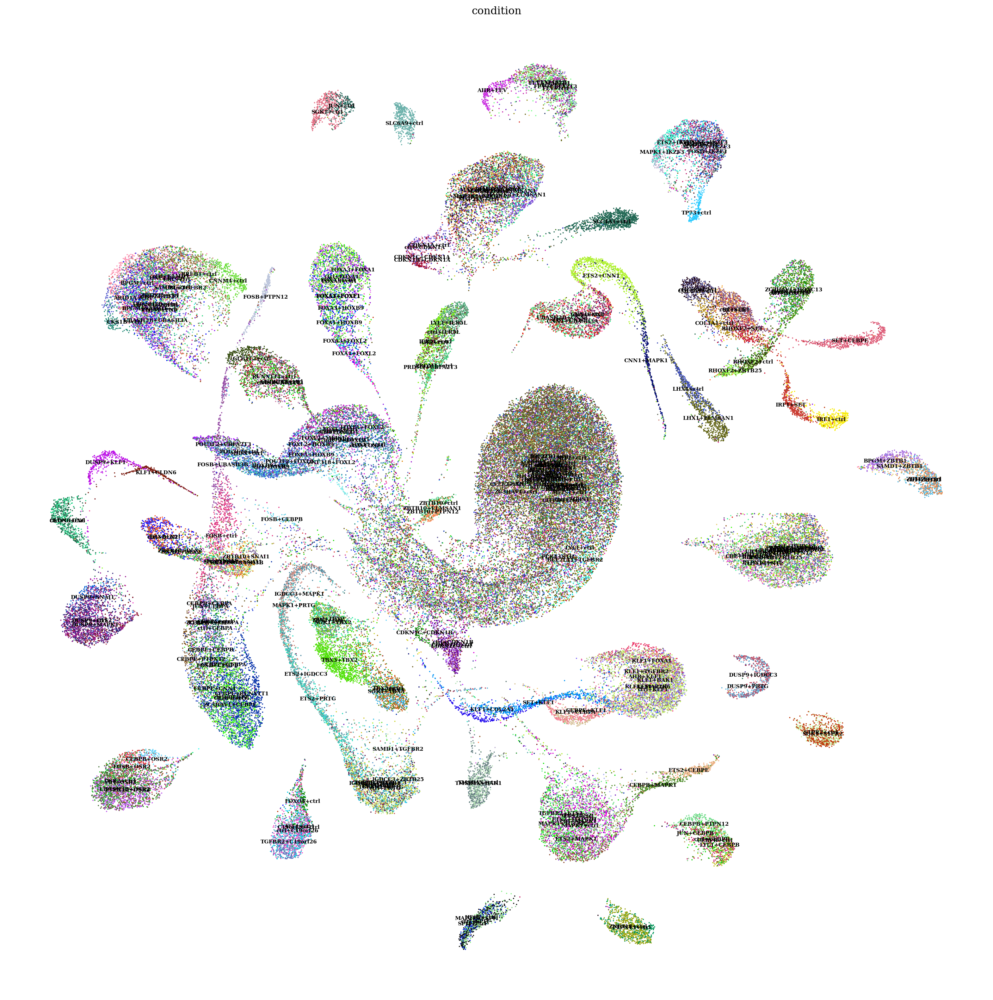

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

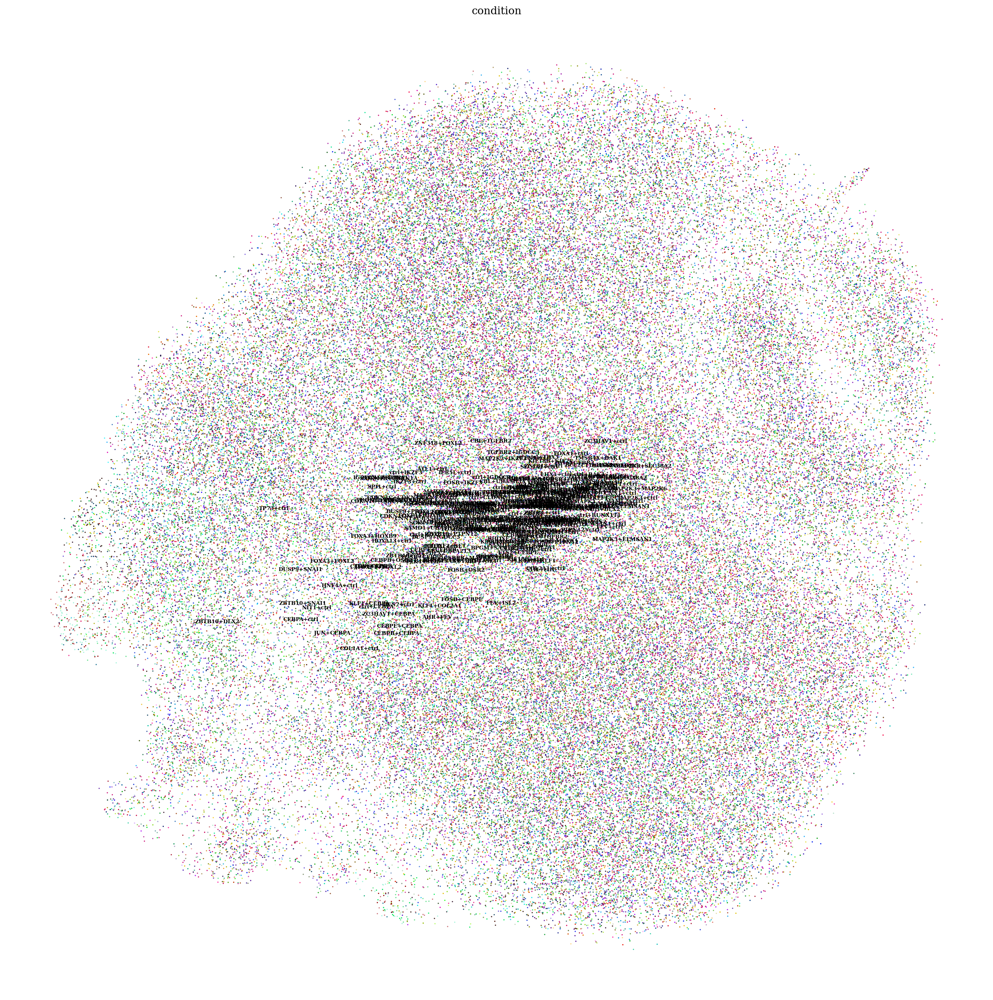

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()